# 데이터 탐색(EDA)

## 1) 데이터 불러오기

In [1]:
import pandas as pd

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submission = pd.read_csv('sample_submission.csv')

In [2]:
display(train.head(5))
display(test.head(5))
display(submission.head(5))

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
0,TRAIN_0000,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0
1,TRAIN_0001,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0
2,TRAIN_0002,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0
3,TRAIN_0003,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0
4,TRAIN_0004,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1


,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일
0,TEST_000,서류확인,223000000.0,530000,NaN,5.0,5.0,남향,1.0,1.0,불가능,NaN,7,Z86Th6S3K5,D플랫폼,2024-10-21
1,TEST_001,서류확인,150500000.0,590000,30.26,7.0,11.0,서향,1.0,1.0,불가능,16.0,11,G52Iz8V2B9,D플랫폼,2023-09-02
2,TEST_002,현장확인,47000000.0,200000,41.50,2.0,3.0,남서향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-04-03
3,TEST_003,서류확인,133000000.0,250000,31.35,5.0,6.0,남향,2.0,1.0,가능,NaN,5,C41wx1K6U9,B플랫폼,2024-09-19
4,TEST_004,현장확인,108000000.0,380000,23.14,2.0,3.0,남향,1.0,1.0,불가능,NaN,0,Z68ZJ6F6L4,A플랫폼,2024-11-10


,ID,허위매물여부
0,TEST_000,0
1,TEST_001,0
2,TEST_002,0
3,TEST_003,0
4,TEST_004,0


['ID','매물확인방식','보증금','월세','전용면적','해당층','총층','방향','방수','욕실수','주차가능여부','총주차대수','관리비','중개사무소','제공플랫폼','게재일','허위매물여부']의 피처가 존재.

타겟인 '허위매물여부'는 0과 1의 형태로 1일때가 허위매물, 0일때가 정상매물.

## 2) 데이터 타입 및 기술통계 확인

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2452 entries, 0 to 2451
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      2452 non-null   object 
 1   매물확인방식  2452 non-null   object 
 2   보증금     2452 non-null   float64
 3   월세      2452 non-null   int64  
 4   전용면적    1665 non-null   float64
 5   해당층     2223 non-null   float64
 6   총층      2436 non-null   float64
 7   방향      2452 non-null   object 
 8   방수      2436 non-null   float64
 9   욕실수     2434 non-null   float64
 10  주차가능여부  2452 non-null   object 
 11  총주차대수   1756 non-null   float64
 12  관리비     2452 non-null   int64  
 13  중개사무소   2452 non-null   object 
 14  제공플랫폼   2452 non-null   object 
 15  게재일     2452 non-null   object 
 16  허위매물여부  2452 non-null   int64  
dtypes: float64(7), int64(3), object(7)
memory usage: 325.8+ KB


먼저 전체 엔트리는 2452개

카테고리형(object) 피처에는 ['ID', '매물확인방식', '방향', '주차가능여부', '중개사무소', '제공플랫폼', '게재일']
수치형(int, float) 피처에는 ['보증금', '월세', '전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수', '관리비', '허위매물여부']

*** '게재일' 피처가 카테고리형으로 정의되어있기 때문에 변환의 필요성이 있다.

*** 결측치가 존재하는 피처는 '전용면적'(787), '해당층'(229), '총층'(16), '방수'(16), '욕실수'(18), '총주차대수'(696)

In [4]:
train = train.drop(['ID'], axis=1)

In [5]:
numerical_columns = train.select_dtypes(include=['int','float']).columns
numerical_columns = numerical_columns.drop(['허위매물여부'])
categorical_columns = train.select_dtypes(include=['object']).columns

#### (1) 수치형 데이터의 기술 통계량

보증금, 월세, 전용면적, 해당층, 총층, 방수, 욕실수, 총주차대수, 관리비'

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

train[numerical_columns].describe()

,보증금,월세,전용면적,해당층,총층,방수,욕실수,총주차대수,관리비
count,2.452000e+03,2452.000000,1665.000000,2223.000000,2436.000000,2436.000000,2434.000000,1756.000000,2452.000000
mean,1.574188e+08,380420.065253,27.009628,4.848403,8.052545,1.378079,1.034511,20.332574,5.477977
std,1.212794e+08,206425.413601,7.951757,3.543348,4.920112,0.485007,0.182575,28.939900,5.631185
min,5.000000e+06,0.000000,17.500000,1.000000,2.000000,1.000000,1.000000,1.000000,0.000000
25%,7.500000e+07,200000.000000,19.800000,2.000000,4.000000,1.000000,1.000000,4.000000,0.000000
50%,1.325000e+08,380000.000000,26.400000,4.000000,6.000000,1.000000,1.000000,10.000000,5.000000
75%,1.890000e+08,550000.000000,32.110000,6.000000,10.000000,2.000000,1.000000,31.000000,9.000000
max,4.090000e+08,750000.000000,49.970000,21.000000,21.000000,2.000000,2.000000,590.000000,96.000000


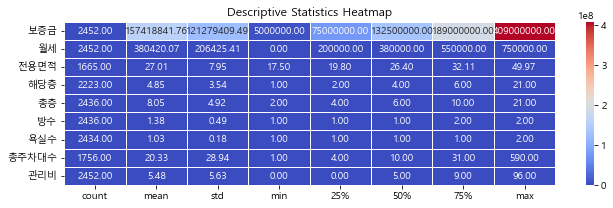

In [7]:
description = train[numerical_columns].describe().T

plt.rc('font', family='Malgun Gothic')

fig, axs = plt.subplots(figsize=(11, 3))
sns.heatmap(description, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5, ax=axs)
axs.set_title('Descriptive Statistics Heatmap')
plt.show()

보증금 - 최소값이 5 * 10^6으로 기본적으로 수치가 매우 큰 피처이다.  
중간값과 평균값이 유사하지만, 가격대가 극단적으로 높은 매물이 존재하는 것으로 보인다.  
단위변환이 필요하다.

월세 - 보증금과 마찬가지로 원 단위로 수치가 큰 피처이다. 보증금 피처와 같은 단위 변환을 적용해야 한다.  
최소값이 0, 최대값이 750000 중간값과 평균값은 유사하게 380000 정도이다.

전용면적 - 결측치가 많이 관측된다.  
전용면적이란 공용공간을 제외한 실제 거주 면적을 의미한다. 전용면적이 클수록 실제 사용 가능한 공간이 많으므로 더 높은 가치가 부여되지만, 결측치의 수가 787개로 상당수의 매물이 전용면적 정보를 제공하지 않았다. 이는 데이터 수집 시 누락되었거나, 각 매물이 다른 기준으로 정보를 보고한 결과일 수 있다.  
따라서 결측이 여부 피처를 생성하는 것을 고려해야 한다.

해당층 - 결측치가 일부 존재한다.  
최대층은 21층,  최소는 1층, 평균은 6층이다.

총층 - 결측치가 소수 존재한다.  
최소값이 2이고 평균이 6인데 최대층이 21층이다.  
해당층 피처와의 관계를 고려했을 때, 공선성이 존재할 가능성이 있다고 생각된다.

방수 - 결측치가 소수 존재한다.  
기술통계량을 통해 확인했을때, 1과 2 두개의 값만 존재하고 두 값이 꽤 균등한 분포를 가지고 있는것으로 보인다.

욕실수 - 결측치가 소수 존재한다.  
방수와 마찬가지로 1과 2 두 값만 존재하지만 극단적으로 1의 값이 많은 것으로 확인된다.

총주차대수 - 전용면적 다음으로 결측치가 많이 관측된다.  
최소값이 1이며 중간값이 10이지만, 최대값은 590으로 이상치가 많을것이라 예측된다.

관리비 - 금액과 관련된 피처이지만 보증금과 월세와는 다르게 만원단위 인것으로 확인된다.  
최소값은 0, 하위 25퍼센트인 지점도 0, 중간이 5인데 최대값이 96으로 매우 크다. 이상치가 많을 것으로 예상된다.

#### (2) 범주형 데이터의 기술 통계량

In [8]:
train[categorical_columns].describe(include=['O']).T

,count,unique,top,freq
매물확인방식,2452,3,현장확인,1705
방향,2452,8,남향,610
주차가능여부,2452,2,가능,1237
중개사무소,2452,279,G52Iz8V2B9,799
제공플랫폼,2452,13,A플랫폼,958
게재일,2452,534,2024-11-08,19


In [9]:
categorical_col = ['매물확인방식', '방향', '주차가능여부', '제공플랫폼']

for cat in categorical_col:
    unique_values = train[cat].unique().tolist()
    print('\n {0}\n'.format(cat), unique_values)


 매물확인방식
 ['현장확인', '전화확인', '서류확인']

 방향
 ['서향', '남동향', '동향', '남향', '북동향', '북향', '남서향', '북서향']

 주차가능여부
 ['가능', '불가능']

 제공플랫폼
 ['B플랫폼', 'D플랫폼', 'A플랫폼', 'C플랫폼', 'F플랫폼', 'G플랫폼', 'E플랫폼', 'J플랫폼', 'H플랫폼', 'I플랫폼', 'L플랫폼', 'K플랫폼', 'M플랫폼']


우선 범주형 데이터에는 결측치가 존재하지 않는다.

매물확인방식은 세종류 : '현장확인', '전화확인', '서류확인' 가 존재한다. 특정 매물확인방식에서 허위매물이 많이 존재하는지 확인해 봐야 할 것 같다.

방향은 '서향', '남동향', '동향', '남향', '북동향', '북향', '남서향', '북서향'의 8방향 일반적으로 남향의 집을 선호하지만 전체 데이터에 2452에 대해서 610개가 남향으로 엄청 큰 비중을 차지하지는 않는다.

주차가능여부는 '가능'과 '불가능'

제공플랫폼은 A부터 M까지 13종류의 플랫폼에서 제공되었다. 특정 제공플랫폼에서 허위매물을 많이 제공했는지를 확인해야 할 것 같다.

중개사무소는 279개가 존재하며, 'G52Iz8V2B9' 명의 중개사무소에서는 799대의 데이터를 제공했다. 특정 중개사무소에서 허위매물을 많이 제공했는지를 확인해야 할 것 같다.

## 3) 시각화를 통한 데이터 탐색

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

plt.style.use("ggplot")

#### (1) 타겟 변수

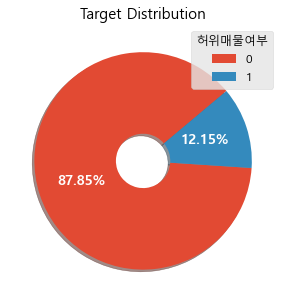

In [11]:
categories = train["허위매물여부"].value_counts().index
values = train["허위매물여부"].value_counts().values

plt.figure(figsize=(5,5))

pie_chart = plt.pie(x=values,
                    labels=categories,
                    autopct='%.2f%%',
                    shadow=True,
                    startangle=40,
                    wedgeprops=dict(width=0.75),
                    textprops=dict(color="white", fontsize=14, weight="bold"))

plt.legend(title="허위매물여부", title_fontsize=12, loc='best', fontsize=12)
plt.title('Target Distribution', size = 15)
plt.show()

허위매물인 매물의 수는 전체에 대해서 12.15%로 허위매물이 아닌 매물의 수가 약 8배에 달하는 것으로 확인되었다.

클래스의 불균형으로 인해 불균형 처리, 혹은 허위매물 여부를 탐지하는 것이기 때문에 이상탐지 모델 사용을 고려해야 할 것이다.

#### (2) 연속형 변수

'보증금', '월세', '전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수', '관리비'

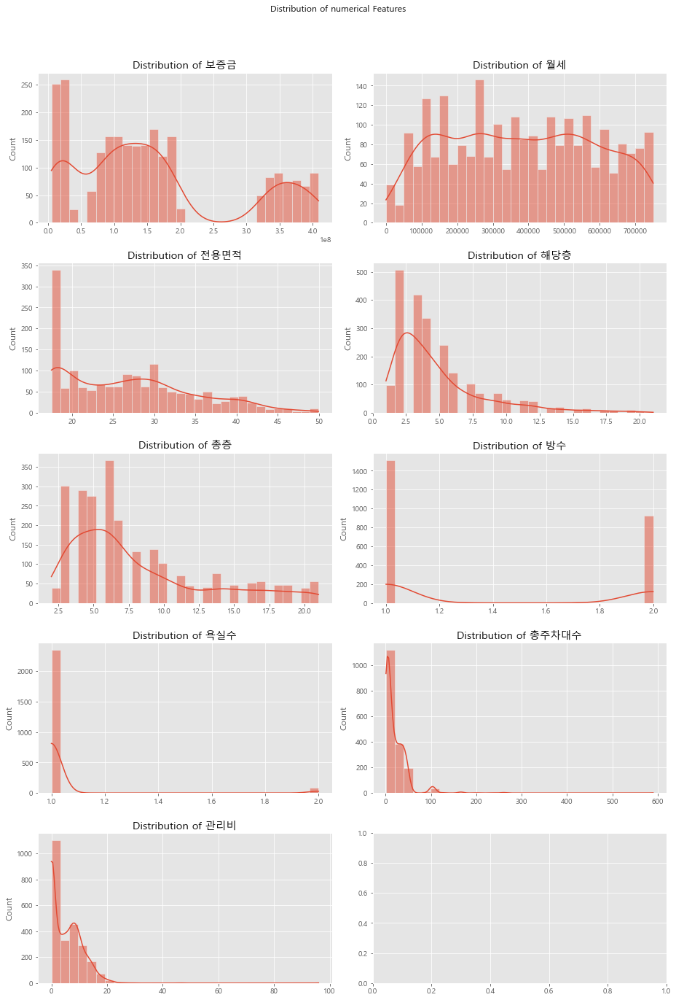

In [12]:
fig, axes = plt.subplots(5, 2, figsize=(13,20))
fig.suptitle('Distribution of numerical Features')

for i, col in enumerate(numerical_columns):
    sns.histplot(train[col], kde=True, bins=30, ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Distribution of {col}')
    axes[i//2, i%2].set_xlabel('')
    
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

보증금의 histplot을 확인해보면, 전반적인 분포가 범주화 되어있는 경향이 큰 것을 확인할 수 있다. 정규성은 따로 띄고 있지 않으며, 적절한 범주화를 통해서 더 의미있는 결과를 얻을 수 있을 것 같다.

월세의 경우 어느정도 정규성을 띄고 있다. 양끝의 밀도가 작고, 중심부의 밀도가 큰 형태이다.

전용면적은 최저값인 17.5일때 매물의 수가 극단적으로 많은 오른쪽으로 긴 꼬리의 형태를 띄고 있다. 정규성은 띄고 있지 않다. 극단적인 값들이 많이 분포하는 것으로 확인된다.

해당층은 2일때가 최대인 형태를 띄고 있으며 오른쪽으로 긴 꼬리의 형태를 띄고 있다. 극단적인 값들이 많이 분포하는 것으로 확인된다.

총층은 해당층의 그래프와 유사한 형태이지만 KDE plot의 형태가 조금 더 완만하다. 높은 층들의 밀도도 높은 형태이며 마찬가지로 오른쪽으로 긴 꼬리의 형태를 띄고 있다.

방수는 1혹은 2의 두가지 값만 존재한다. 1개의 방인 경우가 1500여건, 나머지 900여건은 방이 2개인 경우로 두 카테고리 별 매물의 수가 균등한 편이다.

욕실수는 대부분이 1개인경우이다. 예외적으로 몇개의 매물만 욕실수가 2개이다.

총주차대수는 대부분이 0의 값을 갖는다. 대부분의 매물은 총주차대수가 50미만이지만, 일부 극단적인 값들을 갖고 있는 것으로 확인된다.

관리비는 대부분 0의 값을 갖고 10일때가 수가 다시 많아지며, 20부터는 그 수가 거의 없다. 일부 극단치가 확인된다.

In [13]:
# 분포를 통한 Shapiro-Wilk 검정 (정규성 검정)

from scipy.stats import shapiro

for col in numerical_columns:
    stat, p = shapiro(train[col].dropna())
    print(f"{col}: p-value={p:.5f}")

보증금: p-value=0.00000
월세: p-value=0.00000
전용면적: p-value=0.00000
해당층: p-value=0.00000
총층: p-value=0.00000
방수: p-value=0.00000
욕실수: p-value=0.00000
총주차대수: p-value=0.00000
관리비: p-value=0.00000


플랏과 Shapiro-Wilk검정을 통해 정규성을 확인해본 결과, 정규성을 만족하는 피처는 없었다.  
따라서 이후에 연속형 변수에 대한 검정을 할때는 정규성을 가정하지 않고, ANOVA 검정이 아닌 비모수 검정(Kruskal-Wallis)을 사용하도록 하겠다.

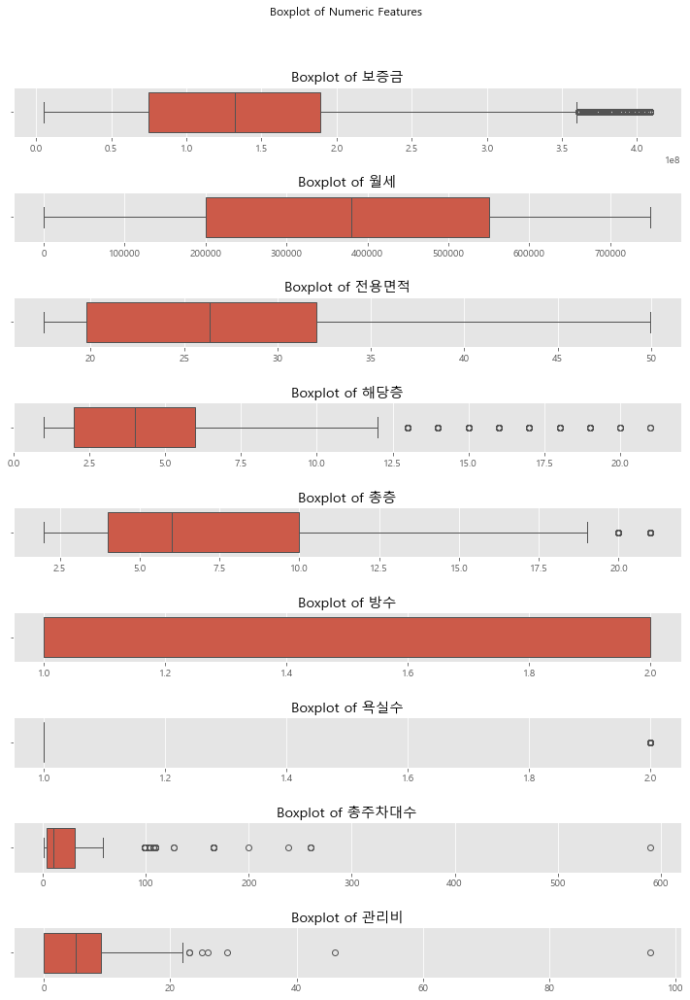

In [14]:
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(10, 15))
fig.suptitle('Boxplot of Numeric Features')

for i, col in enumerate(numerical_columns):
    sns.boxplot(x=train[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

보증금은 왼쪽으로 치우친 분포를 띄고 있다. 3.6을 넘어가는 이상치들이 여럿 분포하는 것을 확인할 수 있다.

월세는 균등한 분포를 띄고있으며 이상치는 확인되지 않는다.

전용면적은 왼쪽으로 치우친 분포를 확인할 수 있으며 이상치는 존재하지 않는다.

해당층은 12층을 넘어가는 층을 이상치로 보고 있다. 마찬가지로 왼쪽으로 치우친 분포를 하고 있다.

총층은 19층을 넘어가는 층을 이상치로 보며 마찬가지로 왼쪽으로 치우친 분포를 하고 있다.

욕실수는 2인 데이터를 이상치로 보고 있다.

총 주차대수는 50을 넘어가면 이상치로 보고 있다. 왼쪽으로 치우친 분포를 하고 있다.

관리비는 22정도를 넘어가면 이상치로 보고있다. 왼쪽으로 치우친 분포를 띄고 있다.

#### (3) 범주형 변수

'매물확인방식', '방향', '주차가능여부', '중개사무소', '제공플랫폼'

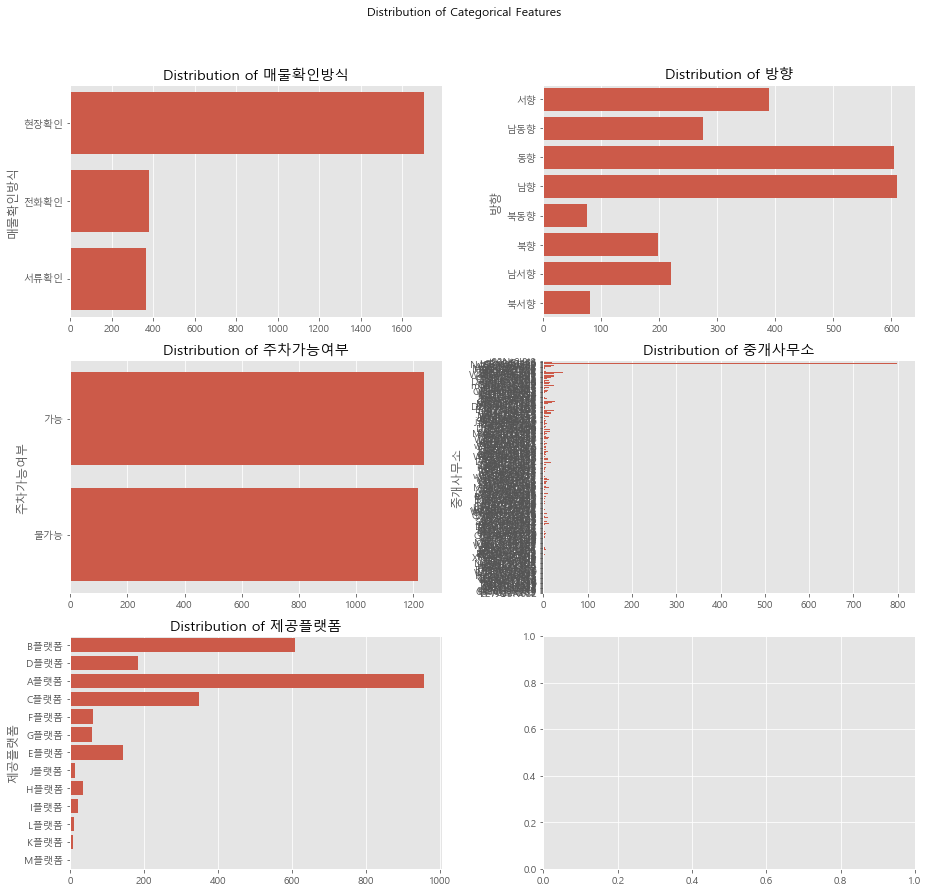

In [15]:
categorical_columns = categorical_columns.drop(['게재일'])

fig, axes = plt.subplots(3, 2, figsize=(13,13))
fig.suptitle('Distribution of Categorical Features')

for i, col in enumerate(categorical_columns):
    sns.countplot(y=col, data=train, ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Distribution of {col}')
    axes[i//2, i%2].set_xlabel('')
    
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

##### a) '매물확인방식' 별 연속형 변수의 분포

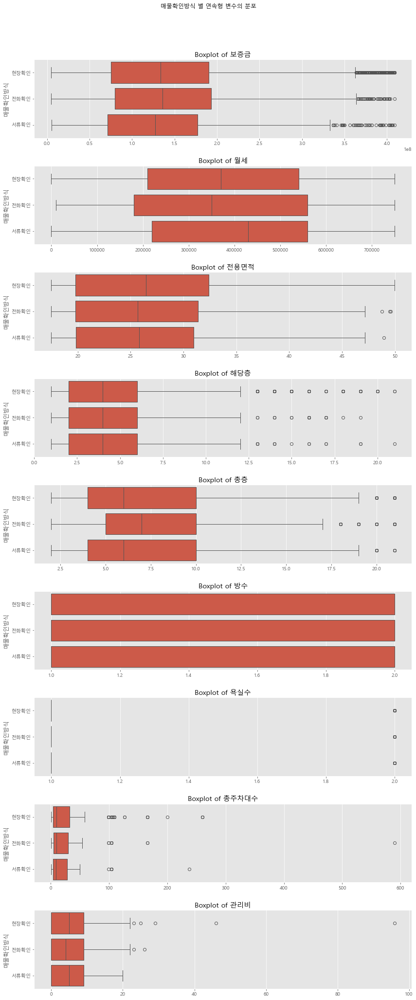

In [16]:
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(12, 30))
fig.suptitle('매물확인방식 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=train, x=col, y='매물확인방식', ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

매물확인방식 별 연속형 분포를 확인한 결과, 매물확인방식 피처와 각 수치형 변수들은 독립적이라 판단된다.

##### b) '방향' 별 연속형 변수의 분포

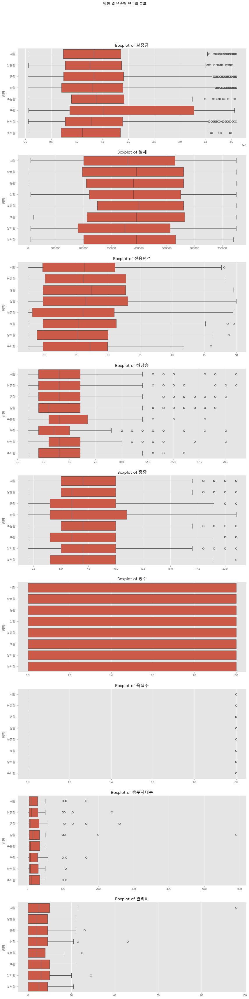

In [17]:
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(12, 50))
fig.suptitle('방향 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=train, x=col, y='방향', ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

방향 별로 다른 연속형 변수들은 무관한 분포를 가졌지만, 보증금 피처에서는 방향이 '북향'일때 중앙값과 평균치가 다른 방향일때보다 많이 높은 것을 확인할 수 있다.

In [18]:
train.groupby('방향')['보증금'].mean()

방향
남동향    1.529873e+08
남서향    1.550545e+08
남향     1.561098e+08
동향     1.586281e+08
북동향    1.662533e+08
북서향    1.488875e+08
북향     1.738510e+08
서향     1.537481e+08
Name: 보증금, dtype: float64

In [19]:
# 보증금 2억 이상인 매물 수 계산
high_deposit_counts = train[train["보증금"] > 200000000].groupby("방향")["보증금"].count()

# 각 방향별 전체 매물 수 계산
total_counts = train.groupby("방향")["보증금"].count()

# 비율 계산
deposit_ratio = (high_deposit_counts / total_counts)

deposit_ratio

방향
남동향    0.196364
남서향    0.209091
남향     0.219672
동향     0.221488
북동향    0.226667
북서향    0.200000
북향     0.257576
서향     0.195373
Name: 보증금, dtype: float64

In [20]:
# Kruskal-Wallis(범주형 3개 이상, 보증금 피처가 정규성 만족하지 않음)

from scipy.stats import kruskal

# 방향별 보증금 데이터를 리스트로 변환
category_groups = [train[train["방향"] == cat]["보증금"] for cat in train["방향"].unique()]

# Kruskal-Wallis 검정 수행
h_stat, p_value = kruskal(*category_groups)

print(f"Kruskal-Wallis 검정 결과: H-statistic={h_stat:.4f}, p-value={p_value:.4f}")

Kruskal-Wallis 검정 결과: H-statistic=5.7183, p-value=0.5730


통계적으로 방향피처와 보증금피처사이의 독립성이 없다고 판단된다.  
하지만 북향 피처에서의 특징을 살려서 북향 / 북향이 아닌 방향으로 나눠본다면

In [21]:
# Mann-Whitney U검정

from scipy.stats import mannwhitneyu

train_north = train.copy()

train_north["Is_North"] = (train_north["방향"] == "북향").astype(int)

# 북향 vs 나머지 방향별 보증금 평균 비교
north_avg_deposit = train_north.groupby("Is_North")["보증금"].mean()
print(north_avg_deposit)

# 북향과 나머지 방향의 보증금 데이터 추출
north_deposit = train_north[train_north["Is_North"] == 1]["보증금"]
other_deposit = train_north[train_north["Is_North"] == 0]["보증금"]

# 검정 수행
u_stat, p_value = mannwhitneyu(north_deposit, other_deposit, alternative='two-sided')
print(f"Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")

Is_North
0    1.559754e+08
1    1.738510e+08
Name: 보증금, dtype: float64
Mann-Whitney U 검정 결과: U-statistic=242697.0000, p-value=0.0407


유의수준보다 작은 p값을 갖기 때문에 방향을 북향과 북향이 아닌 방향으로 나누어 분석하는 것은 유의미해 보인다.

##### c) '주차가능여부' 별 연속형 변수의 분포

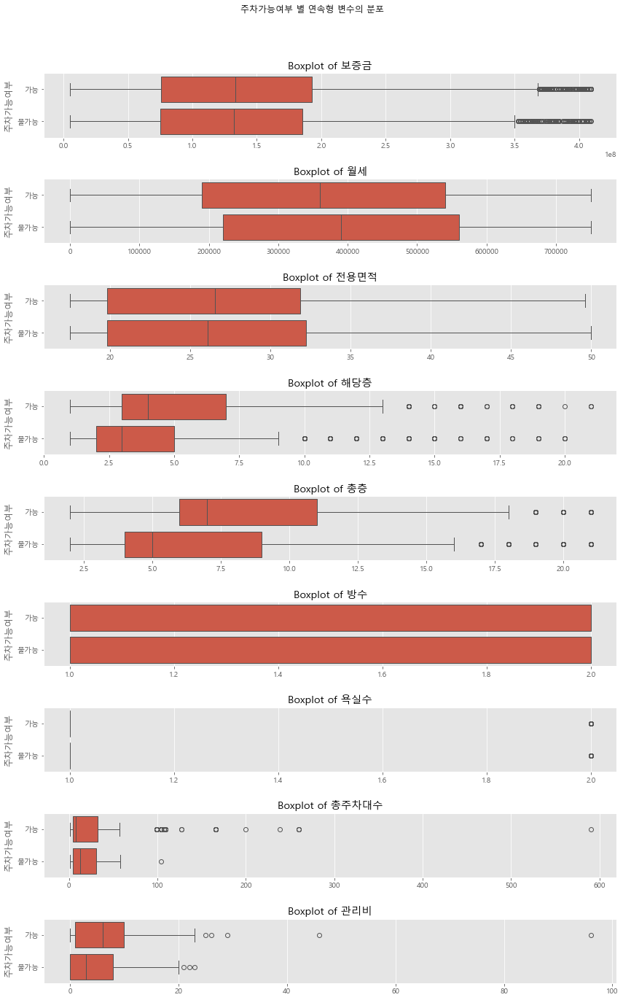

In [22]:
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(12, 20))
fig.suptitle('주차가능여부 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=train, x=col, y='주차가능여부', ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

월세, 해당층, 총층, 관리비 피처에서 주차가능여부가 가능인지 불가능인지에 따라 차이를 보이고 있다.  
마찬가지로 ANOVA를 통해서 확인해보자.

In [23]:
# Mann-Whitney U검정 - 주차가능여부(카테고리수가 2개)별 연속형피처(정규성을 만족하지 않음)의 차이가 유의미한지

from scipy.stats import mannwhitneyu

MW_columns_parking = ['월세', '해당층', '총층', '관리비']

for col in MW_columns_parking :
    
    train_MW_parking = train.copy()
    train_MW_parking = train_MW_parking.dropna(subset=[col])

    group1 = train_MW_parking[train_MW_parking["주차가능여부"] == "가능"][col]
    group2 = train_MW_parking[train_MW_parking["주차가능여부"] == "불가능"][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"주차가능여부 별 {col}의 차이가 유의미한지 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")

주차가능여부 별 월세의 차이가 유의미한지 Mann-Whitney U 검정 결과: U-statistic=709057.0000, p-value=0.0155
주차가능여부 별 해당층의 차이가 유의미한지 Mann-Whitney U 검정 결과: U-statistic=776600.0000, p-value=0.0000
주차가능여부 별 총층의 차이가 유의미한지 Mann-Whitney U 검정 결과: U-statistic=962489.5000, p-value=0.0000
주차가능여부 별 관리비의 차이가 유의미한지 Mann-Whitney U 검정 결과: U-statistic=869448.0000, p-value=0.0000


Mann-Whitney U검정으로 월세, 해당층, 총층, 관리비의 분포가 주차가능여부에 따라서 유의미한 차이를 보인다는 것을 확인하였다.

-> '주차가능여부' 피처는 다양한 피처들과 연관된 매우 중요한 피처인것으로 예상된다.

##### d) '중개사무소' 별 연속형 변수의 분포

카테고리수가 너무 많기때문에 상위 5개의 항목들에 대해서만 확인

In [24]:
train.groupby('중개사무소')['허위매물여부'].count().sort_values(ascending=False)

중개사무소
G52Iz8V2B9    799
r82ax9M3U3     43
J52gJ2E4T6     32
H90uE4C0W5     30
b87Td0W4Y3     27
             ... 
T73aE8D6J9      1
V71Gz2X2C5      1
W16wO7Z4R5      1
W21YE0L9W3      1
A06Nz2Z1R1      1
Name: 허위매물여부, Length: 279, dtype: int64

In [25]:
office_five_name = ['G52Iz8V2B9','r82ax9M3U3','J52gJ2E4T6','H90uE4C0W5','b87Td0W4Y3']

train_office_five = train[train['중개사무소'].isin(office_five_name)]

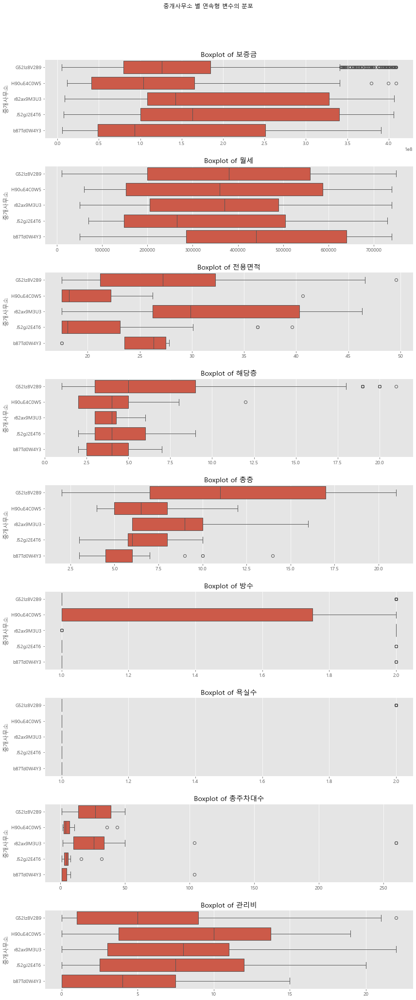

In [26]:
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(12, 30))
fig.suptitle('중개사무소 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=train_office_five, x=col, y='중개사무소', ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

중개사무소별 연속형 변수의 분포를 확인한 결과, 욕실수 피처를 제외하고는 분포의 차이를 보이는듯 하다. 이를 확인해보면, 

In [27]:
# Kruskal-Wallis 검정 - 중개사무소(카테고리수 5개)별 연속형피처(정규성 만족하지않음)의 차이가 유의미한지

from scipy.stats import kruskal

kruskal_columns_office = ['보증금', '월세', '전용면적', '해당층', '총층', '방수', '총주차대수', '관리비']

for col in kruskal_columns_office :
    
    train_kruskal_office = train_office_five.copy()
    train_kruskal_office = train_kruskal_office.dropna(subset=[col])

    # 중개사무소별 해당층 데이터를 리스트로 변환
    category_groups = [train_kruskal_office[train_kruskal_office["중개사무소"] == cat][col] for cat in train_kruskal_office["중개사무소"].unique()]

    # Kruskal-Wallis  검정 수행
    h_stat, p_value = kruskal(*category_groups)

    print(f"중개사무소 별로 {col}의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic={h_stat:.4f}, p-value={p_value:.4f}")

중개사무소 별로 보증금의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=10.0614, p-value=0.0394
중개사무소 별로 월세의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=4.1920, p-value=0.3806
중개사무소 별로 전용면적의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=43.8300, p-value=0.0000
중개사무소 별로 해당층의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=11.5623, p-value=0.0209
중개사무소 별로 총층의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=75.9008, p-value=0.0000
중개사무소 별로 방수의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=98.4109, p-value=0.0000
중개사무소 별로 총주차대수의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=95.1546, p-value=0.0000
중개사무소 별로 관리비의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=20.4142, p-value=0.0004


확인결과, 중개사무소 피처와 월세를 제외한 다른 연속형 피처들과의 관계도 중요하게 작용하는 것 같다.  
카테고리수가 많지만 주요 변수로 판단되기 때문에 재범주화를 통해 사용을 고려해야한다.

##### e) '제공플랫폼' 별 연속형 변수의 분포

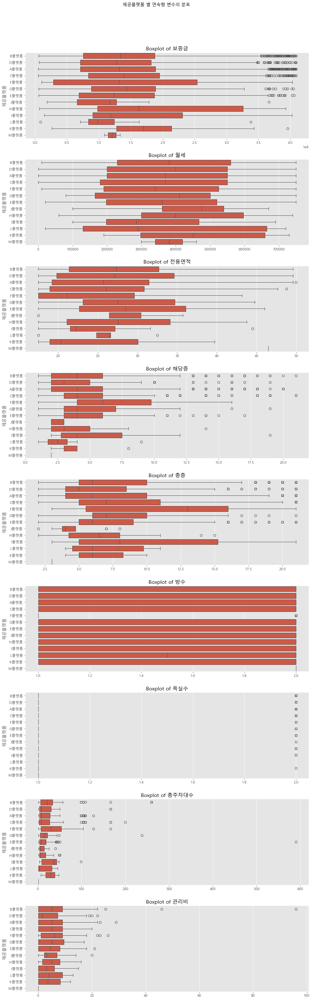

In [28]:
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(12, 40))
fig.suptitle('제공플랫폼 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=train, x=col, y='제공플랫폼', ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [29]:
# Kruskal-Wallis 분석 - 제공플랫폼(카테고리수 3개 이상)별 연속형피처의 차이가 유의미한지

from scipy.stats import kruskal

kruskal_columns_platform = ['보증금','월세','전용면적','해당층','총층','총주차대수']

for col in kruskal_columns_platform :
    
    train_kruskal_platform = train.copy()
    train_kruskal_platform = train_kruskal_platform.dropna(subset=[col])

    # 제공플랫폼별 해당층 데이터를 리스트로 변환
    category_groups = [train_kruskal_platform[train_kruskal_platform["제공플랫폼"] == cat][col] for cat in train_kruskal_platform["제공플랫폼"].unique()]

    # Kruskal-Wallis 검정 수행
    h_stat, p_value = kruskal(*category_groups)

    print(f" 제공플랫폼별 {col}의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic={h_stat:.4f}, p-value={p_value:.4f}")

 제공플랫폼별 보증금의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=10.8260, p-value=0.5439
 제공플랫폼별 월세의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=7.5284, p-value=0.8208
 제공플랫폼별 전용면적의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=38.1754, p-value=0.0001
 제공플랫폼별 해당층의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=49.7548, p-value=0.0000
 제공플랫폼별 총층의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=51.9023, p-value=0.0000
 제공플랫폼별 총주차대수의 차이가 유의미한지 Kruskal-Wallis 검정 결과: H-statistic=72.6315, p-value=0.0000


제공플랫폼 별로 연속형 변수들의 분포도 확인해본 결과, '전용면적','해당층','총층','총주차대수' 네 피처에서 차이가 유의미하다는 결과가 나왔다. 제공플랫폼 피처도 중요 변수일 가능성이 있으며, 추후에 재범주화, 파생변수 생성시 주의해야 할 것이다.

#### (4) 시계열 변수

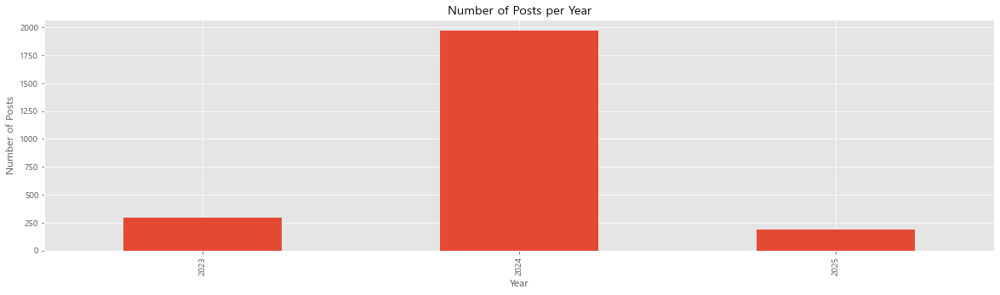

In [30]:
train_dt = train.copy()

train_dt['게재일'] = pd.to_datetime(train_dt['게재일'], format='%Y-%m-%d')

train_dt['year'] = train_dt['게재일'].dt.year

train_dt['year'].value_counts().sort_index().plot(kind='bar', figsize=(20,5))
plt.xlabel("Year")
plt.ylabel("Number of Posts")
plt.title("Number of Posts per Year")
plt.show()

연도별 매물의 수를 확인해보면 2024년이 대부분을 차지하며 2023년과, 2025년의 데이터는 거의 분포하지 않는다.

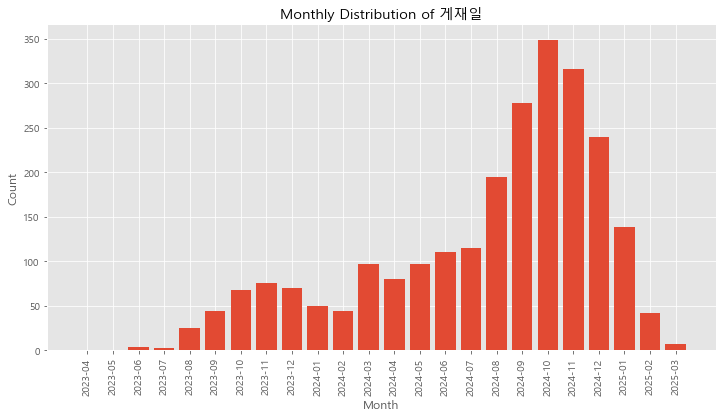

In [31]:
train_time_series = train_dt.groupby(train_dt['게재일'].dt.date).size()


train_dt = train_dt.set_index("게재일")

monthly_counts = train_dt.resample('M').size()

plt.figure(figsize=(12,6))
plt.bar(x=range(len(monthly_counts)), height=monthly_counts)
plt.title('Monthly Distribution of 게재일')
plt.xlabel('Month')
plt.ylabel('Count')

plt.xticks(ticks=range(len(monthly_counts)), labels=monthly_counts.index.strftime('%Y-%m'), rotation=90)

plt.show()

전반적으로 2024년의 데이터 이지만, 2023년에도 유독 10월과 1월 사이에 데이터의 수가 많으며 2024년에도 마찬가지로 10월과 1월 사이에서 가장 데이터의 수가 많음을 알 수 있다.

실제 사례들을 살펴보자면 연말 이사철/ 입시 및 취업시즌/ 세금 및 투자자 매도 영향 등의 이유로 10월~12월 사이에 매물이 많아지는 경향을 띈다.

계절별로의 주기적인 변화를 관찰할 수는 있지만, 데이터가 많지 않으므로 속단할 수는 없을 것 같다.

-> 타겟과의 관계를 통해서 사인/코사인변환, 연/월/일 분해, 범주화 중에 어떤 변환을 할지 판단해야 할 것 같다.

## 4) 결측치 탐색

#### (1) 결측치 유무 및 패턴확인

In [32]:
import numpy as np

train_miss_frame = train[train.columns[train.isnull().any(axis=0)]]

train_miss = pd.DataFrame({
    'missing': train_miss_frame.isnull().sum(),
    'ratio': np.round(train_miss_frame.isnull().sum() / train_miss_frame.shape[0], 4) * 100
})

display(train_miss)

,missing,ratio
전용면적,787,32.10
해당층,229,9.34
총층,16,0.65
방수,16,0.65
욕실수,18,0.73
총주차대수,696,28.38


결측치가 존재하는 피처는 총 6개로, 전용면적과 총주차대수 피처의 경우 30퍼센트에 육박하는 결측비율을 가지고 있다. 그다음으로는 해당층이 10퍼센트, 1퍼센트 미만의 결측치를 갖는 피처는 총층, 방수, 욕실수 세 피처가 존재한다.

In [33]:
missing_col = ['전용면적','해당층','총층','방수','욕실수','총주차대수']
missing_col_over_ten = ['전용면적','해당층','총주차대수']

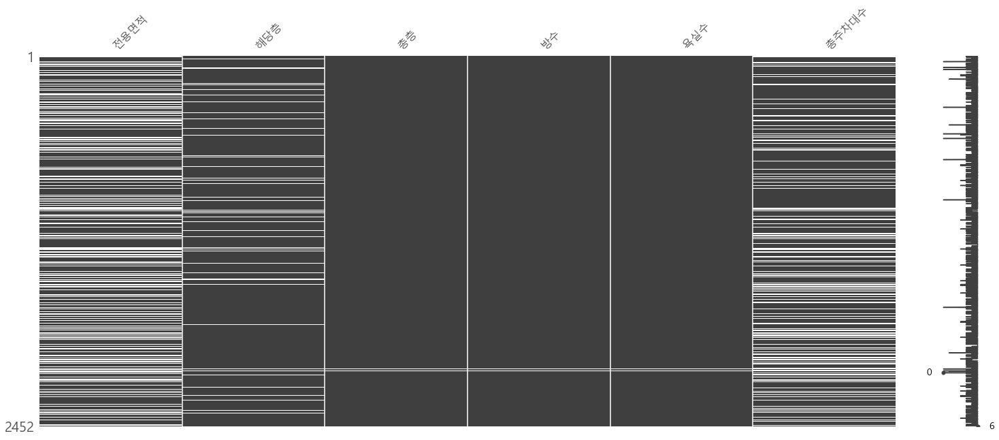

In [34]:
import missingno as msno
msno.matrix(train[missing_col])
plt.show()

총층과 방수, 욕실수에서 발생하는 결측치의 패턴이 매우 유사한 것을 확인할 수 있다. 해당 세 피처의 결측치를 묶어서 한번에 처리하거나, 세 피처에서 결측치가 발생한경우 제거하는 등의 방법을 고려해야 할 것이다.

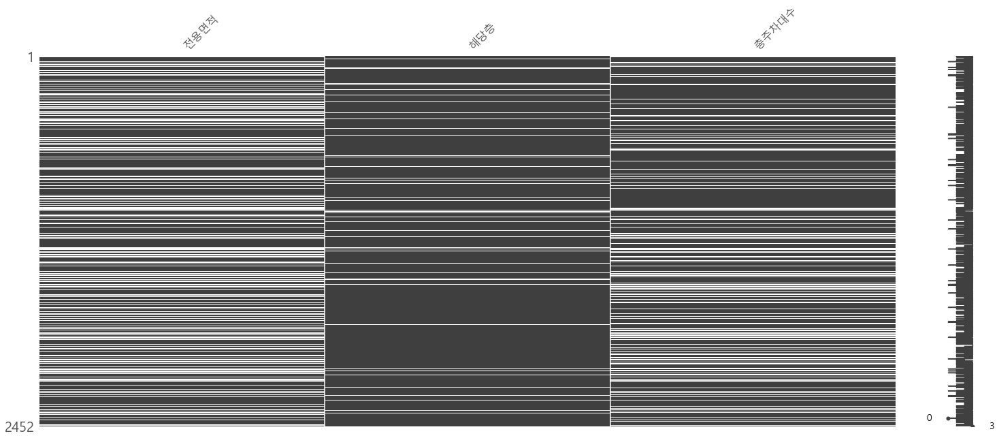

In [35]:
msno.matrix(train[missing_col_over_ten])
plt.show()

결측 비율이 높은 피처들간의 결측치 패턴을 확인한 결과, 눈에 띄는 패턴은 확인할 수 없었다.

#### (2) 결측치 간의 상관관계

In [36]:
train_missing = train.copy()

In [37]:
for i, col in enumerate(missing_col):
    train_missing[f'{col}_결측여부'] = train_missing[col].isnull().astype(int)

In [38]:
whether_missing_cols = ['전용면적_결측여부','해당층_결측여부','총층_결측여부','방수_결측여부','욕실수_결측여부','총주차대수_결측여부']

In [39]:
train_missing.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,중개사무소,제공플랫폼,게재일,허위매물여부,전용면적_결측여부,해당층_결측여부,총층_결측여부,방수_결측여부,욕실수_결측여부,총주차대수_결측여부
0,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,...,t93Nt6I2I0,B플랫폼,2024-10-09,0,1,1,0,0,0,0
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,q39iV5J4E6,D플랫폼,2024-12-26,0,1,0,0,0,0,1
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,b03oE4G3F6,A플랫폼,2024-11-28,0,1,0,0,0,0,1
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,G52Iz8V2B9,A플랫폼,2024-11-26,0,0,0,0,0,0,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,N45gM0M7R0,B플랫폼,2024-06-25,1,1,0,0,0,0,1


In [40]:
train_missing[whether_missing_cols].corr()

,전용면적_결측여부,해당층_결측여부,총층_결측여부,방수_결측여부,욕실수_결측여부,총주차대수_결측여부
전용면적_결측여부,1.000000,-0.001502,0.117880,0.117880,0.114849,0.404198
해당층_결측여부,-0.001502,1.000000,0.252507,0.252507,0.251515,-0.000005
총층_결측여부,0.117880,0.252507,1.000000,1.000000,0.942422,0.083792
방수_결측여부,0.117880,0.252507,1.000000,1.000000,0.942422,0.083792
욕실수_결측여부,0.114849,0.251515,0.942422,0.942422,1.000000,0.073016
총주차대수_결측여부,0.404198,-0.000005,0.083792,0.083792,0.073016,1.000000


결측치가 존재하는 피처들의 결측치 여부간의 상관관계를 확인한 결과, 방수와 총층의 결측여부의 상관계수는 1, 방수와 욕실, 욕실수와 총층의 상관계수는 0.942422로 매우 크게 나타났다. 또한 전용면적과 총주차대수 결측여부 피처간의 상관계수는 0.4로 꽤 크게 나타났고, 해당층결측 피처는 방수, 총층, 욕실수와 0.25정도의 상관계수를 갖는다.

-> 방수와 욕실수, 총층의 경우 16~18개의 매물로 매우 적은양의 매물에 대해서만 결측값을 보이므로 같은 방식으로 처리해주는 방향으로 설정.

-> 전용면적 피처가 결측치를 가질수록, 총주차대수도 결측치를 가질 확률이 높음. 두 피처간의 관계도 확인해봐야 한다.

#### (3) 타겟 변수와의 관계

In [41]:
for col in whether_missing_cols:
    print(f'{col} 이 결측일때 의 허위매물 비율은', train_missing[train_missing[col]==1]['허위매물여부'].mean())
    print(f'{col} 이 결측이 아닐때 의 허위매물 비율은', train_missing[train_missing[col]==0]['허위매물여부'].mean())

전용면적_결측여부 이 결측일때 의 허위매물 비율은 0.17662007623888182
전용면적_결측여부 이 결측이 아닐때 의 허위매물 비율은 0.09549549549549549
해당층_결측여부 이 결측일때 의 허위매물 비율은 0.2314410480349345
해당층_결측여부 이 결측이 아닐때 의 허위매물 비율은 0.11021142600089968
총층_결측여부 이 결측일때 의 허위매물 비율은 0.25
총층_결측여부 이 결측이 아닐때 의 허위매물 비율은 0.1206896551724138
방수_결측여부 이 결측일때 의 허위매물 비율은 0.25
방수_결측여부 이 결측이 아닐때 의 허위매물 비율은 0.1206896551724138
욕실수_결측여부 이 결측일때 의 허위매물 비율은 0.2222222222222222
욕실수_결측여부 이 결측이 아닐때 의 허위매물 비율은 0.12078882497945768
총주차대수_결측여부 이 결측일때 의 허위매물 비율은 0.1752873563218391
총주차대수_결측여부 이 결측이 아닐때 의 허위매물 비율은 0.10022779043280182


In [42]:
# 결측여부 피처와 허위매물여부 피처의 독립성확인(카이제곱 검정)

from scipy.stats import chi2_contingency

for col in whether_missing_cols:
    contingency_table = pd.crosstab(train_missing[col], train_missing["허위매물여부"])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table) 

    print(f"{col}: Chi-square statistic = {chi2_stat:.4f}, p-value = {p_value:.4f}")

전용면적_결측여부: Chi-square statistic = 32.1867, p-value = 0.0000
해당층_결측여부: Chi-square statistic = 27.4550, p-value = 0.0000
총층_결측여부: Chi-square statistic = 1.4257, p-value = 0.2325
방수_결측여부: Chi-square statistic = 1.4257, p-value = 0.2325
욕실수_결측여부: Chi-square statistic = 0.9029, p-value = 0.3420
총주차대수_결측여부: Chi-square statistic = 25.6046, p-value = 0.0000


총층, 방수, 욕실수 피처의 경우 결측치의 수가 너무 적기때문에 유의수준 이상의 값을 보인다.  
나머지 총주차대수, 전용면적, 해당층 피처의 경우 결측여부에 따른 허위매물여부의 차이를 보이기 때문에 추후에도 적절히 사용하는 것이 좋아 보인다.

한가지 확인할 점은, 결측과 비결측 데이터간의 허위매물 비율을 보면, 전 피처에 대해서 결측이면 허위매물의 비율이 0.17-0.25로 높은 수준을 유지하는 반면, 결측치가 아닐때의 허위매물 비율은 0.09-0.12로 낮은 수준을 유지한다. 이러한 점이 패턴으로서 나타나는지 확인해보자.

In [43]:
train_missing["결측치_개수"] = train_missing.isnull().sum(axis=1)

missing_mean = train_missing.groupby("결측치_개수")["허위매물여부"].mean().reset_index(name="허위매물비율")
missing_count =  train_missing.groupby("결측치_개수")["허위매물여부"].size().reset_index(name="매물수")

pd.merge(missing_mean, missing_count)

,결측치_개수,허위매물비율,매물수
0,0,0.065149,1274
1,1,0.184366,678
2,2,0.176087,460
3,3,0.208333,24
4,5,0.000000,4
5,6,0.333333,12


In [44]:
contingency_table = pd.crosstab(train_missing["결측치_개수"], train_missing["허위매물여부"])
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table) 

print(f"결측치_개수: Chi-square statistic = {chi2_stat:.4f}, p-value = {p_value:.4f}")

결측치_개수: Chi-square statistic = 83.1203, p-value = 0.0000


결측치는 개수에 따라서 허위매물의 비율이 변하는 것을 통해서 결측치 개수 피처를 생성하는 것은 타당해 보인다.

허위매물의 비율이 비슷한 1-2개를 합치고, 3,5,6을 합쳐서 재범주화하는 것을 고려해보자.

#### (4) 시간의존성 확인

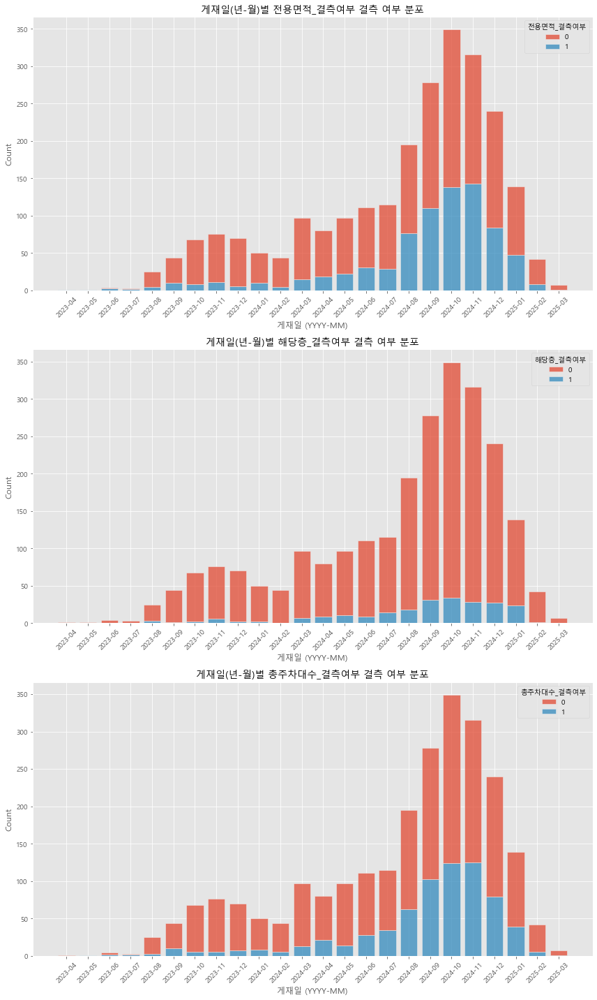

In [45]:
train_missing["게재일"] = pd.to_datetime(train_missing['게재일'], format='%Y-%m-%d')

train_missing["게재일_년월"] = train_missing["게재일"].dt.to_period("M")  # 'YYYY-MM' 형태 유지 (Period 타입)

whether_missing_cols_lots = ["전용면적_결측여부", "해당층_결측여부", "총주차대수_결측여부"]

train_missing = train_missing.sort_values(by="게재일_년월")

fig, axes = plt.subplots(3, 1, figsize=(12, 20)) 

for i, col in enumerate(whether_missing_cols_lots):
    sns.histplot(data=train_missing, x=train_missing["게재일_년월"].astype(str), hue=col, multiple="stack", shrink=0.8, bins=len(train_missing["게재일_년월"].unique()), ax=axes[i])
    axes[i].set_title(f"게재일(년-월)별 {col} 결측 여부 분포", fontsize=14)
    axes[i].set_xlabel("게재일 (YYYY-MM)")
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis="x", rotation=45)  # X축 라벨 회전

plt.tight_layout()
plt.show()

년-월별로 날짜를 카테고리화 하여 확인해본 결과, 특정 기간동안에 결측치가 포함된 매물의 수가 높은 경향성을 보이고 있다.  
총 결측치 갯수를 확인해보면,

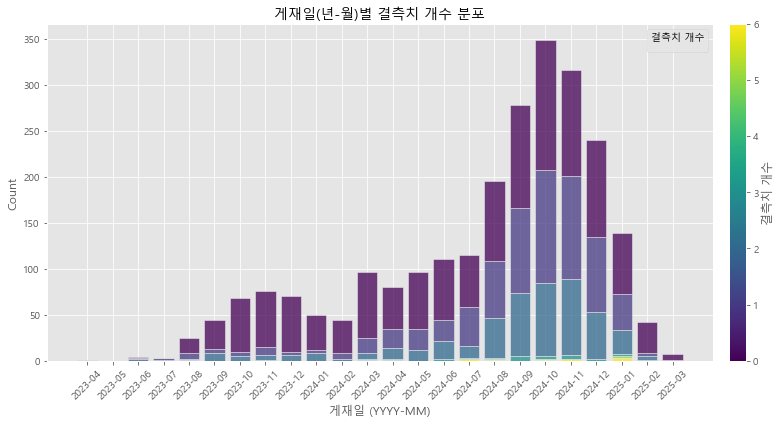

In [46]:
# 그래프 그리기
plt.figure(figsize=(12, 6))
hist = sns.histplot(data=train_missing, x=train_missing["게재일_년월"].astype(str), hue="결측치_개수", multiple="stack",
                    shrink=0.8, bins=len(train_missing["게재일_년월"].unique()), palette="viridis")

# 색상 범례 추가
norm = plt.Normalize(train_missing["결측치_개수"].min(), train_missing["결측치_개수"].max())  # 색상 범위 정규화
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])  # 컬러바 설정
cbar = plt.colorbar(sm, ax=hist, pad=0.02)  # 컬러바 추가
cbar.set_label("결측치 개수")  # 컬러바 라벨 설정

# 그래프 설정
plt.title("게재일(년-월)별 결측치 개수 분포", fontsize=14)
plt.xlabel("게재일 (YYYY-MM)")
plt.ylabel("Count")
plt.xticks(rotation=45)  # X축 라벨 회전
plt.legend(title="결측치 개수")

plt.tight_layout()
plt.show()

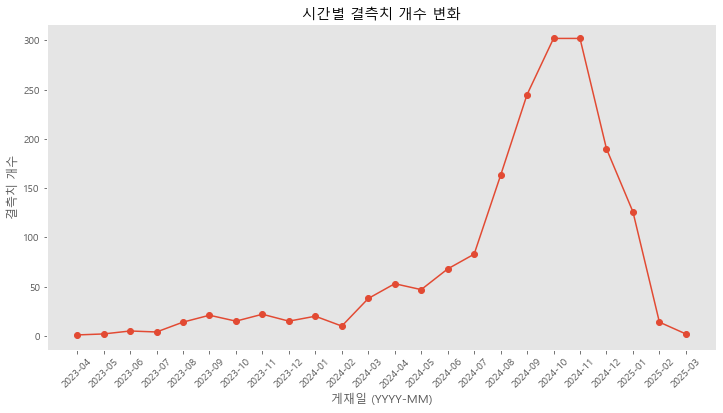

In [47]:
# 월별 결측치 개수 집계
missing_trend = train_missing.groupby("게재일_년월")["결측치_개수"].sum()

# 시계열 플롯
plt.figure(figsize=(12,6))
plt.plot(missing_trend.index.astype(str), missing_trend.values, marker='o', linestyle='-')
plt.xticks(rotation=45)
plt.title("시간별 결측치 개수 변화")
plt.xlabel("게재일 (YYYY-MM)")
plt.ylabel("결측치 개수")
plt.grid()
plt.show()


특정 기간에 결측치의 개수가 급격히 증가하는 경향을 보이고 있고, 결측치의 갯수가 타겟과의 상관관계도 확인했으므로, 게재일 피처도 타겟예측에 있어서 중요한 변수로 판단된다. 따라서 적절히 범주화 하여 사용하는 것을 고려해야 한다.

결측치를 채울떄, 패턴을 반영하여 해당 시기의 데이터를 참고하여 채우는 등의 방법을 고려.

#### (5) 특정 변수와의 관계

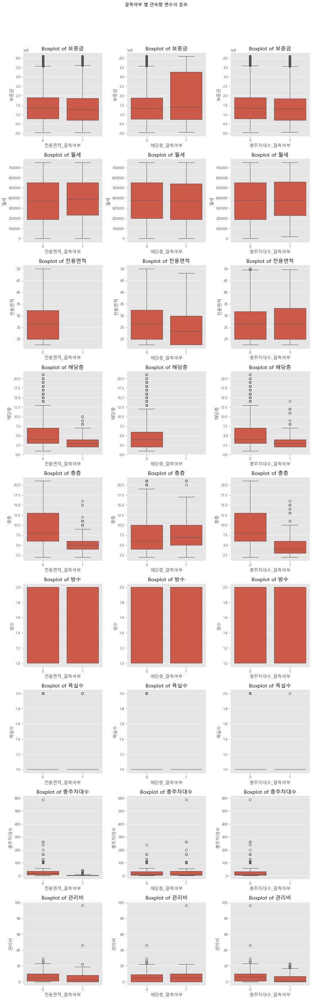

In [48]:
# 결측여부와 연속형 변수

whether_missing_cols_lots = ["전용면적_결측여부", "해당층_결측여부", "총주차대수_결측여부"]

fig, axes = plt.subplots(len(numerical_columns), len(whether_missing_cols_lots), figsize=(12, 40))
fig.suptitle('결측여부 별 연속형 변수의 분포')

for i, missing_col in enumerate(whether_missing_cols_lots):
    for j, col in enumerate(numerical_columns):
        sns.boxplot(data=train_missing, x=missing_col, y=col, ax=axes[j,i])
        axes[j,i].set_title(f'Boxplot of {col}')
        axes[j,i].set_xlabel(missing_col)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

전용면적 결측여부는 해당층, 총층, 총주차대수와 연관이 있어 보이며, 해당층 결측여부는 보증금, 전용면적과, 마지막으로 총주차대수 결측여부는 관리비, 총층과 해당층 피처와 연관이 있어 보인다.

In [49]:
# 결측여부와 연속형 변수간의 연관성을 확인하기 위한 Mann-Whitney U 검정

area_check_col = ['해당층','총층','총주차대수']
floor_check_col = ['보증금','전용면적']
parking_check_col = ['관리비','총층','해당층']

# 전용면적 결측여부와 area_check_col
for col in area_check_col:
    train_non_missing_area = train_missing.copy()
    train_non_missing_area = train_non_missing_area.dropna(subset=[col])
    
    group1 = train_non_missing_area[train_non_missing_area["전용면적_결측여부"] == 0][col]
    group2 = train_non_missing_area[train_non_missing_area["전용면적_결측여부"] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"전용면적 결측여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")
    
# 해당층 결측여부와 floor_check_col
for col in floor_check_col:
    train_non_missing_floor = train_missing.copy()
    train_non_missing_floor = train_non_missing_floor.dropna(subset=[col])
    
    group1 = train_non_missing_floor[train_non_missing_floor["해당층_결측여부"] == 0][col]
    group2 = train_non_missing_floor[train_non_missing_floor["해당층_결측여부"] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"해당층 결측여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")

# 총주차대수 결측여부와 parking_check_col
for col in parking_check_col:
    train_non_missing_parking = train_missing.copy()
    train_non_missing_parking = train_non_missing_parking.dropna(subset=[col])
    
    group1 = train_non_missing_parking[train_non_missing_parking["총주차대수_결측여부"] == 0][col]
    group2 = train_non_missing_parking[train_non_missing_parking["총주차대수_결측여부"] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"총주차대수 결측여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")

전용면적 결측여부와 해당층의 Mann-Whitney U 검정 결과: U-statistic=732615.0000, p-value=0.0000
전용면적 결측여부와 총층의 Mann-Whitney U 검정 결과: U-statistic=1004695.0000, p-value=0.0000
전용면적 결측여부와 총주차대수의 Mann-Whitney U 검정 결과: U-statistic=419372.5000, p-value=0.0000
해당층 결측여부와 보증금의 Mann-Whitney U 검정 결과: U-statistic=243538.5000, p-value=0.2811
해당층 결측여부와 전용면적의 Mann-Whitney U 검정 결과: U-statistic=138285.5000, p-value=0.0003
총주차대수 결측여부와 관리비의 Mann-Whitney U 검정 결과: U-statistic=788494.0000, p-value=0.0000
총주차대수 결측여부와 총층의 Mann-Whitney U 검정 결과: U-statistic=964919.0000, p-value=0.0000
총주차대수 결측여부와 해당층의 Mann-Whitney U 검정 결과: U-statistic=710906.0000, p-value=0.0000


전용면적 결측여부와 해당층, 총층, 총주차대수 피처는 유의미한 관계에 있다.  
해당층 결측여부는 전용면적 피처와 유의미한 관계에 있다.  
총주차대수 결측여부는 관리비, 총층, 해당층과 유의미한 관계가 있다.

-> 해당 피처의 결측치를 채울 때, 연관피처들을 중심으로 활용하여 보완하는 방식을 고려.

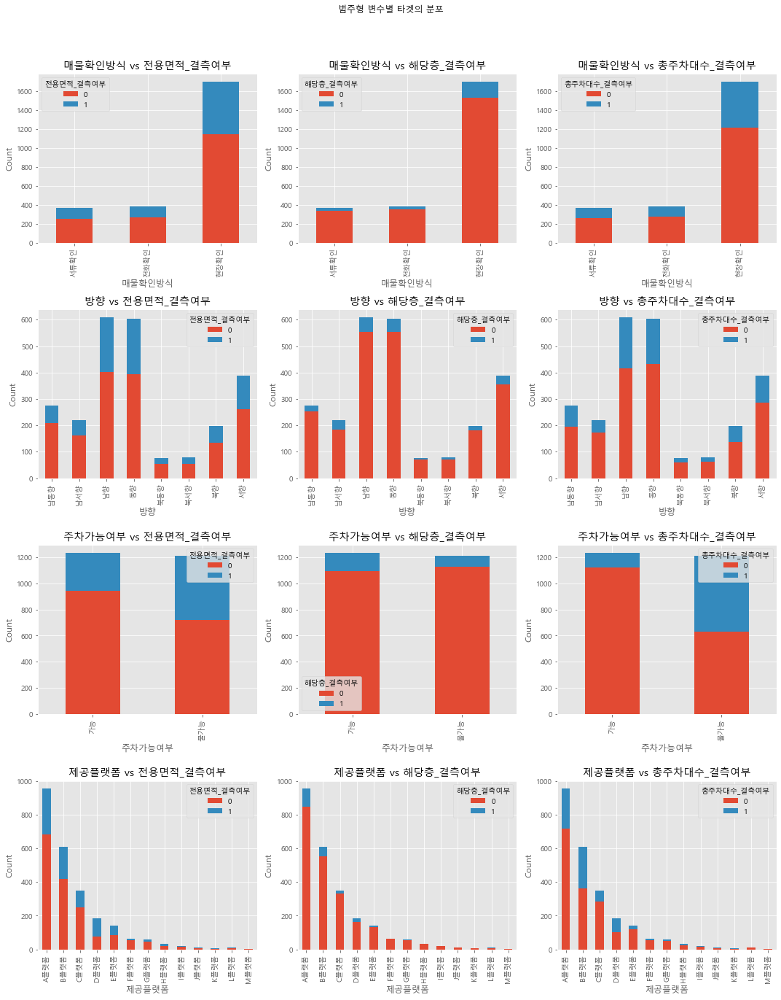

In [50]:
# 결측여부와 범주형 변수

whether_missing_cols_lots = ["전용면적_결측여부", "해당층_결측여부", "총주차대수_결측여부"]
categorical_columns = ["매물확인방식", "방향", "주차가능여부", "제공플랫폼"]

# 서브플롯 생성 (4x3)
fig, axes = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('범주형 변수별 타겟의 분포')

# 그래프 그리기
for i, cat in enumerate(categorical_columns):  # i: 행 (범주형 변수)
    for j, col in enumerate(whether_missing_cols_lots):  # j: 열 (결측 여부 변수)
        target_counts = train_missing.groupby([cat, col]).size().unstack()
        target_counts.plot(kind='bar', stacked=True, ax=axes[i, j])  # 올바른 서브플롯 위치

        axes[i, j].set_title(f'{cat} vs {col}')
        axes[i, j].set_xlabel(cat)
        axes[i, j].set_ylabel("Count")

# 그래프 레이아웃 조정 및 출력
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [51]:
whether_missing_cols = ['전용면적_결측여부','해당층_결측여부','총주차대수_결측여부']
checking_cols = ['매물확인방식','방향','주차가능여부','제공플랫폼']

for missing_col in whether_missing_cols:
    
    for checking_col in checking_cols:
        
        contingency_table = pd.crosstab(train_missing[checking_col], train_missing[missing_col])
        chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table) 

        print(f"{missing_col}과 {checking_col}: Chi-square statistic = {chi2_stat:.4f}, p-value = {p_value:.4f}")

전용면적_결측여부과 매물확인방식: Chi-square statistic = 0.7090, p-value = 0.7015
전용면적_결측여부과 방향: Chi-square statistic = 16.1701, p-value = 0.0236
전용면적_결측여부과 주차가능여부: Chi-square statistic = 80.2350, p-value = 0.0000
전용면적_결측여부과 제공플랫폼: Chi-square statistic = 87.7048, p-value = 0.0000
해당층_결측여부과 매물확인방식: Chi-square statistic = 1.7491, p-value = 0.4171
해당층_결측여부과 방향: Chi-square statistic = 13.3697, p-value = 0.0636
해당층_결측여부과 주차가능여부: Chi-square statistic = 14.0181, p-value = 0.0002
해당층_결측여부과 제공플랫폼: Chi-square statistic = 29.2226, p-value = 0.0037
총주차대수_결측여부과 매물확인방식: Chi-square statistic = 0.3926, p-value = 0.8217
총주차대수_결측여부과 방향: Chi-square statistic = 14.1495, p-value = 0.0486
총주차대수_결측여부과 주차가능여부: Chi-square statistic = 460.8253, p-value = 0.0000
총주차대수_결측여부과 제공플랫폼: Chi-square statistic = 130.2774, p-value = 0.0000


카이제곱 분석 결과(결측여부와 범주형변수)  

전용면적 결측여부는 방향, 주차가능여부, 제공플랫폼에 대해서 차이가 유의미하다는 결과가 나옴.  
해당층 결측여부는 주차가능여부와 제공플랫폼에 대해서 차이가 유의미하다는 결과가 나옴.  
총주차대수 결측여부는 방향과 주차가능여부, 제공플랫폼에 대해서 유의미하다는 결과가 나옴.

## 5) 이상치 탐색

In [52]:
train_outlier = train.copy()

train_outlier.columns

Index(['매물확인방식', '보증금', '월세', '전용면적', '해당층', '총층', '방향', '방수', '욕실수', '주차가능여부',
       '총주차대수', '관리비', '중개사무소', '제공플랫폼', '게재일', '허위매물여부'],
      dtype='object')

#### (1) 군집형태 확인

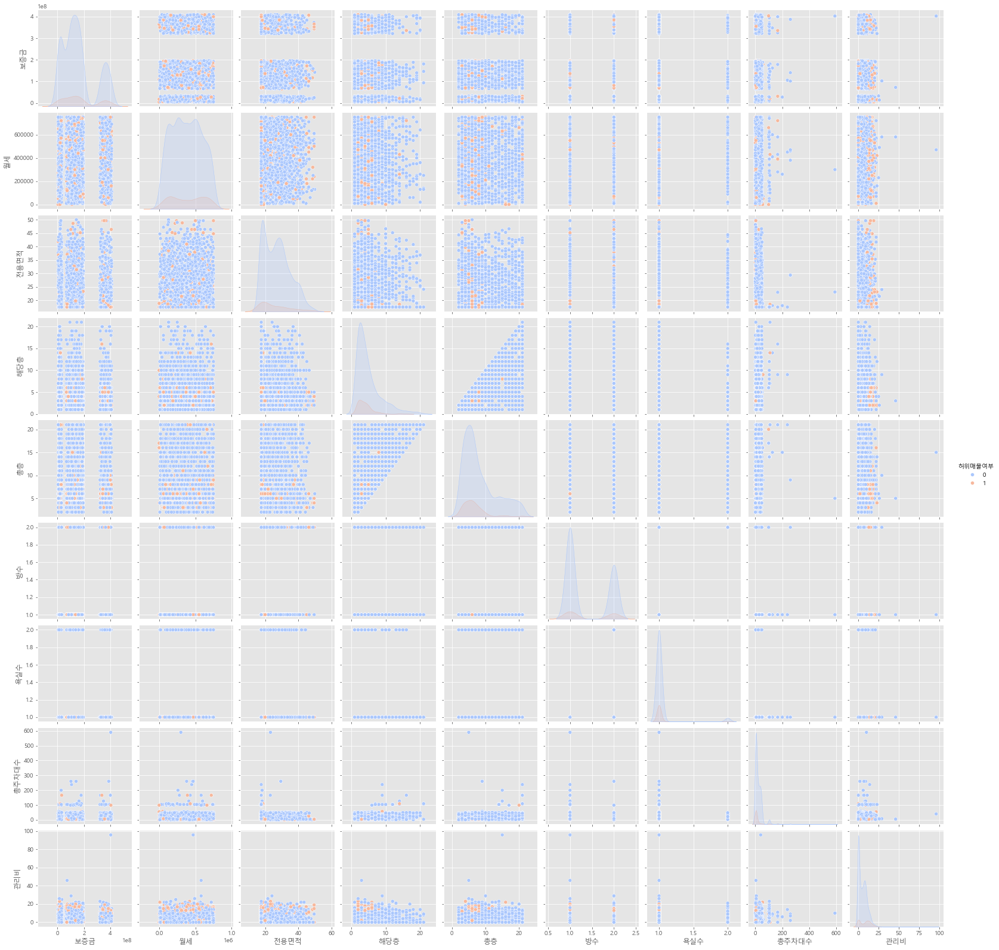

In [53]:
# 산점도를 통한 군집확인

numerical_columns = train_outlier.select_dtypes(include=['int','float']).columns
numerical_columns = list(numerical_columns)

sns.pairplot(train_outlier[numerical_columns], hue="허위매물여부", palette="coolwarm")
plt.show()

단순히 산점도를 통해서는 데이터가 군집의 형태를 띄는지 확인하기 쉽지 않다.

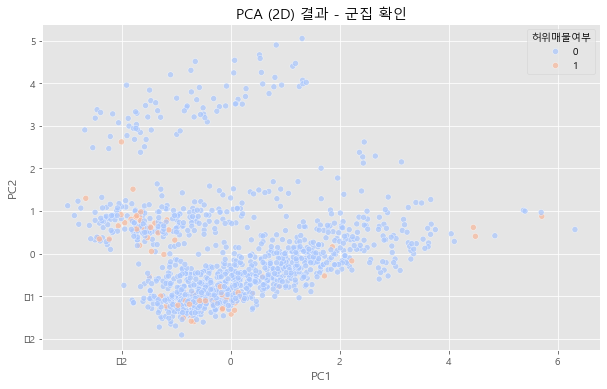

In [54]:
# PCA(주성분분석)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 사용할 수치형 변수 선택 (카테고리형 변수 제거)
numerical_columns = ['보증금', '월세', '전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수', '관리비']

# 결측치 제거 (결측치가 있는 행을 제거한 후 인덱스를 유지)
train_pca = train_outlier[numerical_columns].dropna()

# '허위매물여부'도 동일한 인덱스로 필터링
train_pca_target = train_outlier.loc[train_pca.index, "허위매물여부"]

# 데이터 스케일링 (PCA는 거리 기반이므로 표준화 필요)
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_pca)

# PCA 수행 (2개의 주성분으로 차원 축소)
pca = PCA(n_components=2)
train_pca_2d = pca.fit_transform(train_scaled)

# 변환된 데이터를 데이터프레임으로 저장 (인덱스 유지)
train_pca_df = pd.DataFrame(train_pca_2d, columns=['PC1', 'PC2'], index=train_pca.index)
train_pca_df["허위매물여부"] = train_pca_target.values  # 동일한 인덱스로 할당

# 산점도를 통해 군집 확인
plt.figure(figsize=(10,6))
sns.scatterplot(x="PC1", y="PC2", hue="허위매물여부", data=train_pca_df, palette="coolwarm", alpha=0.7)
plt.title("PCA (2D) 결과 - 군집 확인")
plt.show()

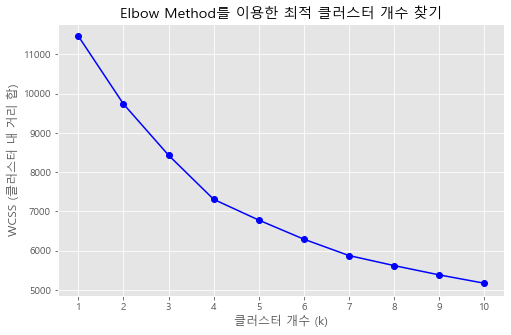

In [55]:
# KMeans 클러스터 개수 확인

from sklearn.cluster import KMeans

numerical_columns = ['보증금', '월세', '전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수', '관리비']

# 결측치 제거 및 데이터 스케일링
train_kmeans = train_outlier[numerical_columns].dropna()
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_kmeans)

# WCSS(클러스터 내 거리 합) 계산
wcss = []
K_range = range(1, 11)  # 1~10개의 클러스터 개수 테스트

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(train_scaled)
    wcss.append(kmeans.inertia_)  # WCSS 저장

# WCSS 변화 그래프 (Elbow Method 시각화)
plt.figure(figsize=(8,5))
plt.plot(K_range, wcss, marker='o', linestyle='-', color='b')
plt.xlabel("클러스터 개수 (k)")
plt.ylabel("WCSS (클러스터 내 거리 합)")
plt.title("Elbow Method를 이용한 최적 클러스터 개수 찾기")
plt.xticks(K_range)
plt.grid(True)
plt.show()


In [56]:
# 실루엣 계수 확인

from sklearn.metrics import silhouette_score

best_k = 2
best_score = -1

for k in range(2, 11):  # 클러스터 개수 2~10 테스트
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(train_scaled)
    score = silhouette_score(train_scaled, cluster_labels)  # 실루엣 점수 계산
    
    if score > best_score:
        best_score = score
        best_k = k

print(f"최적의 클러스터 개수: {best_k}, 실루엣 점수: {best_score:.4f}")

최적의 클러스터 개수: 5, 실루엣 점수: 0.2015


KMeans 클러스터를 확인하기 위한 그래프에서 엘보우의 위치가 명확하지 않으며, 실루엣 계수 점수가 0.5 미만으로 군집의 형태가 명확하지 않은 것을 확인할 수 있다. 따라서 이상치 탐지에 IQR이나 Z-score을 사용해야 한다.

#### (2) 정규성 확인

앞서 플랏을 통해 확인한 바로는 '월세' 피처를 제외하곤 정규성을 확인하기 어려웠다.

In [57]:
# Shapiro-Wilk 검정 (정규성 검정)

from scipy.stats import shapiro

for col in numerical_columns:
    stat, p = shapiro(train_outlier[col].dropna())
    print(f"{col}: p-value={p:.5f}")

보증금: p-value=0.00000
월세: p-value=0.00000
전용면적: p-value=0.00000
해당층: p-value=0.00000
총층: p-value=0.00000
방수: p-value=0.00000
욕실수: p-value=0.00000
총주차대수: p-value=0.00000
관리비: p-value=0.00000


Shapiro-Wilk 검정에서도 마찬가지로 정규성을 확인하기 어려웠다.

#### (3) 사분위수를 통한 이상치 탐지

In [58]:
# 퀀타일 함수와 IQR 계산 함수

def out_iqr(df, column):

    q25, q75 = np.quantile(df[column], 0.25), np.quantile(df[column], 0.75)
    iqr = q75 - q25
    lower, upper = q25 - (iqr * 1.5), q75 + (iqr * 1.5)

    df1 = df[df[column] > upper]
    df2 = df[df[column] < lower]
    total_outliers = df1.shape[0] + df2.shape[0]

    return iqr, lower, upper, total_outliers

IQR을 통한 이상치 탐지결과 보증금 피처의 iqr값은 114000000.0, 하한값은 -96000000.0, 상한값은 360000000.0, 이상치의 갯수는 279입니다.
IQR을 통한 이상치 탐지결과 월세 피처의 iqr값은 350000.0, 하한값은 -325000.0, 상한값은 1075000.0, 이상치의 갯수는 0입니다.
IQR을 통한 이상치 탐지결과 전용면적 피처의 iqr값은 12.309999999999999, 하한값은 1.3350000000000044, 상한값은 50.574999999999996, 이상치의 갯수는 0입니다.
IQR을 통한 이상치 탐지결과 해당층 피처의 iqr값은 4.0, 하한값은 -4.0, 상한값은 12.0, 이상치의 갯수는 104입니다.
IQR을 통한 이상치 탐지결과 총층 피처의 iqr값은 6.0, 하한값은 -5.0, 상한값은 19.0, 이상치의 갯수는 95입니다.
IQR을 통한 이상치 탐지결과 방수 피처의 iqr값은 1.0, 하한값은 -0.5, 상한값은 3.5, 이상치의 갯수는 0입니다.
IQR을 통한 이상치 탐지결과 욕실수 피처의 iqr값은 0.0, 하한값은 1.0, 상한값은 1.0, 이상치의 갯수는 84입니다.
IQR을 통한 이상치 탐지결과 총주차대수 피처의 iqr값은 27.0, 하한값은 -36.5, 상한값은 71.5, 이상치의 갯수는 60입니다.
IQR을 통한 이상치 탐지결과 관리비 피처의 iqr값은 9.0, 하한값은 -13.5, 상한값은 22.5, 이상치의 갯수는 7입니다.


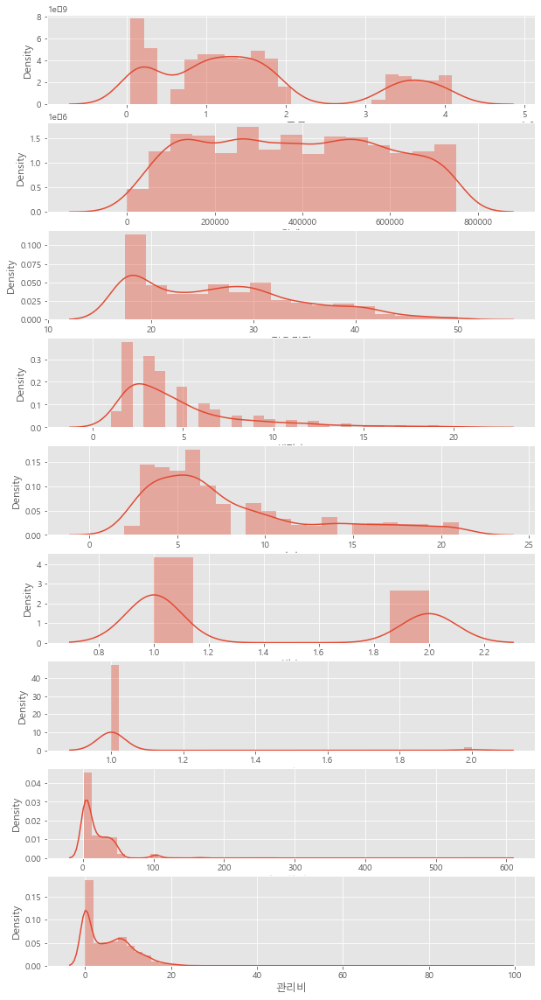

In [59]:
numerical_columns = ['보증금', '월세', '전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수', '관리비']

fig, axes = plt.subplots(len(numerical_columns),1, figsize=(10, 20))

for i, col in enumerate(numerical_columns):
    
    train_removed = train_outlier.dropna(subset=[col])
    
    iqr_original, lower_original, upper_original, total_outliers_original = out_iqr(train_removed, col)
    sns.distplot(train_outlier[col], kde=True, ax=axes[i])
    
    print(f'IQR을 통한 이상치 탐지결과 {col} 피처의 iqr값은 {iqr_original}, 하한값은 {lower_original}, 상한값은 {upper_original}, 이상치의 갯수는 {total_outliers_original}입니다.')
    
plt.show()

확인 결과, 월세와 방수 피처를 제외하고 대부분의 연속형 피처에서 이상치가 탐지되었다.

해당 이상치들이 어떤의미를 가지는지 우선적으로 분석해보자.

#### (4) 이상치들간의 관계

In [60]:
# 이상치 비율 저장할 딕셔너리
outlier_ratios = {}

# 전체 데이터 개수
total_entries = len(train_outlier)

# 각 수치형 피처별 IQR 이상치 비율 계산
for col in numerical_columns:
    q25, q75 = np.quantile(train_outlier[col].dropna(), 0.25), np.quantile(train_outlier[col].dropna(), 0.75)
    iqr = q75 - q25
    lower, upper = q25 - (iqr * 1.5), q75 + (iqr * 1.5)

    # 이상치 개수 계산
    outlier_count = ((train_outlier[col] < lower) | (train_outlier[col] > upper)).sum()
    
    # 이상치 비율 계산
    outlier_ratio = (outlier_count / total_entries) * 100
    outlier_ratios[col] = outlier_ratio

# 결과 출력
outlier_ratios_df = pd.DataFrame.from_dict(outlier_ratios, orient='index', columns=['이상치 비율(%)'])

outlier_ratios_df

,이상치 비율(%)
보증금,11.378467
월세,0.000000
전용면적,0.000000
해당층,4.241436
총층,3.874388
방수,0.000000
욕실수,3.425775
총주차대수,2.446982
관리비,0.285481


이상치의 비율이 너무 낮지 않은 피처들에 대해서 이상치 여부들 간의 상관계수를 계산해보면

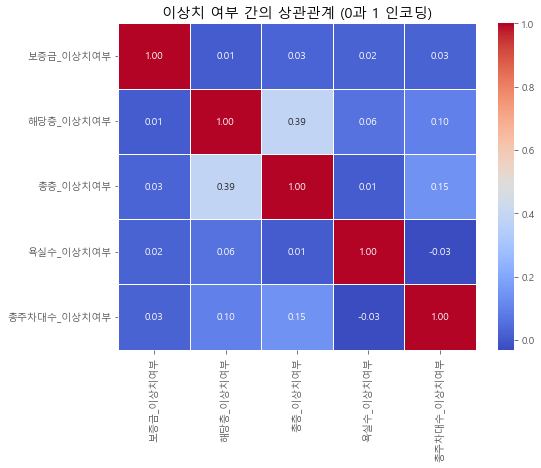

In [61]:
# 이상치 여부를 체크할 피처 선택 (이상치 비율이 높은 피처들만)
outlier_check_columns = ['보증금', '해당층', '총층', '욕실수', '총주차대수']

# 이상치 여부를 저장할 데이터프레임 생성
outlier_flags = pd.DataFrame(index=train_outlier.index)

for col in outlier_check_columns:
    q25, q75 = np.quantile(train_outlier[col].dropna(), 0.25), np.quantile(train_outlier[col].dropna(), 0.75)
    iqr = q75 - q25
    lower, upper = q25 - (iqr * 1.5), q75 + (iqr * 1.5)

    # 이상치 여부 추가 (0과 1로 변환)
    outlier_flags[col + "_이상치여부"] = ((train_outlier[col] < lower) | (train_outlier[col] > upper)).astype(int)

# 이상치 여부 간의 상관계수 계산
outlier_corr = outlier_flags.corr()

# 히트맵 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(outlier_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("이상치 여부 간의 상관관계 (0과 1 인코딩)")
plt.show()

총층과 해당층의 경우, 이상치 여부간의 상관계수가 0.39로 매우 높았으며  
총주차대수는 해당층, 총층과 0.1, 0.15로 꽤 높은 상관계수를 가지고 있다.

In [62]:
# 스피어만 상관계수를 통한 피처간 이상치 여부간의 관계

from scipy.stats import spearmanr

# 총층 이상치 여부 vs 해당층 이상치 여부
corr, p_value = spearmanr(outlier_flags["총층_이상치여부"], outlier_flags["해당층_이상치여부"])
print(f"총층 이상치 여부와 해당층 이상치 여부의 스피어만 상관계수: {corr:.4f}, p-value: {p_value:.4f}")

# 총층 이상치 여부 vs 총주차대수 이상치 여부
corr, p_value = spearmanr(outlier_flags["총층_이상치여부"], outlier_flags["총주차대수_이상치여부"])
print(f"총층 이상치 여부와 총주차대수 이상치 여부의 스피어만 상관계수: {corr:.4f}, p-value: {p_value:.4f}")

# 해당층 이상치 여부 vs 총주차대수 이상치 여부
corr, p_value = spearmanr(outlier_flags["해당층_이상치여부"], outlier_flags["총주차대수_이상치여부"])
print(f"해당층 이상치 여부와 총주차대수 이상치 여부의 스피어만 상관계수: {corr:.4f}, p-value: {p_value:.4f}")

총층 이상치 여부와 해당층 이상치 여부의 스피어만 상관계수: 0.3877, p-value: 0.0000
총층 이상치 여부와 총주차대수 이상치 여부의 스피어만 상관계수: 0.1460, p-value: 0.0000
해당층 이상치 여부와 총주차대수 이상치 여부의 스피어만 상관계수: 0.0976, p-value: 0.0000


상관계수가 클수록 더 강한 상관관계를 띈다.  

총층-해당층의 경우 유의미한 양의 상관관계  
총층-총주차대수의 경우 유의미한 약한 양의 상관관계  
해당층-총주차대수의 경우는 유의미한 매우 약한 양의 상관관계를 띈다.

#### (5) 이상치와 타겟과의 관계

In [63]:
train_outlier_add_flags = train_outlier.copy()

train_outlier_add_flags = pd.concat([train_outlier_add_flags, outlier_flags], axis=1)

train_outlier_add_flags.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,보증금_이상치여부,해당층_이상치여부,총층_이상치여부,욕실수_이상치여부,총주차대수_이상치여부
0,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,...,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,1,0,0,0,0
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,0,q39iV5J4E6,D플랫폼,2024-12-26,0,0,0,0,0,0
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,0,b03oE4G3F6,A플랫폼,2024-11-28,0,0,0,0,0,0
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,0,0,0,0,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,0,N45gM0M7R0,B플랫폼,2024-06-25,1,0,0,0,0,0


In [64]:
train_outlier_add_flags[['허위매물여부','보증금_이상치여부','해당층_이상치여부','총층_이상치여부','욕실수_이상치여부','총주차대수_이상치여부']].corr()

,허위매물여부,보증금_이상치여부,해당층_이상치여부,총층_이상치여부,욕실수_이상치여부,총주차대수_이상치여부
허위매물여부,1.000000,0.008223,-0.059700,-0.042335,-0.049468,-0.010438
보증금_이상치여부,0.008223,1.000000,0.007433,0.027887,0.024304,0.026375
해당층_이상치여부,-0.059700,0.007433,1.000000,0.387677,0.060492,0.097646
총층_이상치여부,-0.042335,0.027887,0.387677,1.000000,0.008662,0.146018
욕실수_이상치여부,-0.049468,0.024304,0.060492,0.008662,1.000000,-0.029829
총주차대수_이상치여부,-0.010438,0.026375,0.097646,0.146018,-0.029829,1.000000


In [65]:
from scipy.stats import chi2_contingency

chi_check_columns = ['보증금_이상치여부','해당층_이상치여부','총층_이상치여부','욕실수_이상치여부','총주차대수_이상치여부']

for col in chi_check_columns:
    
    contingency_table = pd.crosstab(train_outlier_add_flags["허위매물여부"], train_outlier_add_flags[col])

    # 카이제곱 검정 수행
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"{col}과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

보증금_이상치여부과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=0.0960, p-value=0.7566
해당층_이상치여부과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=7.8562, p-value=0.0051
총층_이상치여부과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=3.7489, p-value=0.0528
욕실수_이상치여부과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=5.1967, p-value=0.0226
총주차대수_이상치여부과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=0.1004, p-value=0.7514


우선 허위매물여부 피처에 대해서 다른 이상치 여부가 어떤 관계를 갖는지 상관계수를 통해 확인해 보았다.

그 결과, 허위매물 여부와 유의미한 관계를 갖는 이상치 여부 피처는 해당층과 욕실수가 해당한다.

In [66]:
from scipy.stats import spearmanr

# 이상치가 존재하는 피처 리스트
outlier_exist_columns = ['보증금', '해당층', '총층', '총주차대수', '욕실수']

# 결과를 저장할 딕셔너리
outlier_target_corr = {}

# 각 피처별 IQR 이상치 탐지 및 타겟과의 관계 분석
for col in outlier_exist_columns:
    # IQR 계산
    q25, q75 = np.quantile(train_outlier[col].dropna(), 0.25), np.quantile(train_outlier[col].dropna(), 0.75)
    iqr = q75 - q25
    lower, upper = q25 - (iqr * 1.5), q75 + (iqr * 1.5)

    # 이상치 데이터 추출
    outlier_df = train_outlier[(train_outlier[col] < lower) | (train_outlier[col] > upper)]

    # 이상치 데이터에서 타겟과의 스피어만 상관계수 계산
    if len(outlier_df) > 2:  # 데이터가 2개 이상일 때만 상관계수 계산
        corr, p_value = spearmanr(outlier_df[col], outlier_df['허위매물여부'])
    else:
        corr, p_value = np.nan, np.nan  # 데이터 부족 시 NaN 처리

    # 결과 저장
    outlier_target_corr[col] = {"스피어만 상관계수": corr, "p-value": p_value}

# 데이터프레임으로 변환하여 확인
outlier_target_corr_df = pd.DataFrame.from_dict(outlier_target_corr, orient='index')

# 결과 출력
print(outlier_target_corr_df)

       스피어만 상관계수   p-value
보증금     0.014473  0.809810
해당층    -0.072539  0.464304
총층      0.100871  0.330732
총주차대수   0.064940  0.622037
욕실수          NaN       NaN


이상치만 모아서 데이터프레임을 생성한 뒤, 이상치여부의 경우 해당층과 욕실수는 허위매물여부에 영향을 끼치지만, 이상치 자체가 허위매물여부에 끼치는 영향은 적거나 없어보인다.

#### (6) 이상치와 다른 피처간의 관계

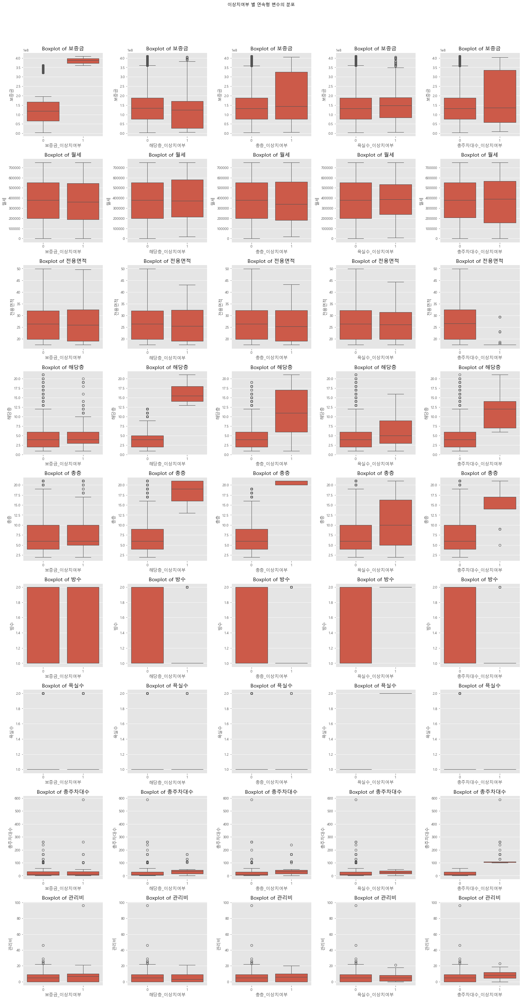

In [67]:
# 이상치 여부에 따른 연속형 피처의 분포

outlier_exist_columns = ['보증금_이상치여부','해당층_이상치여부','총층_이상치여부','욕실수_이상치여부','총주차대수_이상치여부']

numerical_columns = ['보증금', '월세', '전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수', '관리비']

fig, axes = plt.subplots(len(numerical_columns), len(outlier_exist_columns), figsize=(20, 40))
fig.suptitle('이상치여부 별 연속형 변수의 분포')

for i, outlier_col in enumerate(outlier_exist_columns):
    for j, col in enumerate(numerical_columns):
        sns.boxplot(data=train_outlier_add_flags, x=outlier_col, y=col, ax=axes[j,i])
        axes[j,i].set_title(f'Boxplot of {col}')
        axes[j,i].set_xlabel(outlier_col)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [68]:
# Mann-Whitney U검정 - 카테고리수 2개, 연속형 변수의 정규성 없음

# 해당층 이상치여부에 대한 연속형 변수 탐색
outlier_this_floor_columns = ['보증금','총층','총주차대수']

for col in outlier_this_floor_columns:
    train_outlier_MW = train_outlier_add_flags.copy()
    train_outlier_MW = train_outlier_MW.dropna(subset=[col])
    
    group1 = train_outlier_MW[train_outlier_MW['해당층_이상치여부'] == 0][col]
    group2 = train_outlier_MW[train_outlier_MW['해당층_이상치여부'] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"해당층 이상치여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")
    
# 방수는 카이제곱으로 확인

contingency_table = pd.crosstab(train_outlier_add_flags["해당층_이상치여부"], train_outlier_add_flags["방수"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

해당층 이상치여부와 보증금의 Mann-Whitney U 검정 결과: U-statistic=129694.5000, p-value=0.2822
해당층 이상치여부와 총층의 Mann-Whitney U 검정 결과: U-statistic=11092.0000, p-value=0.0000
해당층 이상치여부와 총주차대수의 Mann-Whitney U 검정 결과: U-statistic=46492.5000, p-value=0.0000
카이제곱 검정 결과: Chi2-statistic=16.7808, p-value=0.0000


해당층 이상치여부는 총층, 총주차대수, 방수 피처와 연관이 있는것으로 판단된다.

In [69]:
# 총층 이상치여부에 대한 연속형 변수 탐색
outlier_total_floor_columns = ['보증금','해당층','총주차대수']

for col in outlier_total_floor_columns:
    train_outlier_MW = train_outlier_add_flags.copy()
    train_outlier_MW = train_outlier_MW.dropna(subset=[col])
    
    group1 = train_outlier_MW[train_outlier_MW['총층_이상치여부'] == 0][col]
    group2 = train_outlier_MW[train_outlier_MW['총층_이상치여부'] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"총층 이상치여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")
    
# 방수는 카이제곱으로 확인

contingency_table = pd.crosstab(train_outlier_add_flags["총층_이상치여부"], train_outlier_add_flags["방수"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

총층 이상치여부와 보증금의 Mann-Whitney U 검정 결과: U-statistic=106108.0000, p-value=0.3873
총층 이상치여부와 해당층의 Mann-Whitney U 검정 결과: U-statistic=35062.5000, p-value=0.0000
총층 이상치여부와 총주차대수의 Mann-Whitney U 검정 결과: U-statistic=43769.5000, p-value=0.0000
카이제곱 검정 결과: Chi2-statistic=25.5455, p-value=0.0000


총층 이상치여부는 해당층, 총주차대수, 방수 피처와 연관이 있는것으로 판단된다.

In [70]:
# 욕실수 이상치여부에 대한 연속형 변수 탐색
outlier_toilet_columns = ['총층','해당층','총주차대수']

for col in outlier_toilet_columns:
    train_outlier_MW = train_outlier_add_flags.copy()
    train_outlier_MW = train_outlier_MW.dropna(subset=[col])
    
    group1 = train_outlier_MW[train_outlier_MW['욕실수_이상치여부'] == 0][col]
    group2 = train_outlier_MW[train_outlier_MW['욕실수_이상치여부'] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"욕실수 이상치여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")
    
# 방수는 카이제곱으로 확인

contingency_table = pd.crosstab(train_outlier_add_flags["욕실수_이상치여부"], train_outlier_add_flags["방수"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

욕실수 이상치여부와 총층의 Mann-Whitney U 검정 결과: U-statistic=75975.5000, p-value=0.0003
욕실수 이상치여부와 해당층의 Mann-Whitney U 검정 결과: U-statistic=76375.0000, p-value=0.0182
욕실수 이상치여부와 총주차대수의 Mann-Whitney U 검정 결과: U-statistic=44423.5000, p-value=0.0000
카이제곱 검정 결과: Chi2-statistic=140.3844, p-value=0.0000


욕실수 이상치 여부는 총층, 해당층, 총주차대수, 방수 피처와 연관이 있는것을 판단된다.

In [71]:
# 총주차대수 이상치여부에 대한 연속형 변수 탐색
outlier_parking_columns = ['보증금','전용면적','해당층','총층','관리비']

for col in outlier_parking_columns:
    train_outlier_MW = train_outlier_add_flags.copy()
    train_outlier_MW = train_outlier_MW.dropna(subset=[col])
    
    group1 = train_outlier_MW[train_outlier_MW['총주차대수_이상치여부'] == 0][col]
    group2 = train_outlier_MW[train_outlier_MW['총주차대수_이상치여부'] == 1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"총주차대수 이상치여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")
    
# 방수는 카이제곱으로 확인

contingency_table = pd.crosstab(train_outlier_add_flags["총주차대수_이상치여부"], train_outlier_add_flags["방수"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

총주차대수 이상치여부와 보증금의 Mann-Whitney U 검정 결과: U-statistic=67808.0000, p-value=0.4657
총주차대수 이상치여부와 전용면적의 Mann-Whitney U 검정 결과: U-statistic=84613.0000, p-value=0.0000
총주차대수 이상치여부와 해당층의 Mann-Whitney U 검정 결과: U-statistic=7489.0000, p-value=0.0000
총주차대수 이상치여부와 총층의 Mann-Whitney U 검정 결과: U-statistic=17214.0000, p-value=0.0000
총주차대수 이상치여부와 관리비의 Mann-Whitney U 검정 결과: U-statistic=49471.5000, p-value=0.0000
카이제곱 검정 결과: Chi2-statistic=24.0312, p-value=0.0000


총주차대수 이상치 여부는 전용면적, 해당층, 총층, 관리비, 방수 피처와 연관이 있는것으로 판단된다.

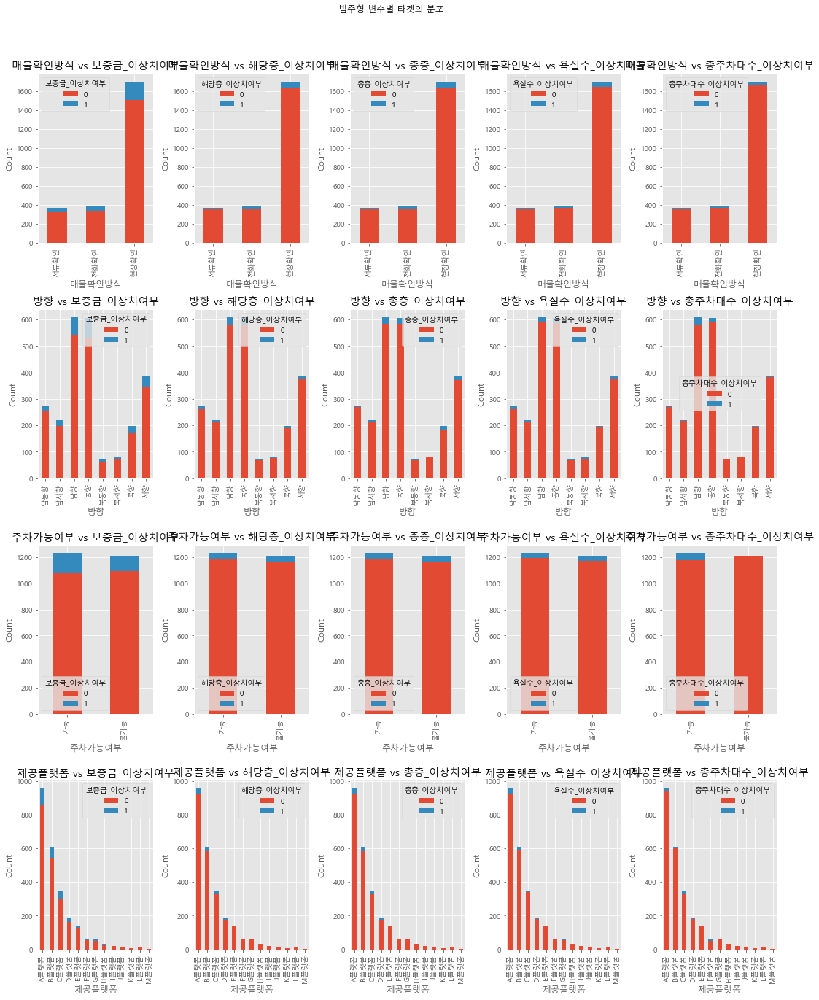

In [72]:
# 이상치 여부에 따른 범주형 피처의 분포

outlier_exist_columns = ['보증금_이상치여부','해당층_이상치여부','총층_이상치여부','욕실수_이상치여부','총주차대수_이상치여부']
categorical_columns = ["매물확인방식", "방향", "주차가능여부", "제공플랫폼"]

# 서브플롯 생성 (4*5)
fig, axes = plt.subplots(4,5, figsize=(15, 20))
fig.suptitle('범주형 변수별 타겟의 분포')

# 그래프 그리기
for i, cat in enumerate(categorical_columns):  # i: 행 (범주형 변수)
    for j, col in enumerate(outlier_exist_columns):  # j: 열 (결측 여부 변수)
        target_counts = train_outlier_add_flags.groupby([cat, col]).size().unstack()
        target_counts.plot(kind='bar', stacked=True, ax=axes[i, j])  # 올바른 서브플롯 위치

        axes[i, j].set_title(f'{cat} vs {col}')
        axes[i, j].set_xlabel(cat)
        axes[i, j].set_ylabel("Count")

# 그래프 레이아웃 조정 및 출력
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [73]:
outlier_exist_columns = ['보증금_이상치여부','해당층_이상치여부','총층_이상치여부','욕실수_이상치여부','총주차대수_이상치여부']
categorical_columns = ["매물확인방식", "방향", "주차가능여부", "제공플랫폼"]

for out_col in outlier_exist_columns:
    for cat_col in categorical_columns:
        
        contingency_table = pd.crosstab(train_outlier_add_flags[out_col], train_outlier_add_flags[cat_col])

        chi2, p_value, dof, expected = chi2_contingency(contingency_table)
        print(f"{out_col}와 {cat_col}의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")
        
    print("-"*50)

보증금_이상치여부와 매물확인방식의 카이제곱 검정 결과: Chi2-statistic=1.1788, p-value=0.5547
보증금_이상치여부와 방향의 카이제곱 검정 결과: Chi2-statistic=11.8498, p-value=0.1056
보증금_이상치여부와 주차가능여부의 카이제곱 검정 결과: Chi2-statistic=3.5192, p-value=0.0607
보증금_이상치여부와 제공플랫폼의 카이제곱 검정 결과: Chi2-statistic=12.1850, p-value=0.4309
--------------------------------------------------
해당층_이상치여부와 매물확인방식의 카이제곱 검정 결과: Chi2-statistic=0.5976, p-value=0.7417
해당층_이상치여부와 방향의 카이제곱 검정 결과: Chi2-statistic=1.7450, p-value=0.9726
해당층_이상치여부와 주차가능여부의 카이제곱 검정 결과: Chi2-statistic=0.0375, p-value=0.8464
해당층_이상치여부와 제공플랫폼의 카이제곱 검정 결과: Chi2-statistic=3.1503, p-value=0.9944
--------------------------------------------------
총층_이상치여부와 매물확인방식의 카이제곱 검정 결과: Chi2-statistic=2.6933, p-value=0.2601
총층_이상치여부와 방향의 카이제곱 검정 결과: Chi2-statistic=10.1469, p-value=0.1804
총층_이상치여부와 주차가능여부의 카이제곱 검정 결과: Chi2-statistic=0.0080, p-value=0.9289
총층_이상치여부와 제공플랫폼의 카이제곱 검정 결과: Chi2-statistic=7.1923, p-value=0.8446
--------------------------------------------------
욕실수_이상치여부와 매물확인방식의 카이제곱 검정 결과: Chi2

총주차대수 이상치 여부의 경우 방향, 주차가능여부, 제공플랫폼 피처와의 연관성을 확인할 수 있었다.  
따라서 총주차대수 이상치 여부를 새로운 피처로 추가하는 것을 고려해봐야 할 것 같다.

나머지 이상치여부 피처의 경우 다른 범주형 피처와 큰 관계가 없는 것으로 확인되었다.

## 6) 상관관계 분석

#### (1) VIF 계산

In [74]:
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(train):
    vif_data = pd.DataFrame()
    vif_data["variable"] = train.columns
    vif_data["VIF"] = [variance_inflation_factor(train.values, i) for i in range(train.shape[1])]
    return vif_data

eda_train = train.copy()
numeric_train = eda_train.select_dtypes(include=['int','float']).dropna()
vif = calculate_vif(numeric_train)
vif

,variable,VIF
0,보증금,2.667627
1,월세,3.896108
2,전용면적,10.785326
3,해당층,5.187629
4,총층,8.142754
5,방수,13.055638
6,욕실수,18.041172
7,총주차대수,2.385557
8,관리비,2.336389
9,허위매물여부,1.119742


보증금, 월세, 총주차대수, 관리비, 허위매물 여부 피처는 다중공선성 문제가 약하거나 문제가 없어 보인다.

해당층과 총층의 경우 다중공선성이 존재할 가능성이 있기 때문에 확인해봐야 할 것 같다.

전용면적, 욕실수, 방수의 경우 심한 다중공선성 문제가 있기때문에 모델의 재구성이 필요하다고 판단된다.

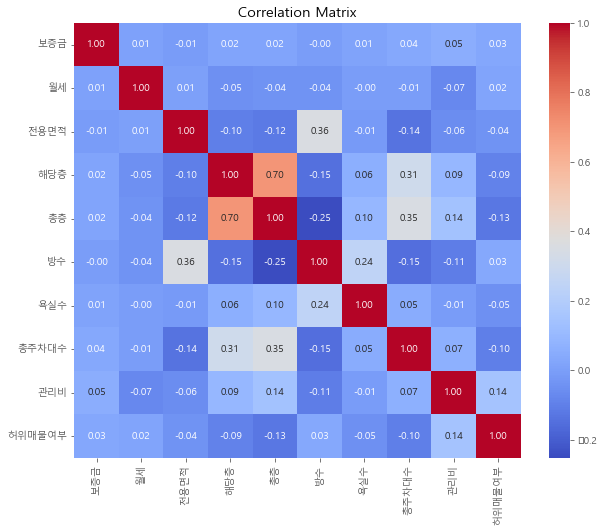

In [75]:
numeric_columns = eda_train.select_dtypes(include=['int64','float64']).columns

corr_matrix = eda_train[numeric_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")
plt.title('Correlation Matrix')
plt.show()

해당층과 총 층 사이의 상관관계가 매우 높은 값을 갖고 있다. 높은 공선성을 띄기 때문에 이를 처리해야 한다.  
관리비가 높을수록 허위매물일 가능성이 높으며, 총층은 낮을수록 허위매물일 가능성이 높게 확인되었다.  
위에서 예상했던 대로, 총층 피처와 해당층 피처는 높은 상관관계를 갖으며, 방수와 전용면적, 욕실수와도 높은 상관관계를 갖는것으로 보인다.  
반면에 욕실수와 전용면적은 크게 연관이 없는것으로 보인다.  
예상하지 못했던 피처중에 총 주차대수 피처가 해당층 피처와 총층 피처와 큰 상관계수를 갖는 것으로 보인다.  
이는 총층 피처를 통해 건축물 유형을 구분지었을 때, 큰 건축물 유형일 수록 주차대수가 많아야 하기 때문에 연관이 있어 보인다.  

또한 앞서 분석한 바에 따르면,  
주차가능여부 피처는 월세, 해당층, 총층, 관리비 피쳐와 큰 연관이 있는것으로 확인되었으며  
중개사무소 피처는 보증금, 전용면적, 해당층, 총층, 방수, 총주차대수, 관리비와  
제공 플랫폼은 전용면적, 해당층, 총층, 총주차대수와 큰 연관이 있었다.

상관계수와 VIF값이 높은 피처(욕실수, 방수, 전용면적, 해당층, 총층, 총주차대수)는 제거하거나 파생 피처의 생성을 고려해야 한다.  

피처의 제거나 새로운 파생변수를 통해 공선성을 제거하지 못한다면, 추후 사용하는 모델은 다중공선성에 둔감한 트리 기반 모델을 사용해야 한다.  
후에 진행될 피처 중요도 확인을 통해 상세하게 확인해보자.

## 7) 타겟 변수 탐색

In [76]:
train_target_check = train.copy()

#### (1) 범주형 변수와의 관계

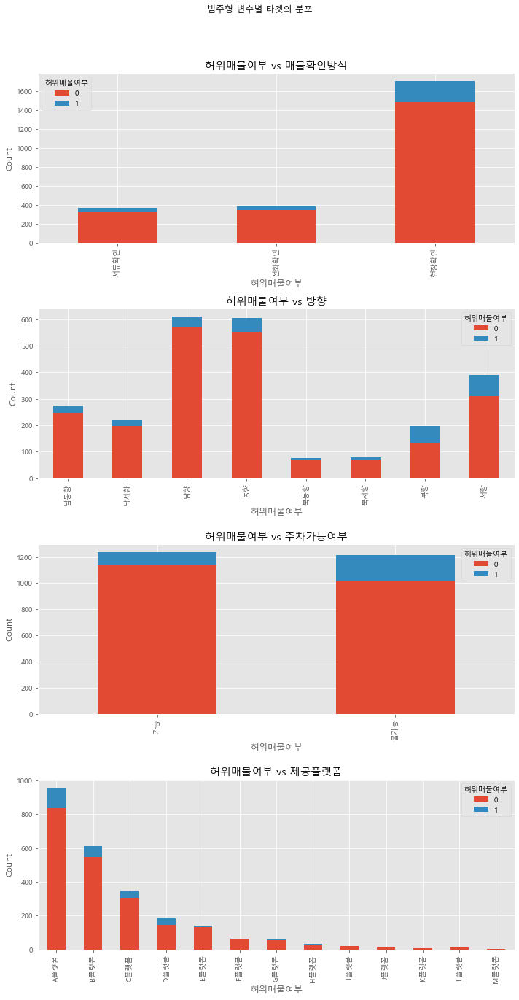

In [77]:
# 허위매물여부와 범주형 변수

categorical_columns = ["매물확인방식", "방향", "주차가능여부", "제공플랫폼"]

# 서브플롯 생성 (4x3)
fig, axes = plt.subplots(4, 1, figsize=(10, 20))
fig.suptitle('범주형 변수별 타겟의 분포')

for i, col in enumerate(categorical_columns):
    target_counts = train_target_check.groupby([col,'허위매물여부']).size().unstack()
    target_counts.plot(kind='bar', stacked=True, ax=axes[i])  # 올바른 서브플롯 위치

    axes[i].set_title(f'허위매물여부 vs {col}')
    axes[i].set_xlabel('허위매물여부')
    axes[i].set_ylabel("Count")

# 그래프 레이아웃 조정 및 출력
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [78]:
for col in categorical_columns:

    contingency_table = pd.crosstab(train_target_check["허위매물여부"], train_target_check[col])

    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"허위매물여부와 {col}의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

허위매물여부와 매물확인방식의 카이제곱 검정 결과: Chi2-statistic=5.2510, p-value=0.0724
허위매물여부와 방향의 카이제곱 검정 결과: Chi2-statistic=125.7040, p-value=0.0000
허위매물여부와 주차가능여부의 카이제곱 검정 결과: Chi2-statistic=37.9538, p-value=0.0000
허위매물여부와 제공플랫폼의 카이제곱 검정 결과: Chi2-statistic=19.9206, p-value=0.0686


허위매물여부는 매물확인방식, 제공플랫폼과 독립적이라는 결과가 나왔다. 매물확인방식의 경우 카테고리수가 3개이지만, 제공플랫폼의 경우는 카테고리수가 많으므로 재범주화를 통해서 다시 확인해 볼 수 있을 것 같다.

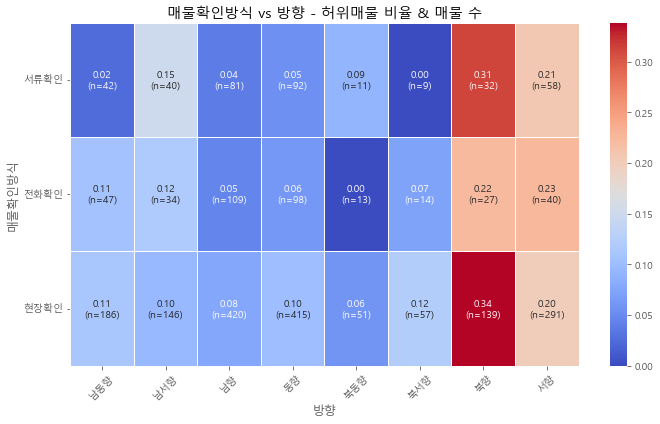

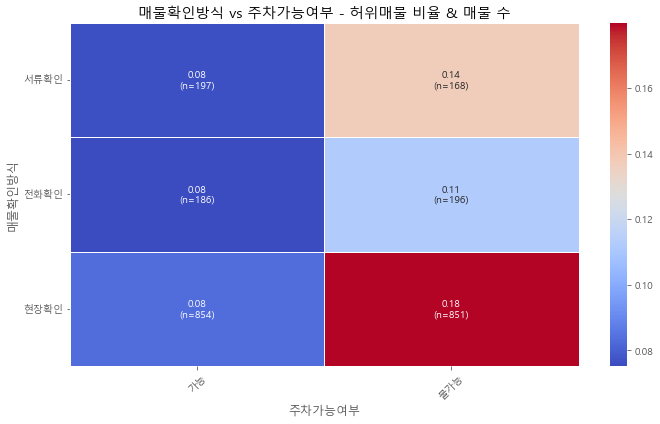

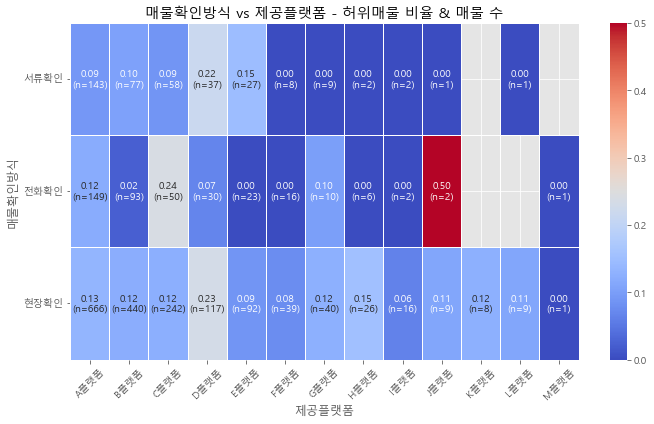

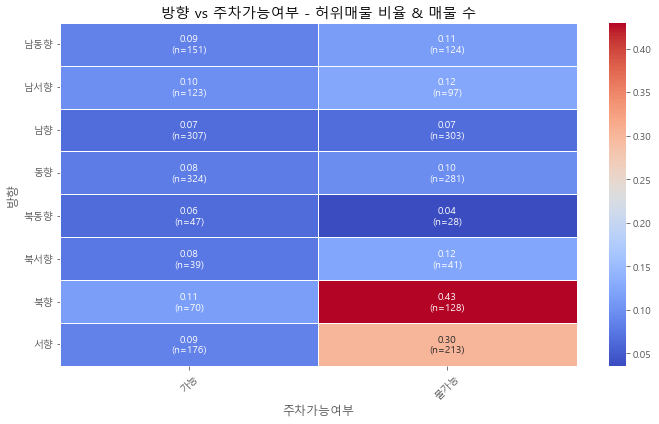

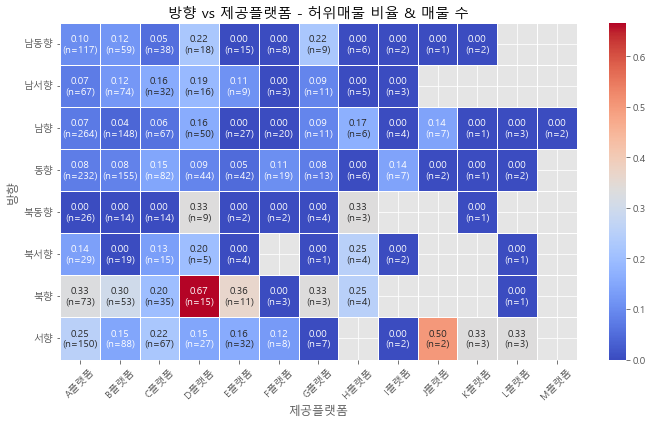

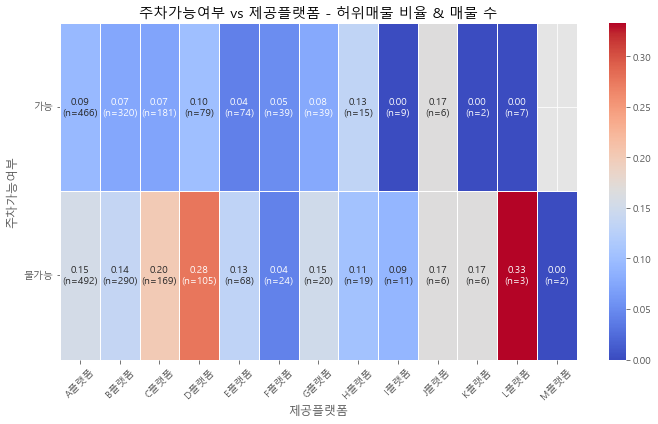

In [79]:
# 조합별 히트맵 확인

from itertools import combinations

columns = ["매물확인방식", "방향", "주차가능여부", "제공플랫폼"]
feature_combinations = list(combinations(columns, 2))

for idx_col, col_col in feature_combinations:
    # 1. 허위매물 비율 (mean)
    pivot_mean = train_target_check.pivot_table(
        index=idx_col,
        columns=col_col,
        values="허위매물여부",
        aggfunc="mean"
    )

    # 2. 매물 수 (count)
    pivot_count = train_target_check.pivot_table(
        index=idx_col,
        columns=col_col,
        values="허위매물여부",
        aggfunc="count"
    )

    # 3. annot 텍스트를 "0.23\n(n=31)" 이런 식으로 결합
    annot = pivot_mean.copy()
    for i in annot.index:
        for j in annot.columns:
            val = pivot_mean.loc[i, j]
            cnt = pivot_count.loc[i, j]
            if pd.notnull(val):
                annot.loc[i, j] = f"{val:.2f}\n(n={int(cnt)})"
            else:
                annot.loc[i, j] = ""

    # 4. 시각화
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_mean, annot=annot.values, fmt="", cmap="coolwarm", linewidths=0.5)
    plt.title(f"{idx_col} vs {col_col} - 허위매물 비율 & 매물 수")
    plt.xlabel(col_col)
    plt.ylabel(idx_col)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

두 카테고리별 허위매물의 여부를 확인해보자.

매물확인방식-방향 : 매물확인 방식에 상관없이 북향과 서향일때의 허위매물 비율이 높다. 그중 북향이면서 현장확인, 서류확인의 경우가 허위매물의 비율이 유독 높은 것을 확인할 수 있다.

매물확인방식-주차가능여부 : 주차가능여부가 가능일때는 매물확인방식에 구애받지않고 균일한 허위매물의 비율을 보이지만, 불가능일때는 현장확인에서 가장 높은 허위매물비율이, 그다음 서류확인 순이다. 하지만 그 차이가 엄청 크지는 않다.

매물확인방식-제공플랫폼 : 제공플랫폼의 카테고리수가 다양하기 때문에 각 항목별로 매물의 수가 많지는 않다. 상대적으로 매물의 수가 많은 C와 D플랫폼에서 허위매물의 비율이 상대적으로 높은 것을 확인할 수 있다.
D-서류, C-전화, D-현장 일때의 허위매물 비율이 높았다.

*** 방향-주차가능여부 : 다른 항목에서는 높아야 허위매물비율이 0.1 정도이지만, 북향과 서향에서 주차가능여부가 불가능일때의 허위매물비율은 0.43, 0.3으로 매우 높다. 이 지표는 매우 중요한 것으로 보인다. 또한 북동향일때의 허위매물의 비율이 매우 낮다.

방향-플랫폼 : 각 항목별로의 매물 수가 적다. 하지만 방향이 북향일때와 서향일때, 그리고 플랫폼이 C와 D일때의 허위매물의 비율이 유독 높은 것을 확인할 수있다. 방향과 플랫폼의 조합도 중요한 지표로 보인다.

주차가능여부-제공플랫폼 : 마찬가지로 제공플랫폼과 주차가능여부에서도 주차가 불가능일때, C와D에서 허위매물의 비율이 높았다.


확인결과 매물확인방식 피처의 경우는 허위매물여부와 크게 연관이 없는 독립적인 피처로 생각된다. 추후에 모델링 단계에서 제거하는 것을 고려해봐야 해보자.

###### a) 제공플랫폼

In [80]:
top5_platforms = train_target_check['제공플랫폼'].value_counts().nlargest(5).index

# 2. 상위 5개 플랫폼에 해당하는 데이터만 필터링
train_target_check_platform = train_target_check[train_target_check['제공플랫폼'].isin(top5_platforms)].copy()

contingency_table = pd.crosstab(train_target_check_platform["허위매물여부"], train_target_check_platform['제공플랫폼'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"허위매물여부와 제공플랫폼의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

허위매물여부와 제공플랫폼의 카이제곱 검정 결과: Chi2-statistic=14.4146, p-value=0.0061


매물의 수가 가장 많은 상위 5개의 제공플랫폼에 대해서 확인한 결과, 허위매물여부와 독립적이지 않다는 결과가 나왔다.  
해당 피처를 적절히 재범주화 하는 것이 매우 중요해 보인다.

###### b) 방향

In [81]:
# 방향을 북향과 북향이 아닌 방향으로 재범주화

train_target_check_north = train.copy()

train_target_check_north['북향여부'] = train_target_check_north['방향'].apply(lambda x: 1 if '북향' in str(x) else 0)

<Figure size 864x432 with 0 Axes>

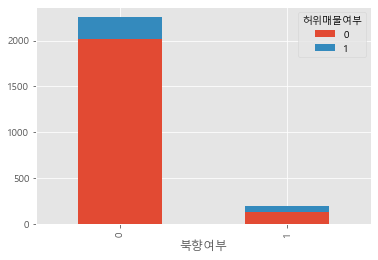

In [82]:
plt.figure(figsize=(12,6))

target_counts = train_target_check_north.groupby(['북향여부','허위매물여부']).size().unstack()
target_counts.plot(kind='bar', stacked=True) 

plt.show()

In [83]:
contingency_table = pd.crosstab(train_target_check_north["허위매물여부"], train_target_check_north['북향여부'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"허위매물여부와 방향의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

허위매물여부와 방향의 카이제곱 검정 결과: Chi2-statistic=76.0265, p-value=0.0000


보증금 피처와의 관계를 확인했을때와 마찬가지의 방법으로 북향/북향아님 을 기준으로 재범주화한 후 확인한 결과, Chi2-statistic의 값은125.7040에서 76으로 떨어졌지만, p값은 여전히 유의미하다는 것을 확인할 수 있다.  
하지만 정보의 손실이 발생할 염려가 있으며, 데이터의 불균형이 너무 심한것을 확인할 수 있다.

따라서 방향 카테고리를 북향과 북향아님으로 재범주화 하는 것은 좋지 않은 방식으로 판단된다.

In [84]:
# 방향을 각도로 변경. (사인변환을 통해 수치형 데이터로)

train_target_check_sincos = train.copy()

# 1. 방향 → 각도 매핑 딕셔너리
direction_to_degree = {
    '북향': 0,
    '북동향': 45,
    '동향': 90,
    '남동향': 135,
    '남향': 180,
    '남서향': 225,
    '서향': 270,
    '북서향': 315
}

train_target_check_sincos['방향_각도'] = train_target_check_sincos['방향'].map(direction_to_degree)

# 라디안 변환 (각도 → 라디안)
train_target_check_sincos['방향_라디안'] = np.deg2rad(train_target_check_sincos['방향_각도'])

# 사인/코사인 인코딩
train_target_check_sincos['방향_sin'] = np.sin(train_target_check_sincos['방향_라디안'])
train_target_check_sincos['방향_cos'] = np.cos(train_target_check_sincos['방향_라디안'])

In [85]:
contingency_table = pd.crosstab(train_target_check_sincos["허위매물여부"], train_target_check_sincos['방향_sin'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"허위매물여부와 사인값의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

contingency_table = pd.crosstab(train_target_check_sincos["허위매물여부"], train_target_check_sincos['방향_cos'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"허위매물여부와 코사인값의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

허위매물여부와 사인값의 카이제곱 검정 결과: Chi2-statistic=124.5938, p-value=0.0000
허위매물여부와 코사인값의 카이제곱 검정 결과: Chi2-statistic=125.7040, p-value=0.0000


사인코사인 변환를 한 후 허위매물여부 피처와의 독립성을 확인했을때, 변환후의 결과도 유의미하기 때문에  
추후에 모델링 단계에서 성능을 기준으로 어떤 피처를 사용할지 선택하면 될 것 같다.

#### (2) 연속형 변수와의 관계

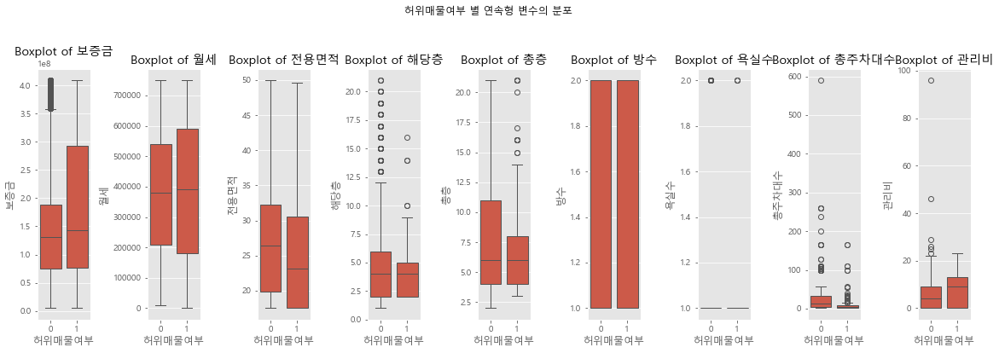

In [86]:
# 허위매물 여부 별 연속형 변수의 분포

numerical_columns = train_target_check.select_dtypes(include=['int64','float64']).columns
numerical_columns = numerical_columns.drop('허위매물여부')

fig, axes = plt.subplots(1, len(numerical_columns), figsize=(16, 6))
fig.suptitle('허위매물여부 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=train_target_check, x='허위매물여부', y=col, ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('허위매물여부')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

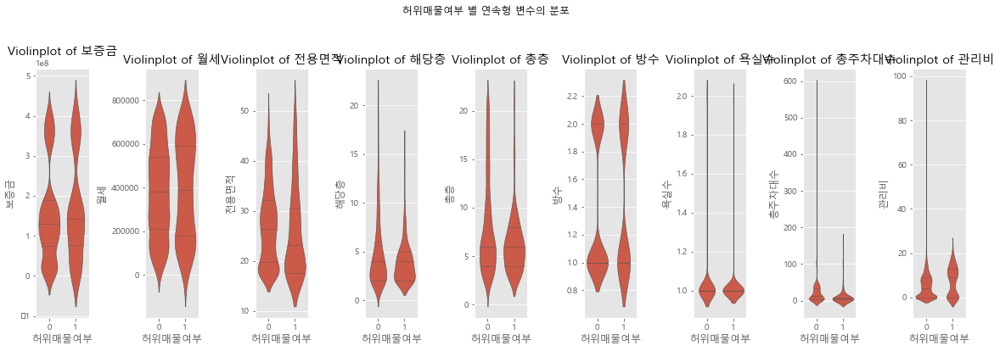

In [87]:
fig, axes = plt.subplots(1, len(numerical_columns), figsize=(16, 6))
fig.suptitle('허위매물여부 별 연속형 변수의 분포')

for i, col in enumerate(numerical_columns):
    
    sns.violinplot(x='허위매물여부', y=col, data=train_target_check, inner='quartile', ax=axes[i])
    axes[i].set_title(f'Violinplot of {col}')
    axes[i].set_xlabel('허위매물여부')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

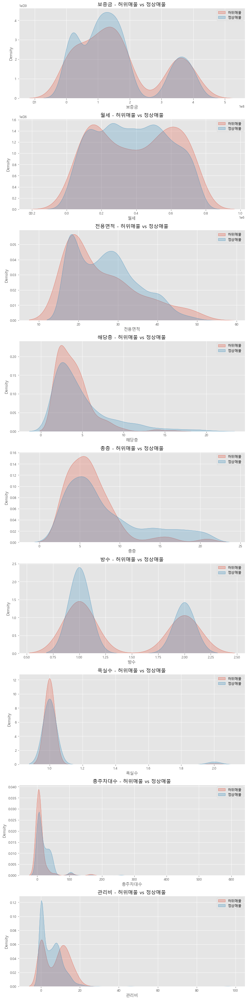

In [88]:
fig, axs = plt.subplots(len(numerical_columns), 1, figsize=(10, 40))

for i, col in enumerate(numerical_columns):
    sns.kdeplot(train_target_check[train_target_check['허위매물여부'] == 1][col], label="허위매물", ax=axs[i], fill=True)
    sns.kdeplot(train_target_check[train_target_check['허위매물여부'] == 0][col], label="정상매물", ax=axs[i], fill=True)
    
    axs[i].set_title(f"{col} - 허위매물 vs 정상매물")
    axs[i].legend()

plt.tight_layout()
plt.show()

In [89]:
# Mann-Whitney U검정

for col in numerical_columns:
    
    train_MW_target = train_target_check.copy()
    train_MW_target = train_MW_target.dropna(subset=[col])
    
    group1 = train_MW_target[train_MW_target['허위매물여부']==0][col]
    group2 = train_MW_target[train_MW_target['허위매물여부']==1][col]
    
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
    print(f"허위매물여부와 {col}의 Mann-Whitney U 검정 결과: U-statistic={u_stat:.4f}, p-value={p_value:.4f}")

허위매물여부와 보증금의 Mann-Whitney U 검정 결과: U-statistic=309766.0000, p-value=0.3291
허위매물여부와 월세의 Mann-Whitney U 검정 결과: U-statistic=309182.0000, p-value=0.3044
허위매물여부와 전용면적의 Mann-Whitney U 검정 결과: U-statistic=133643.0000, p-value=0.0155
허위매물여부와 해당층의 Mann-Whitney U 검정 결과: U-statistic=267583.0000, p-value=0.0069
허위매물여부와 총층의 Mann-Whitney U 검정 결과: U-statistic=371610.0000, p-value=0.0000
허위매물여부와 방수의 Mann-Whitney U 검정 결과: U-statistic=299229.0000, p-value=0.0995
허위매물여부와 욕실수의 Mann-Whitney U 검정 결과: U-statistic=323277.0000, p-value=0.0149
허위매물여부와 총주차대수의 Mann-Whitney U 검정 결과: U-statistic=188368.0000, p-value=0.0000
허위매물여부와 관리비의 Mann-Whitney U 검정 결과: U-statistic=249408.5000, p-value=0.0000


방수의 경우 1과 2로 이루어진 카테고리형과 다름이 없으므로 카이제곱 검정을 통해 다시 확인해보면

In [90]:
contingency_table = pd.crosstab(train_target_check["허위매물여부"], train_target_check["방수"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

카이제곱 검정 결과: Chi2-statistic=2.5070, p-value=0.1133


Mann-Whitney U검정에서는 보증금, 월세, 방수가 허위매물여부에 따라서 큰 차이가 없다는 결과가 나왔다. 방수의 경우 카이제곱 검정으로 다시 확인해본 결과, 같은 결과가 나왔다.  
하지만 보증금과 월세의 경우, 플랏의 형태가 허위매물 여부에 따라서 상이한 형태를 띄고 있기 때문에, 허위매물여부 결정에 관여하는 피처로 생각된다.  
또한 다른 수치형 피처들의 경우 플랏의 형태과 검정 결과 모두 유의미하다고 판단된다.

*** 방수의 경우 단독적으로는 허위매물여부와 독립적이라고 판단된다.  
하지만 앞서 분석한 결과에 따르자면, 방수가 다른 피처의 이상치 여부, 중개사무소 피처와 연관이 있기때문에 단순히 삭제 하는것이 아닌 파생 변수의 생성을 우선적으로 고려해보자.

#### (3) 시간적 패턴

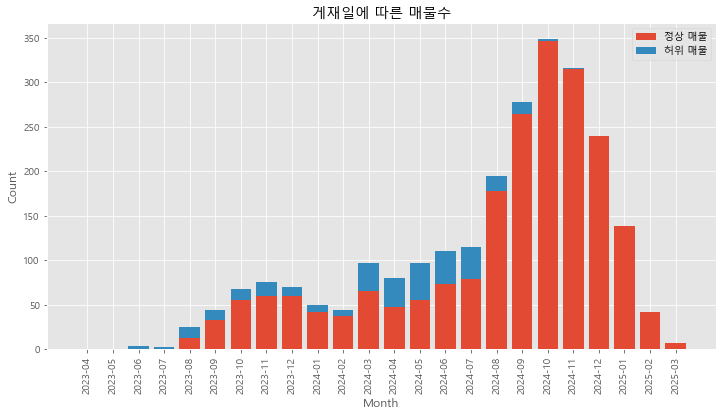

In [91]:
train_eda_time = train.copy()

train_eda_time['게재일'] = pd.to_datetime(train_eda_time['게재일'], format='%Y-%m-%d')

train_eda_time = train_eda_time.set_index("게재일")

monthly_counts = train_eda_time.resample('M').size()
monthly_fake_counts = train_eda_time.resample('M')["허위매물여부"].sum()

plt.figure(figsize=(12, 6))

plt.bar(range(len(monthly_counts)), monthly_counts - monthly_fake_counts, label="정상 매물")
plt.bar(range(len(monthly_counts)), monthly_fake_counts, label="허위 매물", bottom=monthly_counts - monthly_fake_counts)

plt.xlabel("Month")
plt.ylabel("Count")
plt.title("게재일에 따른 매물수")
plt.xticks(ticks=range(len(monthly_counts)), labels=monthly_counts.index.strftime('%Y-%m'), rotation=90)
plt.legend()

plt.show()

허위매물의 비율이 급격히 높아졌다가 줄어드는 구간이 있다. 해당 구간에서의 허위매물 비율이 매우 중요하게 작용할 것 같다.

2023년 7월까지는 매물의 수는 거의 없지만 대부분의 매물이 허위매물이며, 2024년까지 매물의 수는 조금 늘었지만, 허위매물의 비율이 줄었다.  2024년 3월부터 2024년 7월까지 허위매물의 비율이 매우 높았으며, 2024년 8월부터 10월까지 매물의 수가 급증하고 허위매물 수가 줄었고, 2024년 10월부터는 허위매물이 거의 존재하지 않는다.

In [92]:
train_eda_time = train.copy()
train_eda_time['게재일'] = pd.to_datetime(train_eda_time['게재일'], format='%Y-%m-%d')

# 년/월 정보 추출
train_eda_time['년월'] = train_eda_time['게재일'].dt.to_period('M').astype(str)

# 그룹화하여 총 매물 수와 허위 매물 수 계산
monthly_stats = train_eda_time.groupby('년월').agg(
    매물수=('허위매물여부', 'count'),
    허위매물수=('허위매물여부', 'sum')
)

# 허위 매물 비율 계산
monthly_stats['허위매물비율'] = (monthly_stats['허위매물수'] / monthly_stats['매물수']) * 100

monthly_stats = monthly_stats.reset_index()
monthly_stats.sort_values('년월', inplace=True)

monthly_stats

,년월,매물수,허위매물수,허위매물비율
0,2023-04,1,1,100.000000
1,2023-05,1,1,100.000000
2,2023-06,4,4,100.000000
3,2023-07,3,3,100.000000
4,2023-08,25,12,48.000000
5,2023-09,44,11,25.000000
6,2023-10,68,12,17.647059
7,2023-11,76,16,21.052632
8,2023-12,70,10,14.285714
9,2024-01,50,8,16.000000


In [93]:
contingency_table = pd.crosstab(train_eda_time["년월"], train_eda_time["허위매물여부"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

카이제곱 검정 결과: Chi2-statistic=542.2436, p-value=0.0000


구간별로의 허위매물 비율 특징을 살려서 재범주화 하면

In [94]:
train_eda_time_recat = train_eda_time.copy()

# 년월 범주화 함수
def categorize_period(date):
    if date <= pd.Timestamp("2023-07-31"):
        return "구간1_초기"
    elif date <= pd.Timestamp("2024-02-29"):
        return "구간2_증가초기"
    elif date <= pd.Timestamp("2024-07-31"):
        return "구간3_허위급증"
    elif date <= pd.Timestamp("2024-10-31"):
        return "구간4_실매물급증"
    else:
        return "구간5_정상화"

# 새 피처 생성
train_eda_time_recat['게재일_구간'] = train_eda_time_recat['게재일'].apply(categorize_period)

In [95]:
contingency_table = pd.crosstab(train_eda_time_recat["게재일_구간"], train_eda_time_recat["허위매물여부"])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

카이제곱 검정 결과: Chi2-statistic=501.2234, p-value=0.0000


카이제곱 통계량은 약간 줄었지만, p값은 여전히 유효한 값을 띄고 있다.

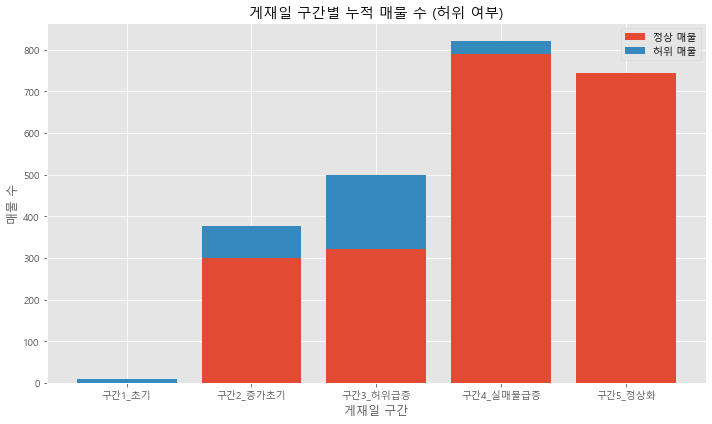

In [96]:
# 시간순 카테고리 순서 지정
category_order = ["구간1_초기", "구간2_증가초기", "구간3_허위급증", "구간4_실매물급증", "구간5_정상화"]
train_eda_time_recat['게재일_구간'] = pd.Categorical(
    train_eda_time_recat['게재일_구간'],
    categories=category_order,
    ordered=True
)

# 구간별 정상/허위 매물 수 집계
grouped = train_eda_time_recat.groupby(['게재일_구간', '허위매물여부']).size().unstack(fill_value=0)

# 시각화
plt.figure(figsize=(10, 6))
plt.bar(grouped.index, grouped[0], label='정상 매물')
plt.bar(grouped.index, grouped[1], bottom=grouped[0], label='허위 매물')

plt.title("게재일 구간별 누적 매물 수 (허위 여부)")
plt.xlabel("게재일 구간")
plt.ylabel("매물 수")
plt.legend()
plt.tight_layout()
plt.show()

In [97]:
# 구간별 정상/허위 매물 수 집계
grouped = train_eda_time_recat.groupby(['게재일_구간', '허위매물여부']).size().unstack(fill_value=0)

# 컬럼 이름 직관적으로 바꾸기
grouped.columns = ['정상매물수', '허위매물수']

# 전체 매물 수
grouped['전체매물수'] = grouped['정상매물수'] + grouped['허위매물수']

# 허위매물 비율 (%)
grouped['허위매물비율(%)'] = (grouped['허위매물수'] / grouped['전체매물수']) * 100

# 보기 좋게 정렬
grouped = grouped[[
    '전체매물수', '정상매물수', '허위매물수', '허위매물비율(%)'
]].reset_index()

import IPython.display as disp
disp.display(grouped)

,게재일_구간,전체매물수,정상매물수,허위매물수,허위매물비율(%)
0,구간1_초기,9,0,9,100.000000
1,구간2_증가초기,377,301,76,20.159151
2,구간3_허위급증,500,321,179,35.800000
3,구간4_실매물급증,822,789,33,4.014599
4,구간5_정상화,744,743,1,0.134409


각 구간별로의 허위매물 비율이 상이함을 통해, 게재일 피처가 허위매물을 예측하는데 있어서 매우 중요한 피처라는 사실을 알아냈다.  
하지만 위의 방식과 같은 방식으로 재범주화를 진행한다면 이미 타겟의 정보가 내포되어 있으므로 과적합의 염려가 있다.

따라서 해당 구간을 잘 살릴수 있는 재범주화를 통해서 모델링 단계에서 피처 설렉션을 진행하는 것이 매우 중요해 보인다.

실제 사례와 비교

<기준금리 변동>

2024년 10월 11일: 한국은행은 기준금리를 기존 연 3.50%에서 3.25%로 0.25%포인트 인하하였습니다. 이는 3년 2개월 만의 첫 금리 인하로, 경기 둔화에 대응하기 위한 조치였습니다.

2024년 11월 28일: 한국은행은 연속적으로 기준금리를 3.25%에서 3.00%로 추가 인하하였습니다. 이는 경기 부양을 위한 연속적인 조치로 해석됩니다.

<부동산 관련 정책 변화>

2024년 8월: 정부는 '8·8 부동산 대책'을 발표하여 서울 그린벨트 해제를 포함한 8만 가구의 신규 택지 조성을 예고하였습니다. 이는 주택 공급 확대를 위한 조치로, 부동산 시장에 큰 영향을 미쳤습니다.

2024년 하반기: 정부는 정비사업 규제 완화를 통해 주택 공급을 늘리려는 노력을 지속하였습니다. 이는 재건축 규제 완화와 그린벨트 해제를 포함한 정책들로, 부동산 시장의 공급 측면에 변화를 주었습니다.

2024년 7월: '스트레스 DSR(총부채원리금상환비율) 2단계'가 시행되어 대출 규제가 강화되었습니다. 이는 가계 부채 관리를 위한 조치로, 부동산 시장의 수요 측면에 영향을 미쳤습니다.

실제 사례를 통해 충분히 설명가능한 부분이 많기 때문에 현실기반 데이터일 가능성이 존재한다고 판단된다.  
후에 실제 정책사례를 통한 게재일의 재범주화도 고려해볼 사항이다.

#### (4) 파생피처와의 관계

###### a) 결측여부 피처와의 관계

In [98]:
train_eda_isnull = train.copy()

In [99]:
train_isnull_columns = ['전용면적','해당층','총주차대수']

for col in train_isnull_columns:
    
    train_eda_isnull[f'{col}_결측여부'] = train_eda_isnull[col].isnull().astype(int)

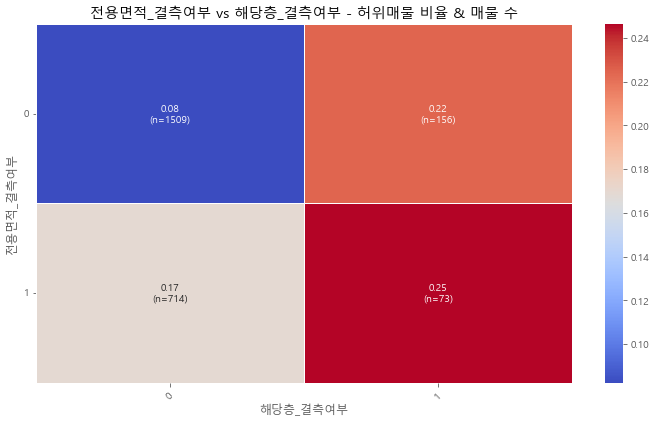

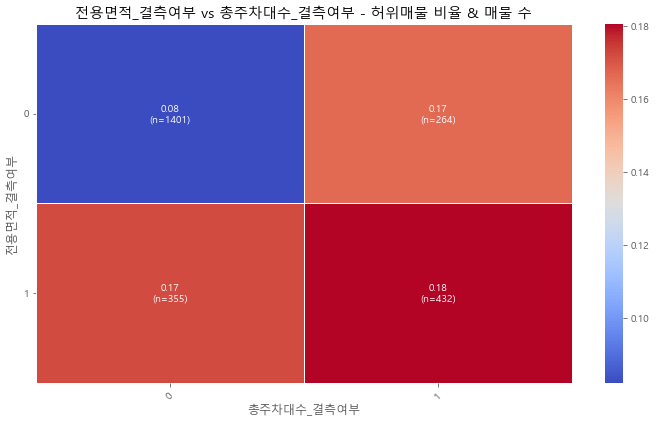

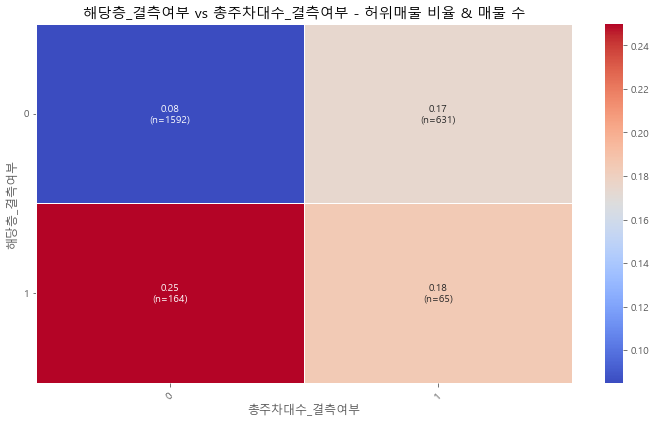

In [100]:
isnull_columns = ["전용면적_결측여부", "해당층_결측여부", "총주차대수_결측여부"]
isnull_feature_combinations = list(combinations(isnull_columns, 2))

for idx_col, col_col in isnull_feature_combinations:
    # 1. 허위매물 비율 (mean)
    pivot_mean = train_eda_isnull.pivot_table(
        index=idx_col,
        columns=col_col,
        values="허위매물여부",
        aggfunc="mean"
    )

    # 2. 매물 수 (count)
    pivot_count = train_eda_isnull.pivot_table(
        index=idx_col,
        columns=col_col,
        values="허위매물여부",
        aggfunc="count"
    )

    # 3. annot 텍스트를 "0.23\n(n=31)" 이런 식으로 결합
    annot = pivot_mean.copy()
    for i in annot.index:
        for j in annot.columns:
            val = pivot_mean.loc[i, j]
            cnt = pivot_count.loc[i, j]
            if pd.notnull(val):
                annot.loc[i, j] = f"{val:.2f}\n(n={int(cnt)})"
            else:
                annot.loc[i, j] = ""

    # 4. 시각화
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_mean, annot=annot.values, fmt="", cmap="coolwarm", linewidths=0.5)
    plt.title(f"{idx_col} vs {col_col} - 허위매물 비율 & 매물 수")
    plt.xlabel(col_col)
    plt.ylabel(idx_col)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

In [101]:
isnull_cols = ["전용면적_결측여부", "해당층_결측여부", "총주차대수_결측여부"]
combis = list(combinations(isnull_cols, 2))

for col1, col2 in combis:
    combi_col = f"{col1}_{col2}_조합"
    train_eda_isnull[combi_col] = (
        train_eda_isnull[col1].astype(str) + "_" + train_eda_isnull[col2].astype(str)
    )

    contingency = pd.crosstab(train_eda_isnull[combi_col], train_eda_isnull['허위매물여부'])
    chi2, p, dof, _ = chi2_contingency(contingency)
    
    print(f"[{col1} + {col2}] → chi2={chi2:.2f}, p={p:.4f}")

[전용면적_결측여부 + 해당층_결측여부] → chi2=63.40, p=0.0000
[전용면적_결측여부 + 총주차대수_결측여부] → chi2=47.97, p=0.0000
[해당층_결측여부 + 총주차대수_결측여부] → chi2=64.37, p=0.0000


[3피처 결측조합] Chi-square = 90.6868, p-value = 0.0000


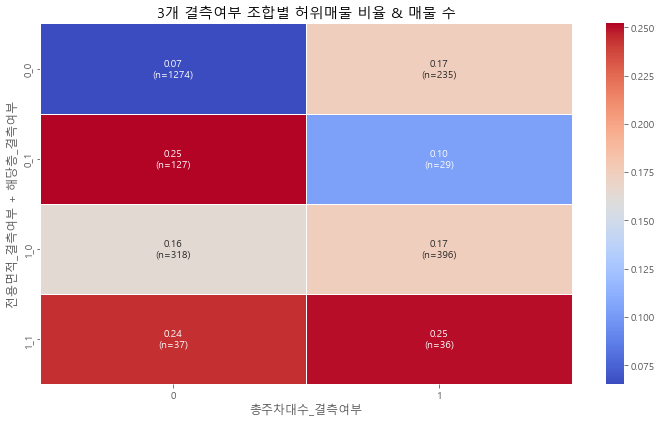

In [102]:
# 1. 결측 조합 컬럼 생성
train_eda_isnull["결측_3조합"] = (
    train_eda_isnull["전용면적_결측여부"].astype(str) + "_" +
    train_eda_isnull["해당층_결측여부"].astype(str) + "_" +
    train_eda_isnull["총주차대수_결측여부"].astype(str)
)

# 2. 카이제곱 검정
contingency = pd.crosstab(train_eda_isnull["결측_3조합"], train_eda_isnull["허위매물여부"])
chi2, p, dof, expected = chi2_contingency(contingency)

print(f"[3피처 결측조합] Chi-square = {chi2:.4f}, p-value = {p:.4f}")

# 3. 히트맵용 피벗 테이블 생성 (1차원 → 2차원으로 reshape)
# 예: row: 전용면적_결측 + 해당층_결측 / col: 총주차대수_결측
train_eda_isnull["2D_row"] = (
    train_eda_isnull["전용면적_결측여부"].astype(str) + "_" +
    train_eda_isnull["해당층_결측여부"].astype(str)
)
train_eda_isnull["2D_col"] = train_eda_isnull["총주차대수_결측여부"]

# 4. 허위매물 비율 테이블
pivot_mean = train_eda_isnull.pivot_table(
    index="2D_row",
    columns="2D_col",
    values="허위매물여부",
    aggfunc="mean"
)

# 5. 매물 수 테이블
pivot_count = train_eda_isnull.pivot_table(
    index="2D_row",
    columns="2D_col",
    values="허위매물여부",
    aggfunc="count"
)

# 6. annot 텍스트 생성
annot = pivot_mean.copy()
for i in annot.index:
    for j in annot.columns:
        val = pivot_mean.loc[i, j]
        cnt = pivot_count.loc[i, j]
        if pd.notnull(val):
            annot.loc[i, j] = f"{val:.2f}\n(n={int(cnt)})"
        else:
            annot.loc[i, j] = ""

# 7. 시각화
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_mean, annot=annot.values, fmt="", cmap="coolwarm", linewidths=0.5)
plt.title("3개 결측여부 조합별 허위매물 비율 & 매물 수")
plt.xlabel("총주차대수_결측여부")
plt.ylabel("전용면적_결측여부 + 해당층_결측여부")
plt.tight_layout()
plt.show()

###### b) 결측치 개수와의 관계

In [103]:
train_eda_null_count = train.copy()

missing_cols = ['전용면적', '해당층', '총층', '방수', '욕실수', '총주차대수']

train_eda_null_count['결측치_개수'] = train_eda_null_count[missing_cols].isnull().sum(axis=1)

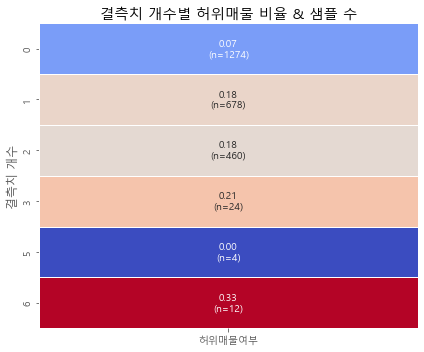

In [104]:
pivot_mean = train_eda_null_count.pivot_table(
    index="결측치_개수",
    values="허위매물여부",
    aggfunc="mean"
)

# 매물 수 계산
pivot_count = train_eda_null_count.pivot_table(
    index="결측치_개수",
    values="허위매물여부",
    aggfunc="count"
)

# annot 텍스트 결합 ("0.24\n(n=51)" 형식)
annot = pivot_mean.copy()
for i in annot.index:
    val = pivot_mean.loc[i, "허위매물여부"]
    cnt = pivot_count.loc[i, "허위매물여부"]
    annot.loc[i, "허위매물여부"] = f"{val:.2f}\n(n={int(cnt)})"

# 히트맵
plt.figure(figsize=(6, 5))
sns.heatmap(pivot_mean, annot=annot.values, fmt="", cmap="coolwarm", linewidths=0.5, cbar=False)
plt.title("결측치 개수별 허위매물 비율 & 샘플 수")
plt.xlabel("")
plt.ylabel("결측치 개수")
plt.tight_layout()
plt.show()

In [105]:
contingency = pd.crosstab(train_eda_null_count["결측치_개수"], train_eda_null_count["허위매물여부"])

chi2, p, dof, expected = chi2_contingency(contingency)
print(f"Chi-square statistic = {chi2:.4f}, p-value = {p:.4f}")

Chi-square statistic = 83.1203, p-value = 0.0000


In [106]:
# 결측치가 많은 피처만 선택해서 다시 확인
meaningful_missing_cols = ['전용면적', '해당층', '총주차대수']

# 결측치 개수 재계산
train_eda_null_count['결측치_개수_trimmed'] = train_eda_null_count[meaningful_missing_cols].isnull().sum(axis=1)

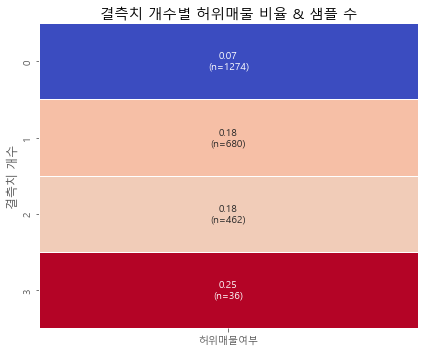

In [107]:
pivot_mean = train_eda_null_count.pivot_table(
    index="결측치_개수_trimmed",
    values="허위매물여부",
    aggfunc="mean"
)

# 매물 수 계산
pivot_count = train_eda_null_count.pivot_table(
    index="결측치_개수_trimmed",
    values="허위매물여부",
    aggfunc="count"
)

# annot 텍스트 결합 ("0.24\n(n=51)" 형식)
annot = pivot_mean.copy()
for i in annot.index:
    val = pivot_mean.loc[i, "허위매물여부"]
    cnt = pivot_count.loc[i, "허위매물여부"]
    annot.loc[i, "허위매물여부"] = f"{val:.2f}\n(n={int(cnt)})"

# 히트맵
plt.figure(figsize=(6, 5))
sns.heatmap(pivot_mean, annot=annot.values, fmt="", cmap="coolwarm", linewidths=0.5, cbar=False)
plt.title("결측치 개수별 허위매물 비율 & 샘플 수")
plt.xlabel("")
plt.ylabel("결측치 개수")
plt.tight_layout()
plt.show()

In [108]:
contingency = pd.crosstab(train_eda_null_count["결측치_개수_trimmed"], train_eda_null_count["허위매물여부"])

chi2, p, dof, expected = chi2_contingency(contingency)
print(f"Chi-square statistic = {chi2:.4f}, p-value = {p:.4f}")

Chi-square statistic = 80.7363, p-value = 0.0000


결측치가 3개일때는 매물의 수 자체가 없으며, 결측치가 1개일때와 2개일떄 허위매물의 비율이 크게 차이나지 않는다. 따라서 추후에 이 피처를 사용한다면 결측치의 갯수가 0개일때와 1개 이상일때로 구분하는 것이 좋아보이지만, 이는 타겟 기반의 피처이기 때문에 모델링 단계에서 확인해보는 것이 좋아보인다.

# 결측치 처리

In [109]:
train_origin = train.copy()

## 1) 총층, 방수, 욕실수 피처

해당 세 피처는 결측치의 수도 매우 적고, 유사한 행에서 결측치가 발생하는 패턴이 존재.  
따라서 최빈값을 통해 결측치 처리

In [110]:
for col in ['총층', '방수', '욕실수']:
    train_origin[col] = train_origin[col].fillna(train_origin[col].mode()[0])

In [111]:
train_origin[['총층', '방수', '욕실수']].isnull().sum()

총층     0
방수     0
욕실수    0
dtype: int64

## 2) 해당층

해당층 피처에는 총 229개의 결측치가 발생했으며 이는 전체 매물수의 9.34퍼센트에 해당한다.  
이는 꽤나 많은 수에 해당하기 때문에 단순 보간이 아니라 다른 피처간의 관계를 우선적으로 살펴보고자 한다.

#### (1) 결측여부 피처

In [112]:
train_origin['해당층_결측여부'] = train_origin['해당층'].isnull().astype(int)

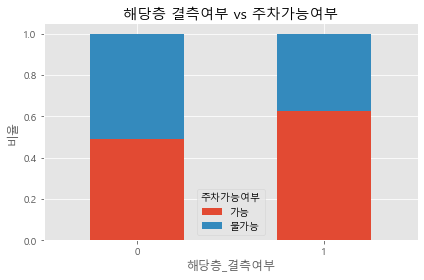

해당층 결측여부와 주차가능여부의 카이제곱 검정 결과 chi2=14.02, p=0.0002


In [113]:
# 주차가능여부와의 관계

pd.crosstab(train_origin["해당층_결측여부"], train_origin["주차가능여부"], normalize="index").plot(
    kind="bar", stacked=True, figsize=(6,4)
)
plt.title("해당층 결측여부 vs 주차가능여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_origin["해당층_결측여부"], train_origin["주차가능여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"해당층 결측여부와 주차가능여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

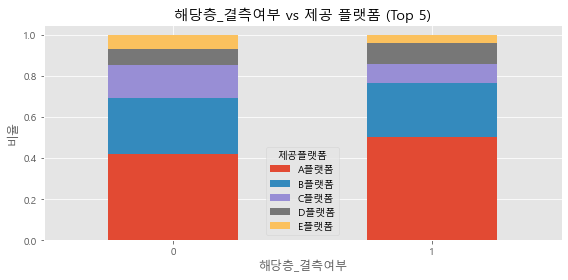

해당층 결측여부와 상위5 제공플랫폼의 카이제곱 검정 결과 chi2=14.22, p=0.0066


In [114]:
# 제공플랫폼과의 관계

top5_platforms = train_origin["제공플랫폼"].value_counts().nlargest(5).index

filtered = train_origin[train_origin["제공플랫폼"].isin(top5_platforms)]

# 교차비율표
platform_ratio = pd.crosstab(filtered["해당층_결측여부"], filtered["제공플랫폼"], normalize="index")

# 시각화
platform_ratio.plot(kind="bar", stacked=True, figsize=(8, 4))
plt.title("해당층_결측여부 vs 제공 플랫폼 (Top 5)")
plt.ylabel("비율")
plt.xlabel("해당층_결측여부")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(filtered["해당층_결측여부"], filtered["제공플랫폼"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"해당층 결측여부와 상위5 제공플랫폼의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

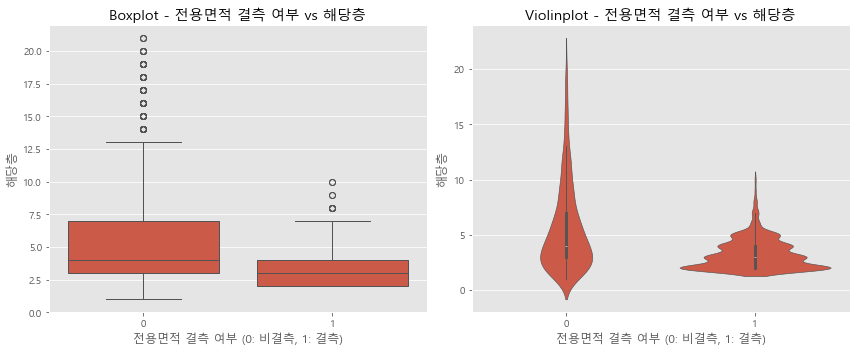

Mann-Whitney U test: statistic = 732615.0000, p-value = 0.0000


In [115]:
# 전용면적과의 관계

# 전용면적 결측여부 피처 (있으면 생략)
train_origin['전용면적_결측여부'] = train_origin['전용면적'].isnull().astype(int)

# 해당층이 존재하는 행만 필터링
plot_data = train_origin[train_origin['해당층'].notnull()]

# 서브플롯 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1행 2열

# (0,0): Boxplot
sns.boxplot(data=plot_data, x='전용면적_결측여부', y='해당층', ax=axes[0])
axes[0].set_title("Boxplot - 전용면적 결측 여부 vs 해당층")
axes[0].set_xlabel("전용면적 결측 여부 (0: 비결측, 1: 결측)")
axes[0].set_ylabel("해당층")

# (0,1): Violin Plot
sns.violinplot(data=plot_data, x='전용면적_결측여부', y='해당층', inner='box', ax=axes[1])
axes[1].set_title("Violinplot - 전용면적 결측 여부 vs 해당층")
axes[1].set_xlabel("전용면적 결측 여부 (0: 비결측, 1: 결측)")
axes[1].set_ylabel("해당층")

plt.tight_layout()
plt.show()

# 전용면적 결측 여부에 따른 두 그룹으로 분리 (해당층 결측은 제거)
group_0 = train_origin[(train_origin['전용면적_결측여부'] == 0) & (train_origin['해당층'].notnull())]['해당층']
group_1 = train_origin[(train_origin['전용면적_결측여부'] == 1) & (train_origin['해당층'].notnull())]['해당층']

# Mann-Whitney U 검정
stat, p = mannwhitneyu(group_0, group_1, alternative='two-sided')
print(f"Mann-Whitney U test: statistic = {stat:.4f}, p-value = {p:.4f}")

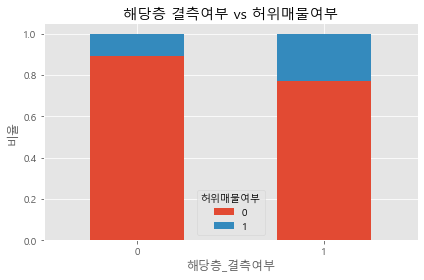

해당층 결측여부와 허위매물여부의 카이제곱 검정 결과 chi2=27.46, p=0.0000


In [116]:
# 허위매물여부와의 관계

pd.crosstab(train_origin["해당층_결측여부"], train_origin["허위매물여부"], normalize="index").plot(kind="bar", stacked=True, figsize=(6,4))
plt.title("해당층 결측여부 vs 허위매물여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_origin["해당층_결측여부"], train_origin["허위매물여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"해당층 결측여부와 허위매물여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

해당층 피처의 결측은 무작위로 발생하지 않고, 주차가능 여부, 제공 플랫폼, 전용면적, 그리고 허위매물 여부와 유의미한 관계를 가진다.
이는 입력 생략이나 플랫폼의 구조적 특성 등으로 인해 조건부 결측(MAR)이 발생했을 가능성을 시사하며, 특히 특정 플랫폼(A, D)이나 주차가능 매물에서 결측이 집중된다.

해당층이 결측인 경우, 허위매물 비율이 더 높았다.

이는 해당층 결측이 입력 부실, 의도적 누락, 정보 부족 등의 결과일 가능성을 암시하며, 허위매물 여부를 간접적으로 설명하는 잠재적 단서로 기능할 수 있다.

#### (2) 연속형 피처와의 관계

In [117]:
train_origin.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,해당층_결측여부,전용면적_결측여부
0,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,1,1
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0,0,1
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0,0,1
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,0,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1,0,1


In [118]:
# 연속형 피처 선택. 이산형(방수와 욕실수)은 범주형에서 확인, 결측여부 피처 제외

numerical_columns = train_origin.select_dtypes(include=['int','float']).columns

numerical_columns = numerical_columns.drop(['해당층_결측여부', '전용면적_결측여부','방수','욕실수','허위매물여부','해당층'])

In [119]:
numerical_columns

Index(['보증금', '월세', '전용면적', '총층', '총주차대수', '관리비'], dtype='object')

In [120]:
train_floor_not_null = train_origin[~train_origin['보증금'].isnull()]
train_floor_null = train_origin[train_origin['보증금'].isnull()]

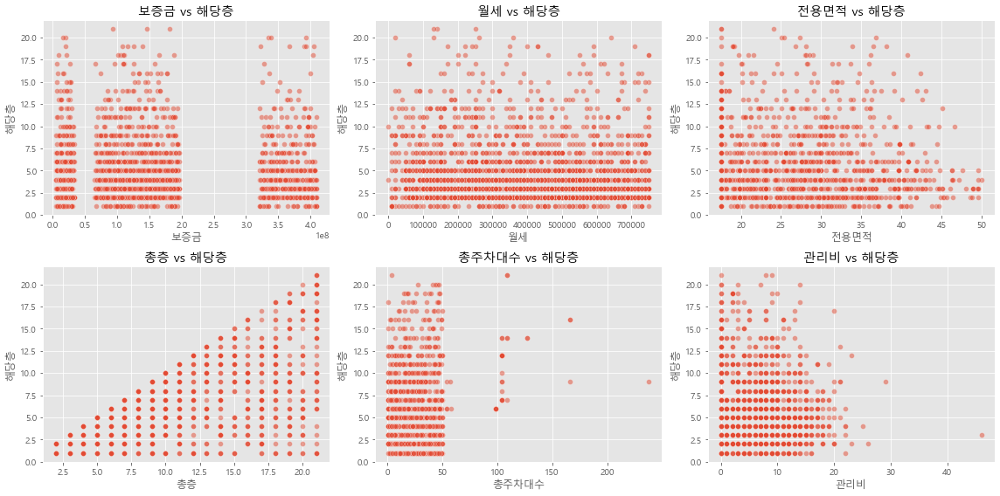

In [121]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.scatterplot(data=train_floor_not_null, x=col, y='해당층', ax=axes[i], alpha=0.5)
    axes[i].set_title(f"{col} vs 해당층")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("해당층")

plt.tight_layout()
plt.show()

<Axes: xlabel='log_총주차대수', ylabel='해당층'>

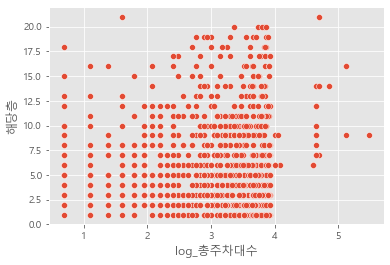

In [122]:
train_floor_not_null['log_총주차대수'] = np.log1p(train_floor_not_null['총주차대수'])
sns.scatterplot(data=train_floor_not_null, x='log_총주차대수', y='해당층')

<Axes: xlabel='log_관리비', ylabel='해당층'>

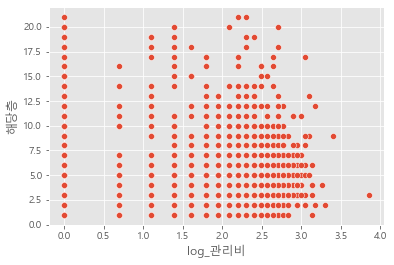

In [123]:
train_floor_not_null['log_관리비'] = np.log1p(train_floor_not_null['관리비'])
sns.scatterplot(data=train_floor_not_null, x='log_관리비', y='해당층')

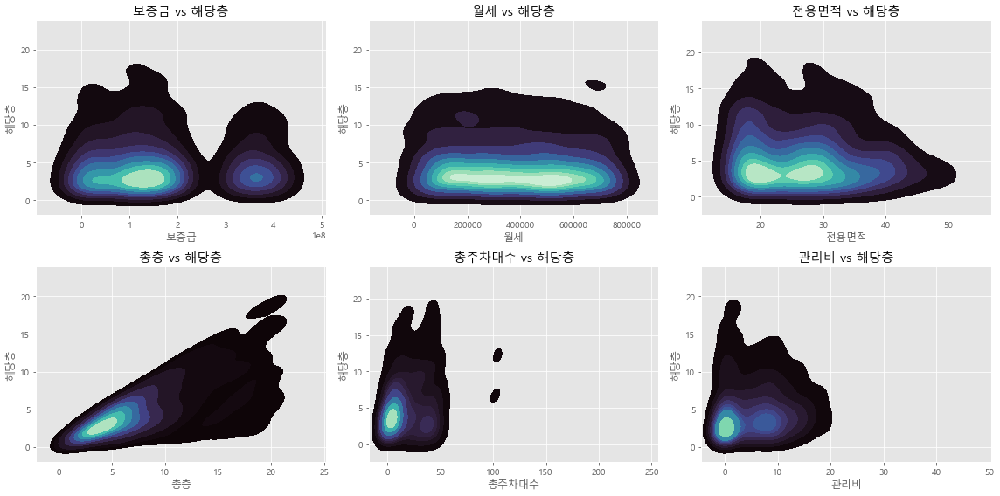

In [124]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.kdeplot(data=train_floor_not_null, x=col, y='해당층', fill=True, ax=axes[i], cmap='mako')
    axes[i].set_title(f"{col} vs 해당층")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("해당층")

plt.tight_layout()
plt.show()

In [125]:
correlations = {}

for col in numerical_columns:
    corr = train_floor_not_null[[col, '해당층']].corr(method='spearman').iloc[0,1]
    correlations[col] = corr

# 출력
for col, corr in correlations.items():
    print(f"Spearman correlation (해당층 vs {col}): {corr:.4f}")

Spearman correlation (해당층 vs 보증금): 0.0257
Spearman correlation (해당층 vs 월세): -0.0577
Spearman correlation (해당층 vs 전용면적): -0.1060
Spearman correlation (해당층 vs 총층): 0.6771
Spearman correlation (해당층 vs 총주차대수): 0.2531
Spearman correlation (해당층 vs 관리비): 0.1843


연속형 변수들과의 관계를 살펴본 결과, 총주차대수와 관리비는 플랏에서는 뚜렷한 패턴을 확인하긴 어려웠지만, 상관계수가 0.2 정도로 약한 연관성을 가지므로 보조 피처로 활용 가능하다고 판단된다.

반면, 총층은 해당층과 구조적으로 상한선을 공유하는 물리적 관계에 있기 때문에, 결측치 보간에 있어 핵심적인 입력 피처로 사용될 수 있다.

In [126]:
train_floor_not_null.drop(columns=['log_총주차대수', 'log_관리비'], inplace=True)

#### (3) 범주형 피처와의 관계

In [127]:
train_floor_not_null["게재일"] = pd.to_datetime(train_floor_not_null["게재일"])

In [128]:
# 상위 5개 중개사무소만 추출
top_offices = train_floor_not_null["중개사무소"].value_counts().nlargest(5).index

# 상위만 남기고 나머지는 '기타'로 처리 (선택)
train_floor_not_null["중개사무소_top5"] = train_floor_not_null["중개사무소"].apply(lambda x: x if x in top_offices else "기타")

In [129]:
categorical_columns = train_floor_not_null.select_dtypes(include=['object']).columns.tolist()

# 제외: '게재일', '중개사무소'
categorical_columns = [col for col in categorical_columns if col not in ['게재일', '중개사무소']]

# 추가: 방수, 욕실수
categorical_columns += ['방수', '욕실수']

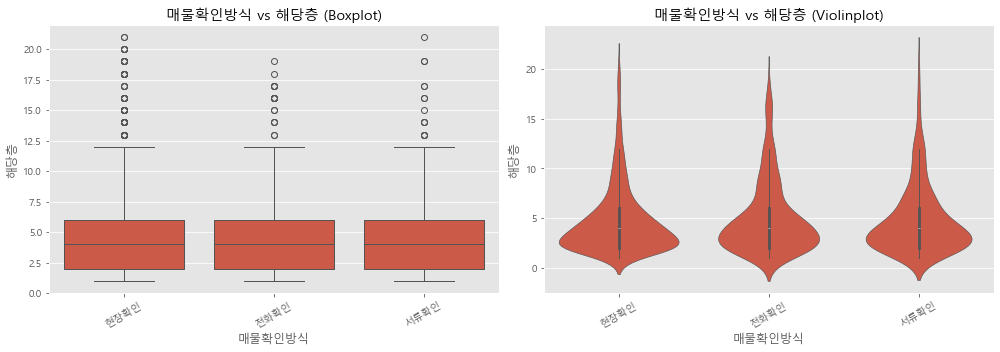

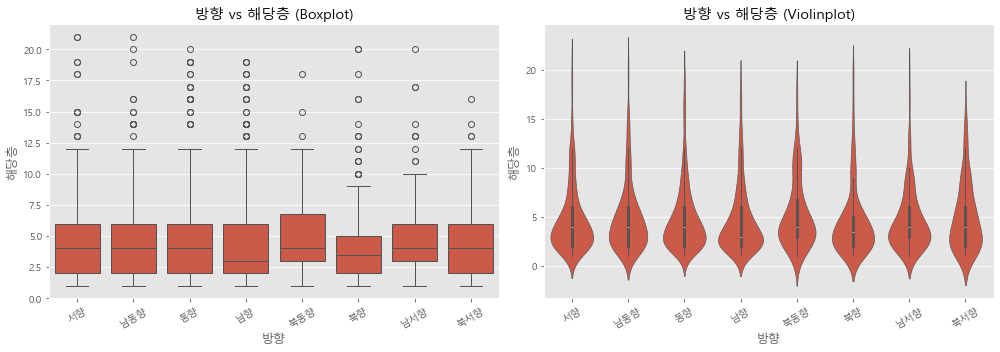

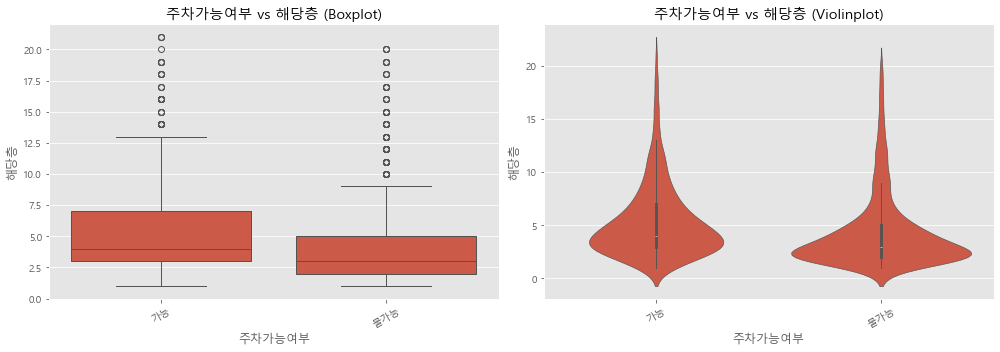

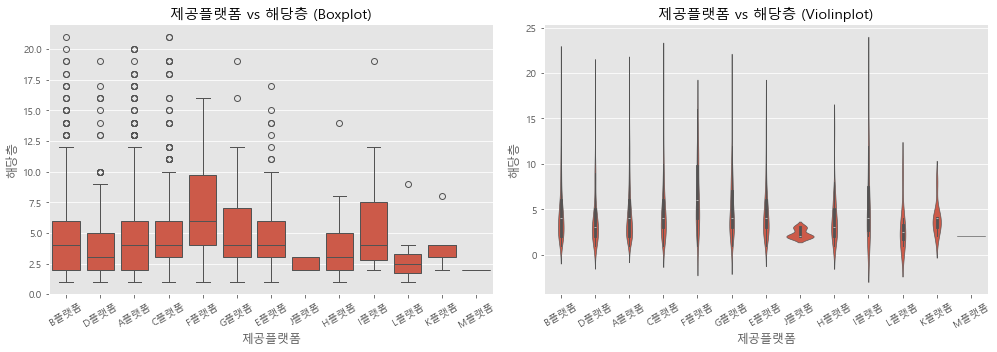

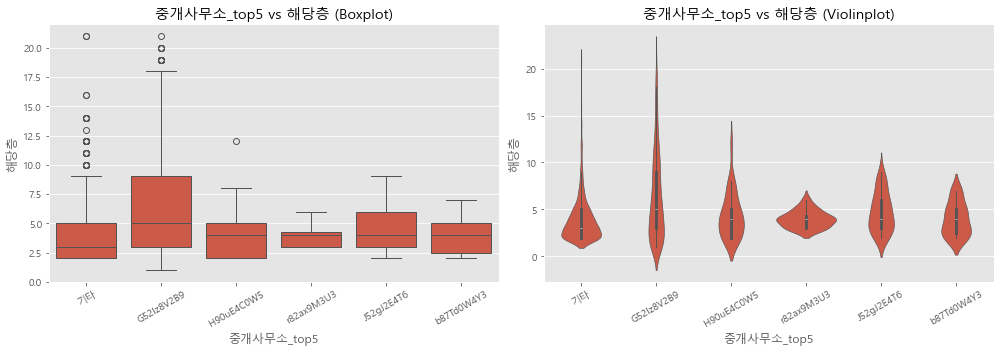

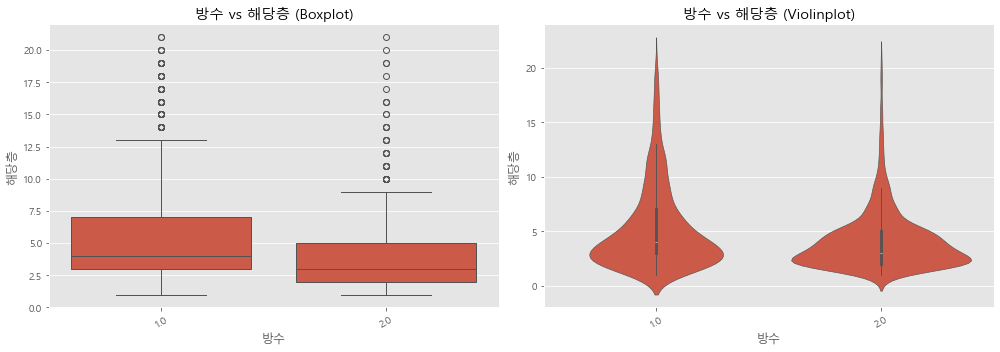

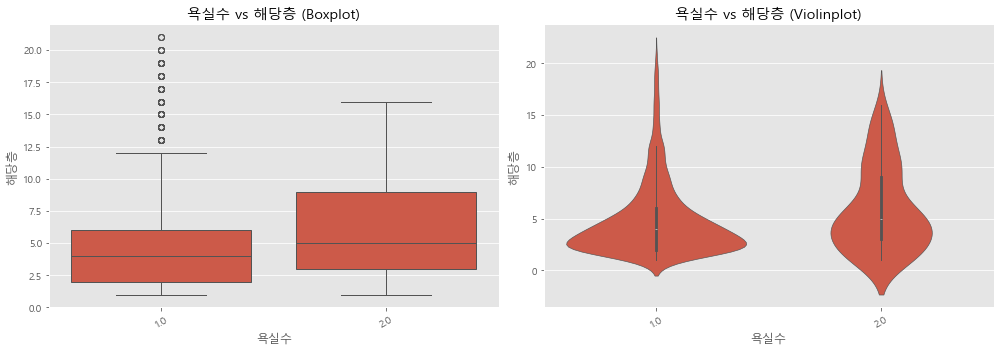

In [130]:
for col in categorical_columns:
    plt.figure(figsize=(14, 5))
    
    # 서브플롯 (1행 2열)
    plt.subplot(1, 2, 1)
    sns.boxplot(data=train_floor_not_null, x=col, y='해당층')
    plt.title(f"{col} vs 해당층 (Boxplot)")
    plt.xticks(rotation=30)
    
    plt.subplot(1, 2, 2)
    sns.violinplot(data=train_floor_not_null, x=col, y='해당층', inner='box')
    plt.title(f"{col} vs 해당층 (Violinplot)")
    plt.xticks(rotation=30)
    
    plt.tight_layout()
    plt.show()

In [131]:
for col in categorical_columns:
    categories = train_floor_not_null[col].dropna().unique()
    
    # 그룹별 해당층 값 리스트 생성
    grouped = [
        train_floor_not_null[train_floor_not_null[col] == cat]['해당층'].dropna().values
        for cat in categories
    ]
    
    if len(categories) == 2:
        stat, p = mannwhitneyu(grouped[0], grouped[1], alternative='two-sided')
        test_name = "Mann-Whitney U"
    else:
        stat, p = kruskal(*grouped)
        test_name = "Kruskal-Wallis H"
        
    print(f"{col} → {test_name} test | stat = {stat:.4f}, p = {p:.4f}")

매물확인방식 → Kruskal-Wallis H test | stat = 1.7392, p = 0.4191
방향 → Kruskal-Wallis H test | stat = 9.4194, p = 0.2239
주차가능여부 → Mann-Whitney U test | stat = 776600.0000, p = 0.0000
제공플랫폼 → Kruskal-Wallis H test | stat = 49.7548, p = 0.0000
중개사무소_top5 → Kruskal-Wallis H test | stat = 128.4071, p = 0.0000
방수 → Mann-Whitney U test | stat = 657496.0000, p = 0.0000
욕실수 → Mann-Whitney U test | stat = 76375.0000, p = 0.0182


범주형 피처와의 박스, 바이올린 플랏의 형태와 비모수 검정 결과  
매물확인방식과 방향의 경우 해당층 피처와 통계적으로 독립적이라는 결과가 나왔기 때문에 결측치의 보간시 입력피처를 사용하지 않고,  
나머지 '주차가능여부','제공플랫폼','중개사무소','방수','욕실수' 피처는 활용한다.

#### (4) 시간적 변화

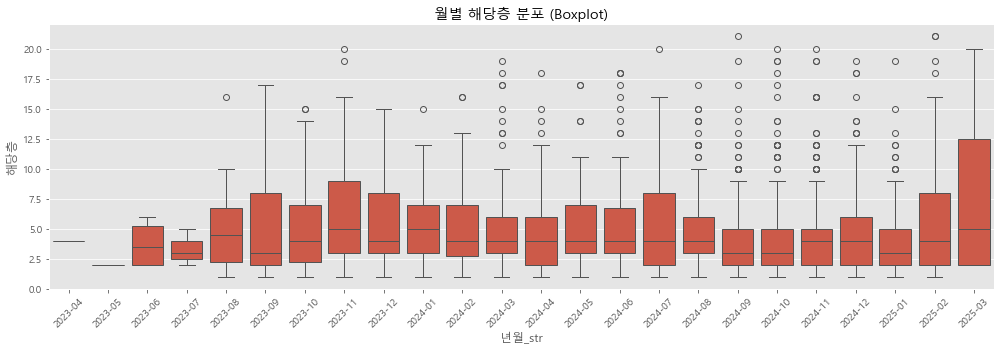

In [132]:
train_floor_not_null["년월"] = train_floor_not_null["게재일"].dt.to_period("M")

train_floor_not_null['년월_str'] = train_floor_not_null['년월'].astype(str)

# 2. 문자열을 시간순으로 정렬된 카테고리형으로 지정
sorted_months = sorted(train_floor_not_null['년월_str'].unique())  # 시간순 정렬
train_floor_not_null['년월_str'] = pd.Categorical(
    train_floor_not_null['년월_str'],
    categories=sorted_months,
    ordered=True
)

plt.figure(figsize=(14, 5))
sns.boxplot(data=train_floor_not_null, x='년월_str', y='해당층')
plt.xticks(rotation=45)
plt.title("월별 해당층 분포 (Boxplot)")
plt.tight_layout()
plt.show()

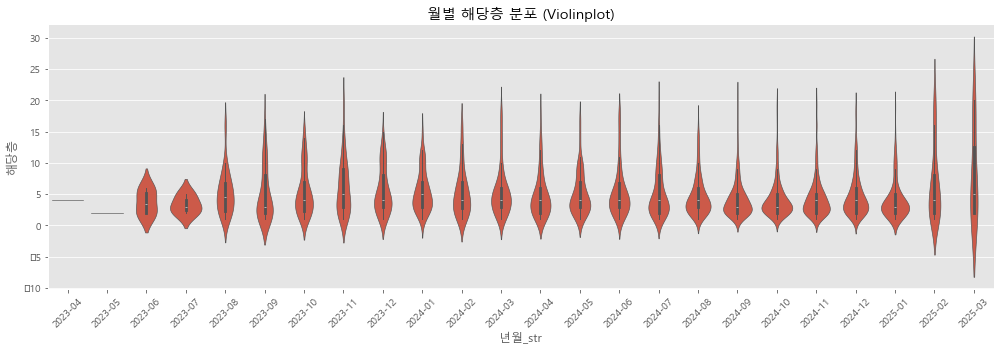

In [133]:
plt.figure(figsize=(14, 5))
sns.violinplot(data=train_floor_not_null, x='년월_str', y='해당층', inner='box')
plt.xticks(rotation=45)
plt.title("월별 해당층 분포 (Violinplot)")
plt.tight_layout()
plt.show()

In [134]:
# Kruskal-Wallis 검정
grouped = [
    group["해당층"].dropna().values
    for _, group in train_floor_not_null.groupby("년월_str")
]

stat, p = kruskal(*grouped)

print(f"월별 해당층의 분포 Kruskal-Wallis H test: stat = {stat:.4f}, p = {p:.4f}")

월별 해당층의 분포 Kruskal-Wallis H test: stat = 51.6371, p = 0.0006


월별 해당층 분포의 변화는 유의미한 결과로 나왔다. 마찬가지로 결측치 보간에 년월 피처를 활용할 수 있다.

In [135]:
train_floor_not_null = train_floor_not_null.drop(columns=['년월_str'])

#### (5) 보간

연관 피처

연속형 - 총주차대수, 관리비, 총층  
범주형 - 주차가능여부, 제공플랫폼, 중개사무소, 방수, 욕실수  
시계열 - 년월

-> 총주차대수의 경우 결측치가 존재하고 상관계수가 낮기 때문에 예측시 제외.

랜덤 포레스트를 통해 예측

In [136]:
train_origin = train.copy()

train_floor_not_null = train_origin[train_origin["해당층"].notnull()]
train_floor_null = train_origin[train_origin["해당층"].isnull()]

In [137]:
train_floor_not_null.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1
6,현장확인,348500000.0,400000,NaN,2.0,3.0,북동향,1.0,1.0,불가능,NaN,0,A72Mx9C8U2,D플랫폼,2024-08-23,0


In [138]:
train_floor_not_null.groupby('제공플랫폼')['허위매물여부'].count()

제공플랫폼
A플랫폼    848
B플랫폼    553
C플랫폼    330
D플랫폼    161
E플랫폼    134
F플랫폼     62
G플랫폼     56
H플랫폼     32
I플랫폼     20
J플랫폼      9
K플랫폼      8
L플랫폼      8
M플랫폼      2
Name: 허위매물여부, dtype: int64

In [139]:
# 제공 플랫폼 재범주화

top_platforms = ["A플랫폼", "B플랫폼", "C플랫폼", "D플랫폼", "E플랫폼"]

train_floor_not_null["제공플랫폼_top5"] = train_floor_not_null["제공플랫폼"].apply(lambda x: x if x in top_platforms else "기타")

In [140]:
train_floor_not_null.groupby('중개사무소')['허위매물여부'].count().sort_values(ascending=False).head(5)

중개사무소
G52Iz8V2B9    799
J52gJ2E4T6     31
H90uE4C0W5     29
b87Td0W4Y3     27
w37Qk3B9D2     25
Name: 허위매물여부, dtype: int64

In [141]:
# 중개사무소 재범주화

top_office = ["G52Iz8V2B9", "r82ax9M3U3", "J52gJ2E4T6", "H90uE4C0W5", "b87Td0W4Y3"]

train_floor_not_null["중개사무소_top5"] = train_floor_not_null["중개사무소"].apply(lambda x: x if x in top_office else "기타")

In [142]:
train_floor_not_null.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0,D플랫폼,기타
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0,A플랫폼,기타
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1,B플랫폼,기타
6,현장확인,348500000.0,400000,NaN,2.0,3.0,북동향,1.0,1.0,불가능,NaN,0,A72Mx9C8U2,D플랫폼,2024-08-23,0,D플랫폼,기타


In [143]:
train_floor_null["게재일"] = pd.to_datetime(train_floor_null["게재일"])
train_floor_null["년월"] = train_floor_null["게재일"].dt.to_period("M")
train_floor_null["년월"] = train_floor_null["년월"].astype(str)

train_floor_not_null["게재일"] = pd.to_datetime(train_floor_not_null["게재일"])
train_floor_not_null["년월"] = train_floor_not_null["게재일"].dt.to_period("M")
train_floor_not_null["년월"] = train_floor_not_null["년월"].astype(str)

train_floor_null["제공플랫폼_top5"] = train_floor_null["제공플랫폼"].apply(lambda x: x if x in top_platforms else "기타")
train_floor_not_null["제공플랫폼_top5"] = train_floor_not_null["제공플랫폼"].apply(lambda x: x if x in top_platforms else "기타")

train_floor_null["중개사무소_top5"] = train_floor_null["중개사무소"].apply(lambda x: x if x in top_office else "기타")
train_floor_not_null["중개사무소_top5"] = train_floor_not_null["중개사무소"].apply(lambda x: x if x in top_office else "기타")

train_floor_null['해당층_결측여부'] = train_floor_null['해당층'].isnull().astype(int)
train_floor_not_null['해당층_결측여부'] = train_floor_not_null['해당층'].isnull().astype(int)

In [144]:
columns_interpolate_floor = ['관리비','총층','주차가능여부','제공플랫폼_top5','중개사무소_top5','방수','욕실수','년월']

In [145]:
# 범주형 피처 원핫인코딩

X_train = pd.get_dummies(train_floor_not_null[columns_interpolate_floor])
X_pred = pd.get_dummies(train_floor_null[columns_interpolate_floor])

# 두 개 컬럼 차이 있을 수 있으니 맞춰줌
X_pred = X_pred.reindex(columns=X_train.columns, fill_value=0)

In [146]:
from sklearn.ensemble import RandomForestRegressor

# 타겟 정의
y_train = train_floor_not_null["해당층"]

# 모델 학습
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)

# 예측값
predicted_floors = rf.predict(X_pred)

# 반올림해서 정수화
predicted_floors = np.round(predicted_floors).astype(int)

# 결측값 채우기
train_floor_null.loc[:, "해당층"] = predicted_floors

# 결측/비결측 데이터 다시 합치기
train_interpolated_floor = pd.concat([train_floor_not_null, train_floor_null])

# 인덱스 기준 정렬 (원래 순서대로 복구)
train_interpolated_floor = train_interpolated_floor.sort_index()

In [147]:
train_interpolated_floor.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5,년월,해당층_결측여부
0,현장확인,402500000.0,470000,NaN,9.0,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,B플랫폼,기타,2024-10,1
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0,D플랫폼,기타,2024-12,0
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0,A플랫폼,기타,2024-11,0
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9,2024-11,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1,B플랫폼,기타,2024-06,0


In [148]:
train_interpolated_floor['해당층'].describe()

count    2452.000000
mean        4.897227
std         3.469051
min         1.000000
25%         2.000000
50%         4.000000
75%         6.000000
max        21.000000
Name: 해당층, dtype: float64

In [149]:
train_interpolated_floor['해당층'].isnull().sum()

0

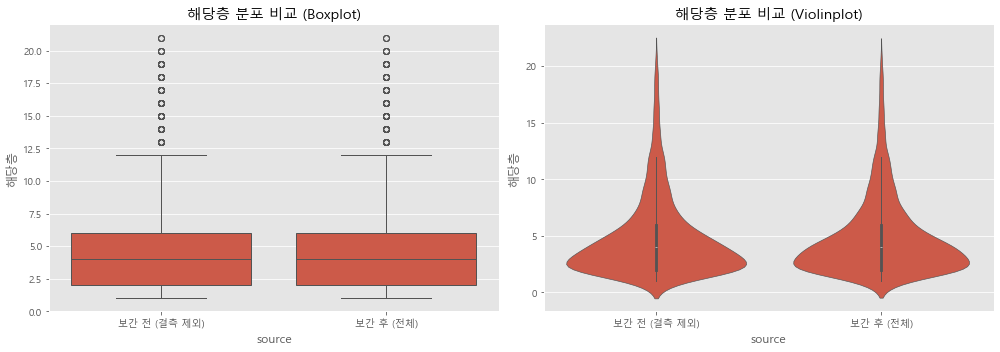

In [150]:
# 비교를 위한 라벨 컬럼 추가
train_floor_not_null["source"] = "보간 전 (결측 제외)"
train_interpolated_floor["source"] = "보간 후 (전체)"

# 시각화를 위한 데이터 결합
compare_df = pd.concat([
    train_floor_not_null[["해당층", "source"]],
    train_interpolated_floor[["해당층", "source"]]
])

# 시각화
plt.figure(figsize=(14, 5))

# 1. Boxplot
plt.subplot(1, 2, 1)
sns.boxplot(data=compare_df, x="source", y="해당층")
plt.title("해당층 분포 비교 (Boxplot)")

# 2. Violinplot
plt.subplot(1, 2, 2)
sns.violinplot(data=compare_df, x="source", y="해당층", inner="box")
plt.title("해당층 분포 비교 (Violinplot)")

plt.tight_layout()
plt.show()

해당층 피처의 결측치 보간을 완료하였다. 확인해본 결과, 보간 전후 전체적인 분포가 크게 변하지 않았다.

## 3) 총주차대수

총주차대수 피처에는 696개의 결측치, 전체 데이터의 28.38퍼센트에 해당하는 결측치가 존재한다.  
앞서 해당층 피처의 결측치를 채운방식과 마찬가지로 우선적으로 해당 피처와 연관되는 다른 피처를 우선적으로 탐색한 후에, 결측치를 보간하도록 한다.

#### (1) 결측여부 피처

총주차대수 결측여부 피처와 연관있는 피처 - 관리비, 총층, 해당층, 주차가능여부, 제공플랫폼, 허위매물여부

In [151]:
train_to_interpolate_parking = train_interpolated_floor.copy()

train_to_interpolate_parking = train_to_interpolate_parking.drop(columns=['source'])

train_to_interpolate_parking['총주차대수_결측여부'] = train_to_interpolate_parking['총주차대수'].isnull().astype(int)

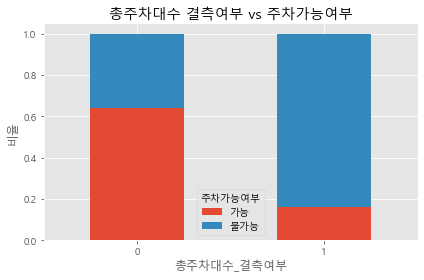

총주차대수 결측여부와 주차가능여부의 카이제곱 검정 결과 chi2=460.83, p=0.0000


In [152]:
# 주차가능여부와의 관계

pd.crosstab(train_to_interpolate_parking["총주차대수_결측여부"], train_to_interpolate_parking["주차가능여부"], normalize="index").plot(
    kind="bar", stacked=True, figsize=(6,4)
)
plt.title("총주차대수 결측여부 vs 주차가능여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_parking["총주차대수_결측여부"], train_to_interpolate_parking["주차가능여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"총주차대수 결측여부와 주차가능여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

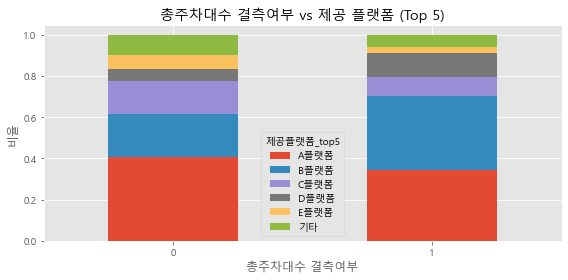

총주차대수 결측여부와 상위5 제공플랫폼의 카이제곱 검정 결과 chi2=112.49, p=0.0000


In [153]:
# 교차비율표
platform_ratio = pd.crosstab(train_to_interpolate_parking["총주차대수_결측여부"], train_to_interpolate_parking["제공플랫폼_top5"], normalize="index")

# 시각화
platform_ratio.plot(kind="bar", stacked=True, figsize=(8, 4))
plt.title("총주차대수 결측여부 vs 제공 플랫폼 (Top 5)")
plt.ylabel("비율")
plt.xlabel("총주차대수 결측여부")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_parking["총주차대수_결측여부"], train_to_interpolate_parking["제공플랫폼_top5"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"총주차대수 결측여부와 상위5 제공플랫폼의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

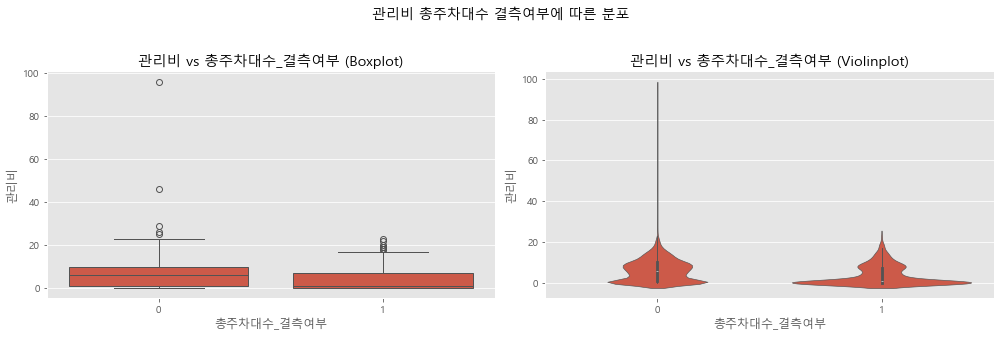

관리비 vs 총주차대수_결측여부 → Mann-Whitney U test: stat = 788494.0000, p = 0.0000


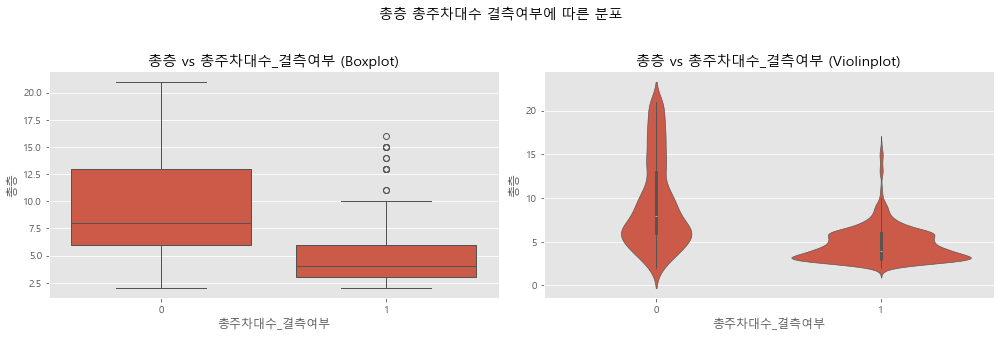

총층 vs 총주차대수_결측여부 → Mann-Whitney U test: stat = 964919.0000, p = 0.0000


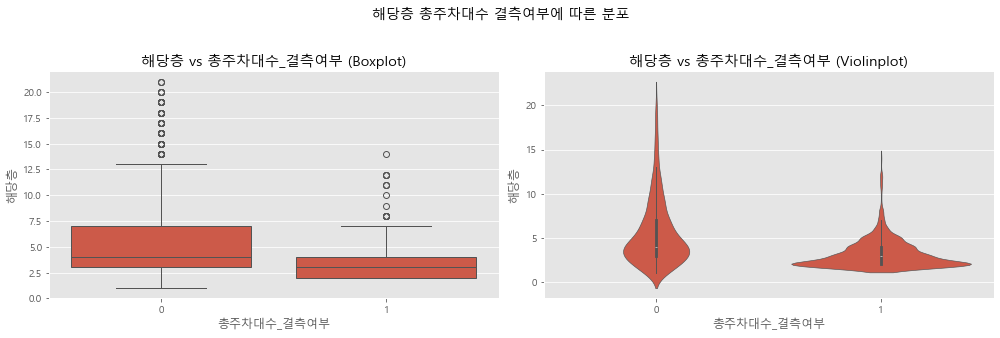

해당층 vs 총주차대수_결측여부 → Mann-Whitney U test: stat = 877160.0000, p = 0.0000


In [154]:
# 분석 대상 연속형 피처 리스트
numeric_cols = ['관리비', '총층', '해당층']

# 시각화 + 검정 반복
for col in numeric_cols:
    plt.figure(figsize=(14, 5))
    
    # 1. Boxplot
    plt.subplot(1, 2, 1)
    sns.boxplot(data=train_to_interpolate_parking, x='총주차대수_결측여부', y=col)
    plt.title(f"{col} vs 총주차대수_결측여부 (Boxplot)")

    # 2. Violinplot
    plt.subplot(1, 2, 2)
    sns.violinplot(data=train_to_interpolate_parking, x='총주차대수_결측여부', y=col, inner='box')
    plt.title(f"{col} vs 총주차대수_결측여부 (Violinplot)")

    plt.suptitle(f"{col} 총주차대수 결측여부에 따른 분포", fontsize=14)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

    # 3. Mann-Whitney U 검정
    group1 = train_to_interpolate_parking[train_to_interpolate_parking['총주차대수_결측여부'] == True][col].dropna()
    group0 = train_to_interpolate_parking[train_to_interpolate_parking['총주차대수_결측여부'] == False][col].dropna()

    stat, p = mannwhitneyu(group0, group1, alternative='two-sided')
    print(f"{col} vs 총주차대수_결측여부 → Mann-Whitney U test: stat = {stat:.4f}, p = {p:.4f}")

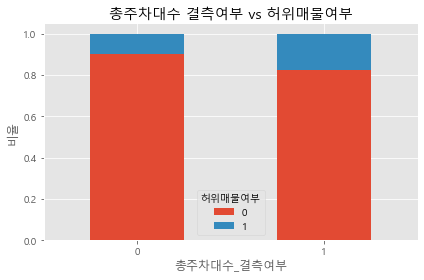

총주차대수 결측여부와 허위매물여부의 카이제곱 검정 결과 chi2=25.60, p=0.0000


In [155]:
# 허위매물여부와의 관계

pd.crosstab(train_to_interpolate_parking["총주차대수_결측여부"], train_to_interpolate_parking["허위매물여부"], normalize="index").plot(kind="bar", stacked=True, figsize=(6,4))
plt.title("총주차대수 결측여부 vs 허위매물여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_parking["총주차대수_결측여부"], train_to_interpolate_parking["허위매물여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"총주차대수 결측여부와 허위매물여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

해당층 피처와 유사하게 총주차대수 피처도 무작위로 발생하지 않았으며, 주차가능여부, 제공 플랫폼, 총층, 해당층, 관리비 피처와 모두 유의미한 관계를 가진다. 이는 조건부 결측이 발생했을 가능성을 시사한다. 주차불가능, 플랫폼이 B와 D일때 총주차대수의 결측 비율이 높다.

총주차대수가 결측일떄 허위매물의 비율이 높았으며, 이를 통해 허위매물여부를 간접적으로 설명하는 잠재적 단서로 기능할 수 있다.

#### (2) 연속형 피처와의 관계

In [156]:
train_to_interpolate_parking.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5,년월,해당층_결측여부,총주차대수_결측여부
0,현장확인,402500000.0,470000,NaN,9.0,15.0,서향,1.0,1.0,가능,...,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,B플랫폼,기타,2024-10,1,0
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,0,q39iV5J4E6,D플랫폼,2024-12-26,0,D플랫폼,기타,2024-12,0,1
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,0,b03oE4G3F6,A플랫폼,2024-11-28,0,A플랫폼,기타,2024-11,0,1
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9,2024-11,0,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,0,N45gM0M7R0,B플랫폼,2024-06-25,1,B플랫폼,기타,2024-06,0,1


In [158]:
numerical_columns = train_to_interpolate_parking.select_dtypes(include=['int','float']).columns

numerical_columns = numerical_columns.drop(['방수','욕실수','총주차대수','허위매물여부','해당층_결측여부','총주차대수_결측여부'])

numerical_columns

Index(['보증금', '월세', '전용면적', '해당층', '총층', '관리비'], dtype='object')

In [159]:
train_parking_not_null = train_to_interpolate_parking[~train_to_interpolate_parking['총주차대수'].isnull()]
train_parking_null = train_to_interpolate_parking[train_to_interpolate_parking['총주차대수'].isnull()]

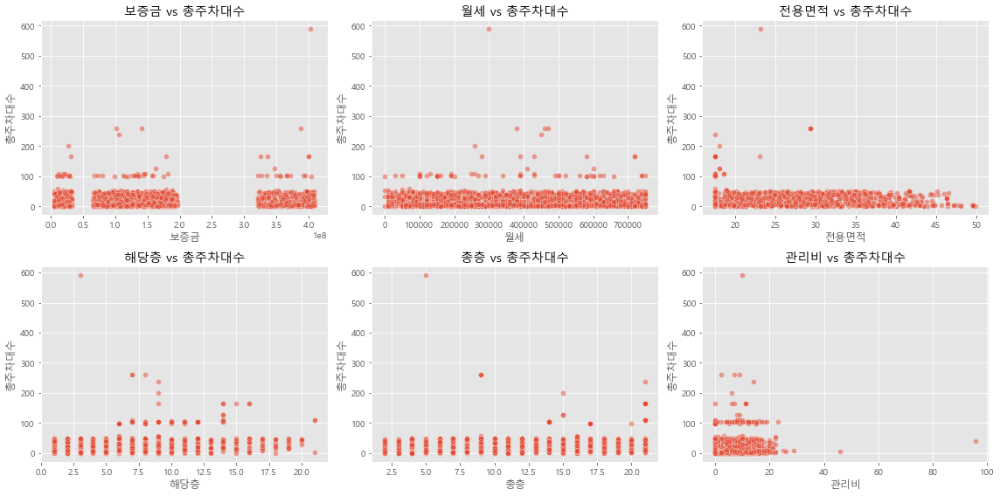

In [160]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.scatterplot(data=train_parking_not_null, x=col, y='총주차대수', ax=axes[i], alpha=0.5)
    axes[i].set_title(f"{col} vs 총주차대수")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("총주차대수")

plt.tight_layout()
plt.show()

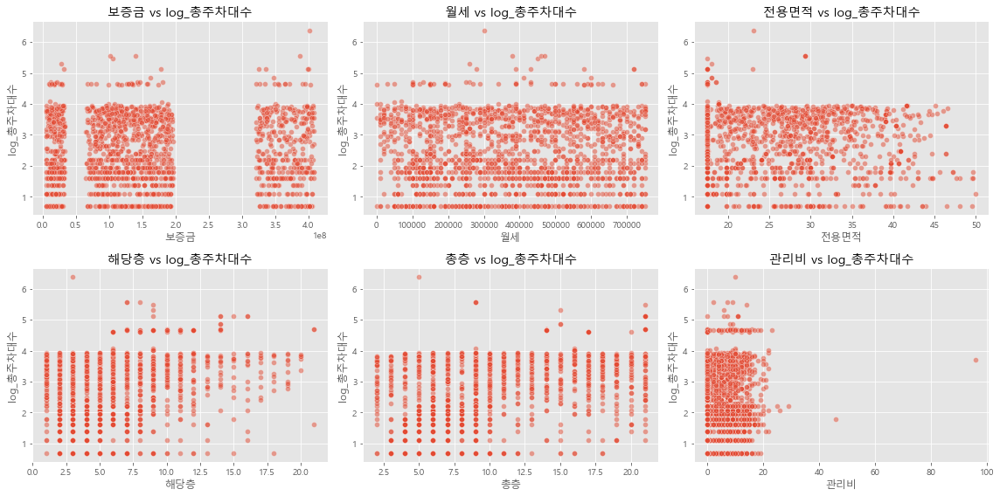

In [161]:
train_parking_not_null['log_총주차대수'] = np.log1p(train_parking_not_null['총주차대수'])

fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.scatterplot(data=train_parking_not_null, x=col, y='log_총주차대수', ax=axes[i], alpha=0.5)
    axes[i].set_title(f"{col} vs log_총주차대수")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("log_총주차대수")

plt.tight_layout()
plt.show()

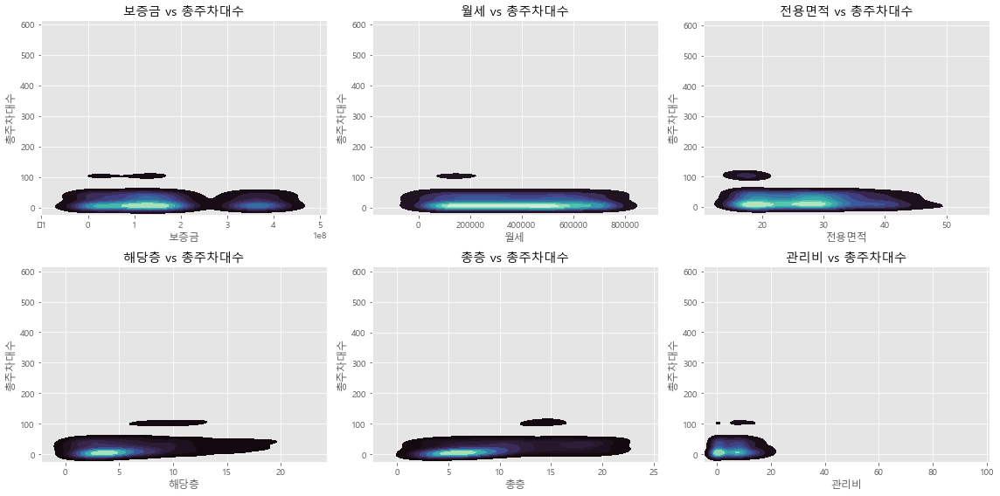

In [162]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.kdeplot(data=train_parking_not_null, x=col, y='총주차대수', fill=True, ax=axes[i], cmap='mako')
    axes[i].set_title(f"{col} vs 총주차대수")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("총주차대수")

plt.tight_layout()
plt.show()

In [163]:
correlations = {}

for col in numerical_columns:
    corr = train_parking_not_null[[col, '총주차대수']].corr(method='spearman').iloc[0,1]
    correlations[col] = corr

# 출력
for col, corr in correlations.items():
    print(f"Spearman correlation (총주차대수 vs {col}): {corr:.4f}")

Spearman correlation (총주차대수 vs 보증금): 0.0074
Spearman correlation (총주차대수 vs 월세): -0.0129
Spearman correlation (총주차대수 vs 전용면적): -0.0569
Spearman correlation (총주차대수 vs 해당층): 0.2952
Spearman correlation (총주차대수 vs 총층): 0.4939
Spearman correlation (총주차대수 vs 관리비): 0.0778


연속형 변수들과의 관계를 살펴본 결과, 플랏을 통해 피처간의 관계를 확인하기는 어려웠다. 스피어만 상관관계를 통해 확인한 스피어만 상관계수가 상대적으로 큰 해당층과 총층 피처를 결측치 보간에 사용해보도록 하자.

#### (3) 범주형 피처와의 관계

In [164]:
categorical_columns = train_parking_not_null.select_dtypes(include=['object']).columns.tolist()

# 제외: '게재일', '중개사무소'
categorical_columns = [col for col in categorical_columns if col not in ['년월', '중개사무소','제공플랫폼']]

# 추가: 방수, 욕실수
categorical_columns += ['방수', '욕실수']

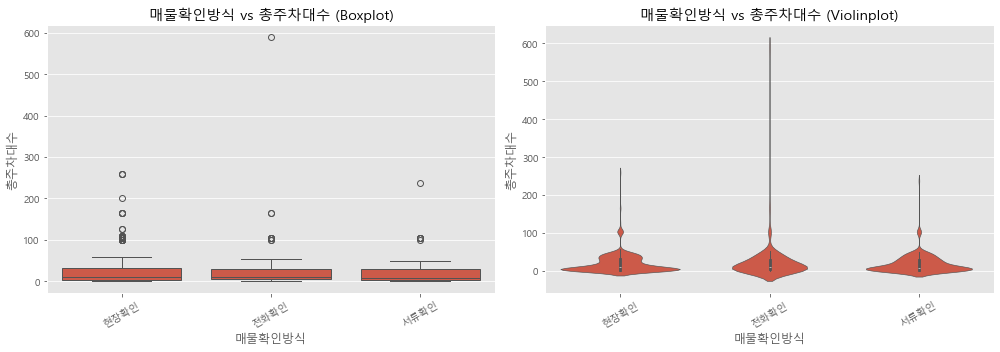

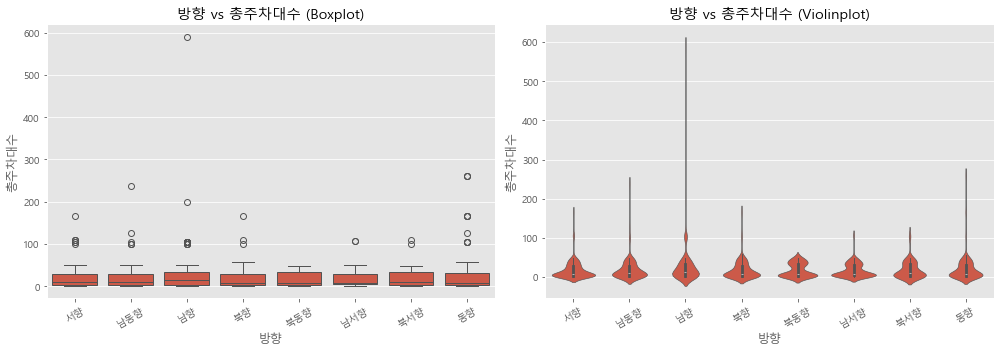

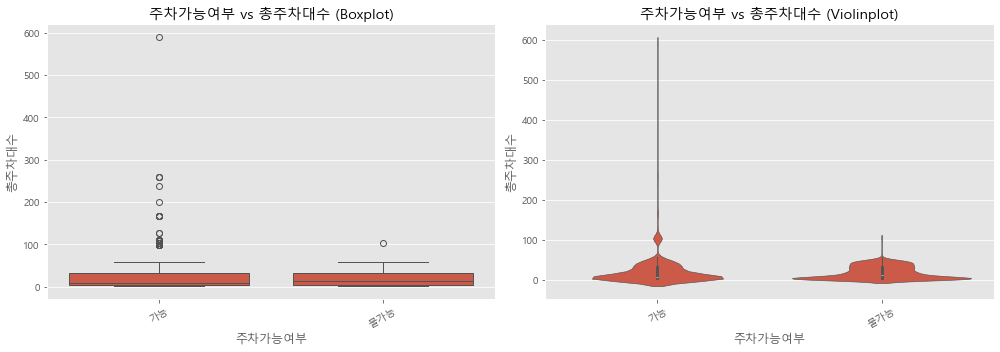

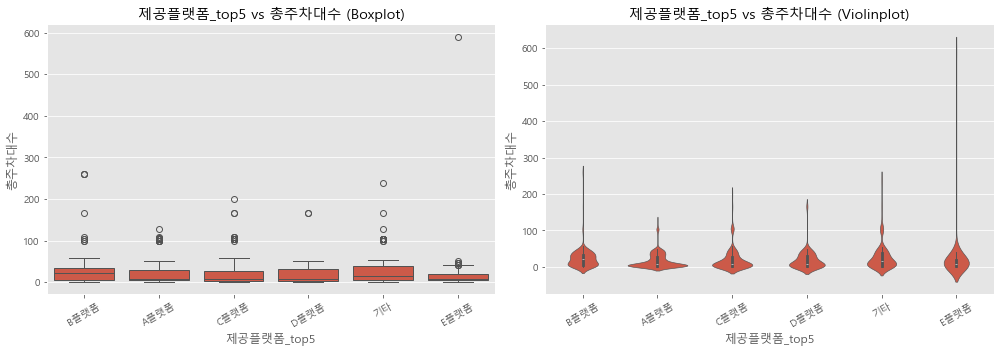

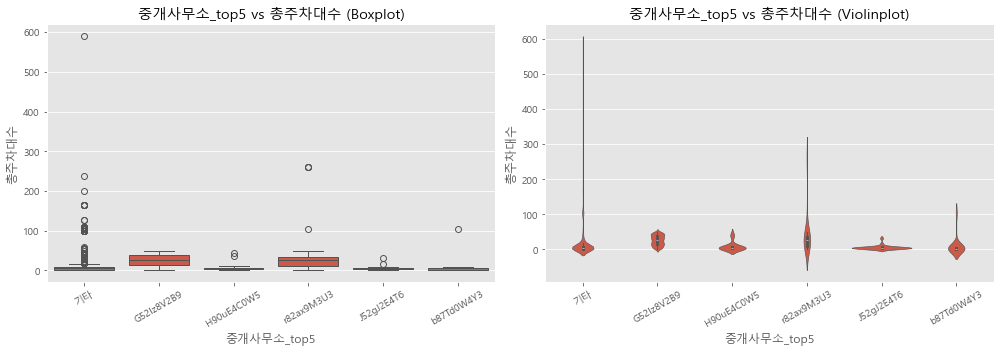

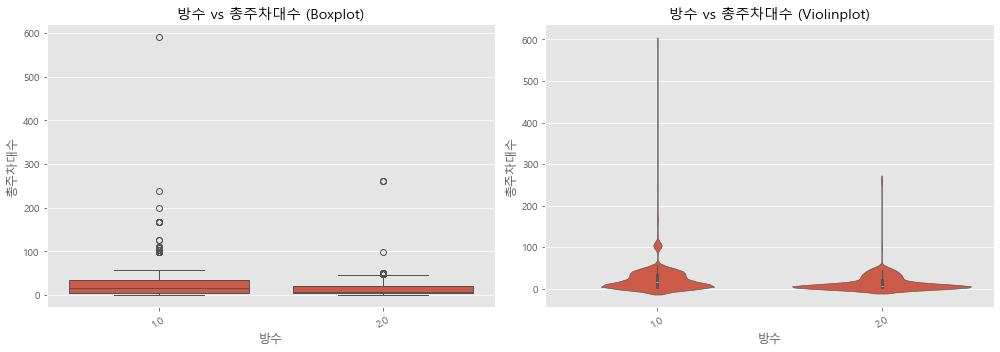

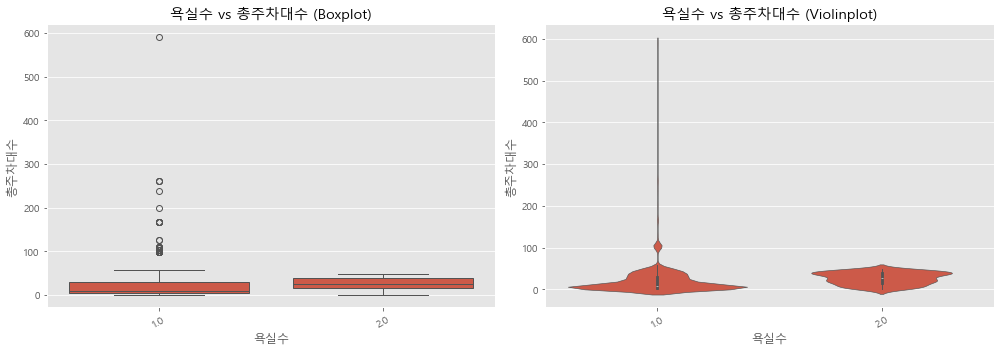

In [165]:
for col in categorical_columns:
    plt.figure(figsize=(14, 5))
    
    # 서브플롯 (1행 2열)
    plt.subplot(1, 2, 1)
    sns.boxplot(data=train_parking_not_null, x=col, y='총주차대수')
    plt.title(f"{col} vs 총주차대수 (Boxplot)")
    plt.xticks(rotation=30)
    
    plt.subplot(1, 2, 2)
    sns.violinplot(data=train_parking_not_null, x=col, y='총주차대수', inner='box')
    plt.title(f"{col} vs 총주차대수 (Violinplot)")
    plt.xticks(rotation=30)
    
    plt.tight_layout()
    plt.show()

In [166]:
for col in categorical_columns:
    categories = train_parking_not_null[col].dropna().unique()
    
    # 그룹별 해당층 값 리스트 생성
    grouped = [
        train_parking_not_null[train_parking_not_null[col] == cat]['총주차대수'].dropna().values
        for cat in categories
    ]
    
    if len(categories) == 2:
        stat, p = mannwhitneyu(grouped[0], grouped[1], alternative='two-sided')
        test_name = "Mann-Whitney U"
    else:
        stat, p = kruskal(*grouped)
        test_name = "Kruskal-Wallis H"
        
    print(f"{col} → {test_name} test | stat = {stat:.4f}, p = {p:.4f}")

매물확인방식 → Kruskal-Wallis H test | stat = 0.2433, p = 0.8855
방향 → Kruskal-Wallis H test | stat = 5.2588, p = 0.6284
주차가능여부 → Mann-Whitney U test | stat = 343205.5000, p = 0.2592
제공플랫폼_top5 → Kruskal-Wallis H test | stat = 48.1509, p = 0.0000
중개사무소_top5 → Kruskal-Wallis H test | stat = 567.8742, p = 0.0000
방수 → Mann-Whitney U test | stat = 425421.5000, p = 0.0000
욕실수 → Mann-Whitney U test | stat = 44406.0000, p = 0.0000


범주형 피처와의 박스, 바이올린 플랏의 형태와 비모수 검정 결과  
매물확인방식, 방향, 주차가능여부와는 독립적이며, 제공플랫폼, 중개사무소, 방수, 욕실수는 독립적이지 않기 때문에 이를 결측치 보간에 활용한다.

#### (4) 시간적 변화

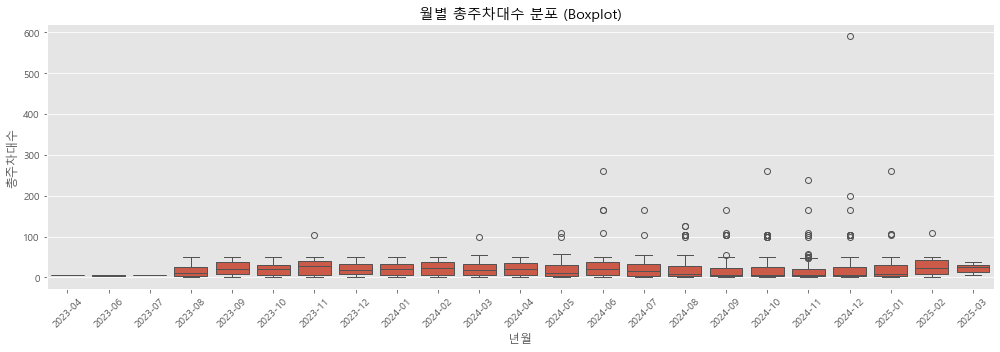

In [167]:
# 2. 문자열을 시간순으로 정렬된 카테고리형으로 지정
sorted_months = sorted(train_parking_not_null['년월'].unique())  # 시간순 정렬
train_parking_not_null['년월'] = pd.Categorical(
    train_parking_not_null['년월'],
    categories=sorted_months,
    ordered=True
)

plt.figure(figsize=(14, 5))
sns.boxplot(data=train_parking_not_null, x='년월', y='총주차대수')
plt.xticks(rotation=45)
plt.title("월별 총주차대수 분포 (Boxplot)")
plt.tight_layout()
plt.show()

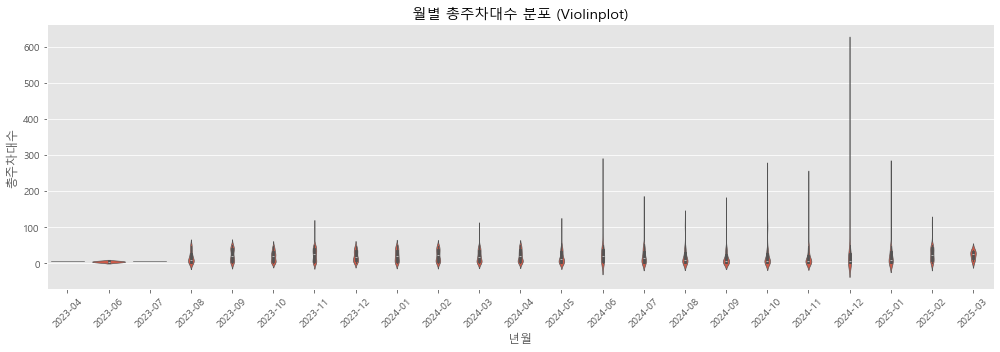

In [168]:
plt.figure(figsize=(14, 5))
sns.violinplot(data=train_parking_not_null, x='년월', y='총주차대수', inner='box')
plt.xticks(rotation=45)
plt.title("월별 총주차대수 분포 (Violinplot)")
plt.tight_layout()
plt.show()

In [169]:
# Kruskal-Wallis 검정
grouped = [
    group["총주차대수"].dropna().values
    for _, group in train_parking_not_null.groupby("년월")
]

stat, p = kruskal(*grouped)

print(f"월별 총주차대수의 분포 Kruskal-Wallis H test: stat = {stat:.4f}, p = {p:.4f}")

월별 총주차대수의 분포 Kruskal-Wallis H test: stat = 83.0496, p = 0.0000


월별 총주차대수 분포의 변화는 유의미한 결과로 나왔다. 마찬가지로 결측치 보간에 년월 피처를 활용할 수 있다.

#### (5) 보간

연관 피처

연속형 - 해당층, 총층  
범주형 - 제공플랫폼, 중개사무소, 방수, 욕실수  
시계열- 년월

랜덤포레스트를 통해 예측

In [170]:
train_to_interpolate_parking = train_interpolated_floor.copy()

train_to_interpolate_parking = train_to_interpolate_parking.drop(columns=['source'])
train_to_interpolate_parking['총주차대수_결측여부'] = train_to_interpolate_parking['총주차대수'].isnull().astype(int)

train_parking_not_null = train_to_interpolate_parking[train_to_interpolate_parking["총주차대수"].notnull()]
train_parking_null = train_to_interpolate_parking[train_to_interpolate_parking["총주차대수"].isnull()]

In [171]:
columns_interpolate_parking = ['해당층','총층','제공플랫폼_top5','중개사무소_top5','방수','욕실수','년월']

In [172]:
# 범주형 피처 원핫인코딩

X_train = pd.get_dummies(train_parking_not_null[columns_interpolate_parking])
X_pred = pd.get_dummies(train_parking_null[columns_interpolate_parking])

# 두 개 컬럼 차이 있을 수 있으니 맞춰줌
X_pred = X_pred.reindex(columns=X_train.columns, fill_value=0)

In [173]:
# 타겟 정의
y_train = train_parking_not_null["총주차대수"]

# 모델 학습
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)

# 예측값
predicted_floors = rf.predict(X_pred)

# 반올림해서 정수화
predicted_floors = np.round(predicted_floors).astype(int)

# 결측값 채우기
train_parking_null.loc[:, "총주차대수"] = predicted_floors

# 결측/비결측 데이터 다시 합치기
train_interpolated_parking = pd.concat([train_parking_not_null, train_parking_null])

# 인덱스 기준 정렬 (원래 순서대로 복구)
train_interpolated_parking = train_interpolated_parking.sort_index()

In [174]:
train_interpolated_parking.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5,년월,해당층_결측여부,총주차대수_결측여부
0,현장확인,402500000.0,470000,NaN,9.0,15.0,서향,1.0,1.0,가능,...,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,B플랫폼,기타,2024-10,1,0
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,0,q39iV5J4E6,D플랫폼,2024-12-26,0,D플랫폼,기타,2024-12,0,1
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,0,b03oE4G3F6,A플랫폼,2024-11-28,0,A플랫폼,기타,2024-11,0,1
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9,2024-11,0,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,0,N45gM0M7R0,B플랫폼,2024-06-25,1,B플랫폼,기타,2024-06,0,1


In [175]:
train_interpolated_parking['총주차대수'].describe()

count    2452.000000
mean       15.741028
std        26.250935
min         1.000000
25%         2.000000
50%         6.000000
75%        22.000000
max       590.000000
Name: 총주차대수, dtype: float64

In [176]:
train_interpolated_parking['총주차대수'].isnull().sum()

0

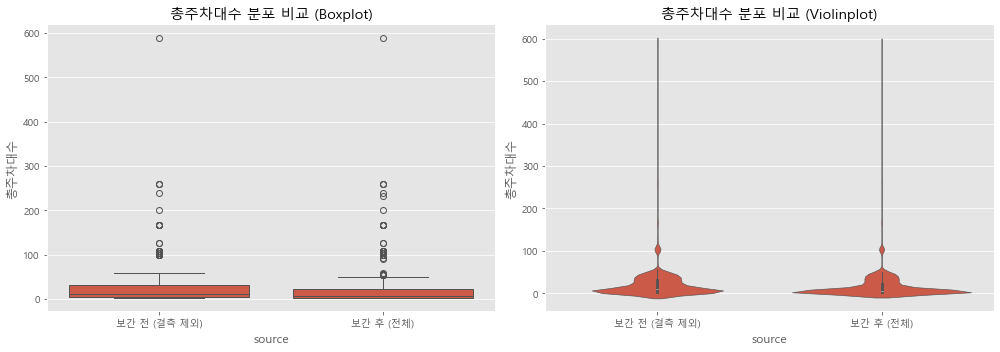

In [177]:
# 비교를 위한 라벨 컬럼 추가
train_parking_not_null["source"] = "보간 전 (결측 제외)"
train_interpolated_parking["source"] = "보간 후 (전체)"

# 시각화를 위한 데이터 결합
compare_df = pd.concat([
    train_parking_not_null[["총주차대수", "source"]],
    train_interpolated_parking[["총주차대수", "source"]]
])

# 시각화
plt.figure(figsize=(14, 5))

# 1. Boxplot
plt.subplot(1, 2, 1)
sns.boxplot(data=compare_df, x="source", y="총주차대수")
plt.title("총주차대수 분포 비교 (Boxplot)")

# 2. Violinplot
plt.subplot(1, 2, 2)
sns.violinplot(data=compare_df, x="source", y="총주차대수", inner="box")
plt.title("총주차대수 분포 비교 (Violinplot)")

plt.tight_layout()
plt.show()

In [178]:
# 보간 전 (결측 제외) 데이터
before_impute = train_parking_not_null["총주차대수"].dropna()

# 보간 후 (전체) 데이터
after_impute = train_interpolated_parking["총주차대수"].dropna()

# Mann-Whitney U 검정
stat, p = mannwhitneyu(before_impute, after_impute, alternative="two-sided")

print(f"[총주차대수] 보간 전후 Mann-Whitney U test:")
print(f"stat = {stat:.4f}, p-value = {p:.4f}")

[총주차대수] 보간 전후 Mann-Whitney U test:
stat = 2524802.5000, p-value = 0.0000


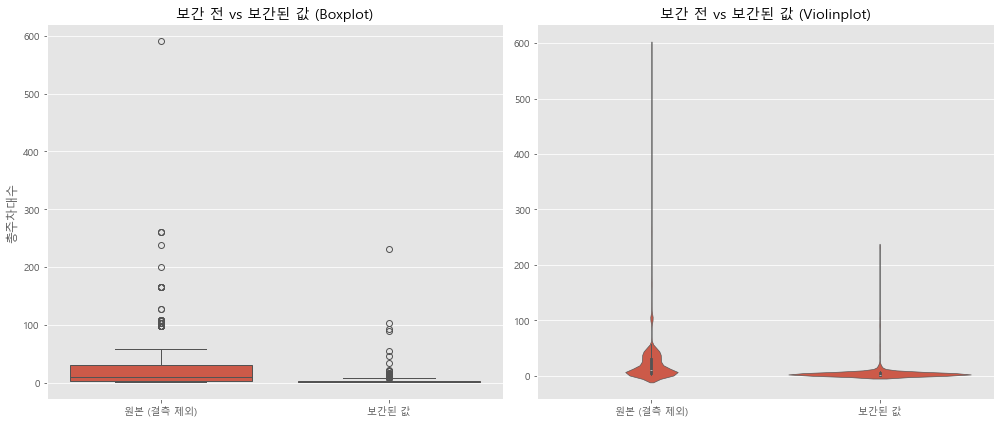

In [179]:
# 1. 보간 전 데이터 (결측 아닌 원래 값)
original = train_parking_not_null[["총주차대수"]].copy()
original["source"] = "원본 (결측 제외)"

# 2. 보간된 값만 추출
# → train_interpolated_parking 중 원래 결측치였던 index들만
interpolated_only = train_interpolated_parking.loc[
    train_parking_not_null.index.symmetric_difference(train_interpolated_parking.index),
    ["총주차대수"]
].copy()
interpolated_only["source"] = "보간된 값"

# 3. 결합
compare_df = pd.concat([original, interpolated_only])

# 4. 시각화
plt.figure(figsize=(14, 6))

# Boxplot
plt.subplot(1, 2, 1)
sns.boxplot(data=compare_df, x="source", y="총주차대수")
plt.title("보간 전 vs 보간된 값 (Boxplot)")
plt.xlabel("")
plt.ylabel("총주차대수")

# Violinplot
plt.subplot(1, 2, 2)
sns.violinplot(data=compare_df, x="source", y="총주차대수", inner="box")
plt.title("보간 전 vs 보간된 값 (Violinplot)")
plt.xlabel("")
plt.ylabel("")

plt.tight_layout()
plt.show()

앞선 해당층의 결측치 보간 결과와는 다르게, 총주차대수의 결측치 보간 후 플랏의 형태와 분포가 달라진것을 확인할 수 있었으며, Mann-Whitney U 검정결과도 보간 전후의 차이가 유의미하다는 결론이 나왔다.  
랜덤 포레스트의 경우 결측치를 예측하여 중앙값 근처에 예측값을 몰아주며 보간하기 때문에 원래의 데이터 분포를 왜곡하는 경향이 있다.

따라서 기존의 결측치가 포함된 피처와 보간한 피처를 둘 다 유지하도록 한다.

In [180]:
train_interpolated_parking.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,중개사무소,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5,년월,해당층_결측여부,총주차대수_결측여부,source
0,현장확인,402500000.0,470000,NaN,9.0,15.0,서향,1.0,1.0,가능,...,t93Nt6I2I0,B플랫폼,2024-10-09,0,B플랫폼,기타,2024-10,1,0,보간 후 (전체)
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,q39iV5J4E6,D플랫폼,2024-12-26,0,D플랫폼,기타,2024-12,0,1,보간 후 (전체)
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,b03oE4G3F6,A플랫폼,2024-11-28,0,A플랫폼,기타,2024-11,0,1,보간 후 (전체)
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,G52Iz8V2B9,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9,2024-11,0,0,보간 후 (전체)
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,N45gM0M7R0,B플랫폼,2024-06-25,1,B플랫폼,기타,2024-06,0,1,보간 후 (전체)


In [181]:
train_interpolated_parking = train_interpolated_parking.drop(columns=['source'])

In [182]:
# 1. 보간된 값을 filled로 이름 바꾸기
train_interpolated_parking = train_interpolated_parking.rename(columns={"총주차대수": "총주차대수_filled"})

# 2. raw 컬럼으로 원래 결측 포함된 값 붙이기
train_interpolated_parking["총주차대수_raw"] = train_origin["총주차대수"]

In [183]:
train_interpolated_parking[['총주차대수_raw','총주차대수_filled']].head()

,총주차대수_raw,총주차대수_filled
0,40.0,40.0
1,NaN,3.0
2,NaN,1.0
3,13.0,13.0
4,NaN,2.0


## 4) 전용면적 피처

전용면적 피처의 결측치 수는 787개로 전체 엔트리에 대해서 32.1퍼센트에 해당한다.

#### (1) 결측여부 피처

전용면적 결측여부와 연관있는 피처 - 총주차대수 결측여부, 해당층, 총층, 총주차대수, 방향, 주차가능여부, 제공플랫폼, 허위매물여부

In [184]:
train_to_interpolate_area = train_interpolated_parking.copy()

train_to_interpolate_area.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,중개사무소,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5,년월,해당층_결측여부,총주차대수_결측여부,총주차대수_raw
0,현장확인,402500000.0,470000,NaN,9.0,15.0,서향,1.0,1.0,가능,...,t93Nt6I2I0,B플랫폼,2024-10-09,0,B플랫폼,기타,2024-10,1,0,40.0
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,q39iV5J4E6,D플랫폼,2024-12-26,0,D플랫폼,기타,2024-12,0,1,NaN
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,b03oE4G3F6,A플랫폼,2024-11-28,0,A플랫폼,기타,2024-11,0,1,NaN
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,G52Iz8V2B9,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9,2024-11,0,0,13.0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,N45gM0M7R0,B플랫폼,2024-06-25,1,B플랫폼,기타,2024-06,0,1,NaN


In [185]:
train_to_interpolate_area['전용면적_결측여부'] = train_to_interpolate_area['전용면적'].isnull().astype(int)

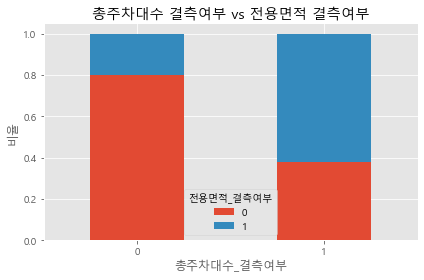

총주차대수 결측여부와 전용면적 결측여부의 카이제곱 검정 결과 chi2=398.68, p=0.0000


In [186]:
# 총주차대수 결측여부와의 관계

pd.crosstab(train_to_interpolate_area["총주차대수_결측여부"], train_to_interpolate_area["전용면적_결측여부"], normalize="index").plot(
    kind="bar", stacked=True, figsize=(6,4)
)
plt.title("총주차대수 결측여부 vs 전용면적 결측여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_area["총주차대수_결측여부"], train_to_interpolate_area["전용면적_결측여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"총주차대수 결측여부와 전용면적 결측여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

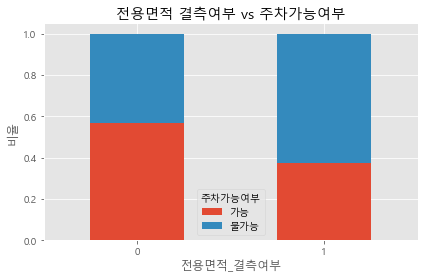

전용면적 결측여부와 주차가능여부의 카이제곱 검정 결과 chi2=80.23, p=0.0000


In [187]:
# 주차가능여부와의 관계

pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["주차가능여부"], normalize="index").plot(
    kind="bar", stacked=True, figsize=(6,4)
)
plt.title("전용면적 결측여부 vs 주차가능여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["주차가능여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"전용면적 결측여부와 주차가능여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

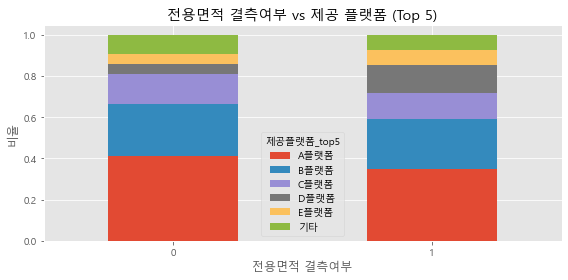

전용면적 결측여부와 상위5 제공플랫폼의 카이제곱 검정 결과 chi2=70.67, p=0.0000


In [188]:
# 제공플랫폼과의 관계

# 교차비율표
platform_ratio = pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["제공플랫폼_top5"], normalize="index")

# 시각화
platform_ratio.plot(kind="bar", stacked=True, figsize=(8, 4))
plt.title("전용면적 결측여부 vs 제공 플랫폼 (Top 5)")
plt.ylabel("비율")
plt.xlabel("전용면적 결측여부")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["제공플랫폼_top5"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"전용면적 결측여부와 상위5 제공플랫폼의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

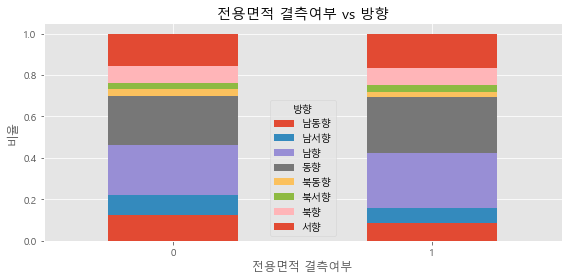

전용면적 결측여부와 방향의 카이제곱 검정 결과 chi2=16.17, p=0.0236


In [189]:
# 방향과의 관계

# 교차비율표
platform_ratio = pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["방향"], normalize="index")

# 시각화
platform_ratio.plot(kind="bar", stacked=True, figsize=(8, 4))
plt.title("전용면적 결측여부 vs 방향")
plt.ylabel("비율")
plt.xlabel("전용면적 결측여부")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["방향"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"전용면적 결측여부와 방향의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

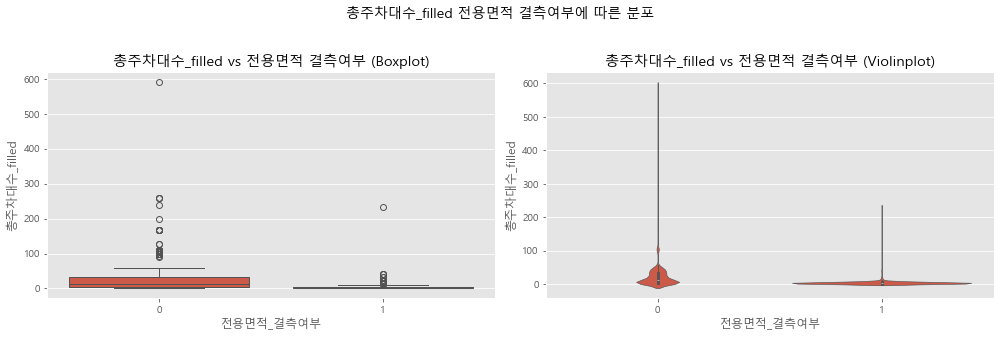

총주차대수_filled vs 전용면적 결측여부 → Mann-Whitney U test: stat = 1068007.0000, p = 0.0000


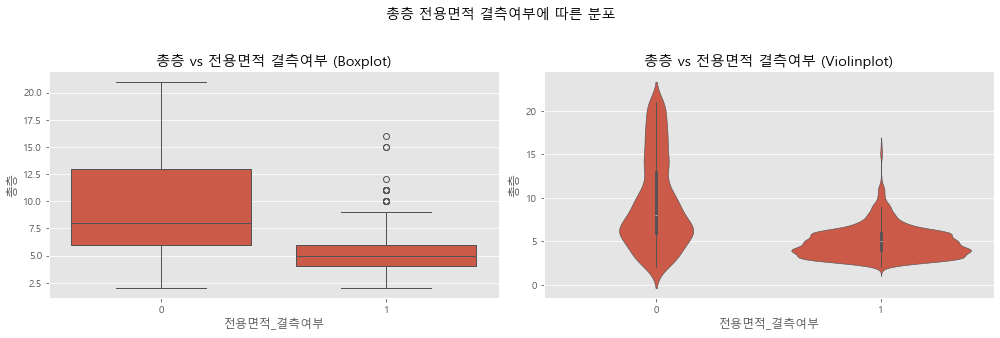

총층 vs 전용면적 결측여부 → Mann-Whitney U test: stat = 1004695.0000, p = 0.0000


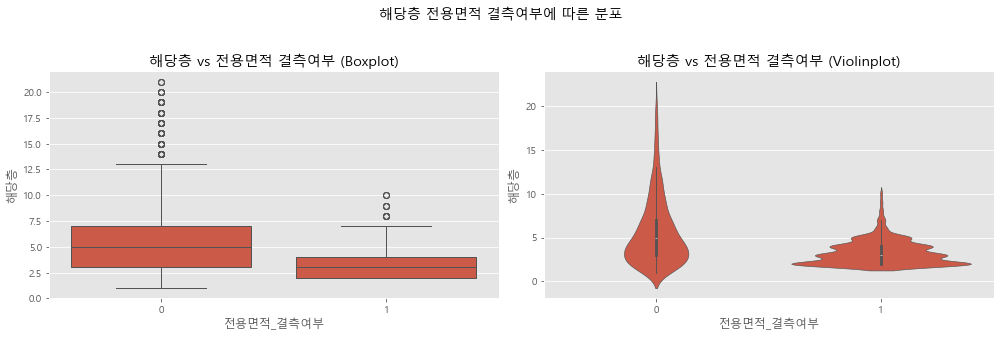

해당층 vs 전용면적 결측여부 → Mann-Whitney U test: stat = 901877.0000, p = 0.0000


In [190]:
# 분석 대상 연속형 피처 리스트
numeric_cols = ['총주차대수_filled', '총층', '해당층']

# 시각화 + 검정 반복
for col in numeric_cols:
    plt.figure(figsize=(14, 5))
    
    # 1. Boxplot
    plt.subplot(1, 2, 1)
    sns.boxplot(data=train_to_interpolate_area, x='전용면적_결측여부', y=col)
    plt.title(f"{col} vs 전용면적 결측여부 (Boxplot)")

    # 2. Violinplot
    plt.subplot(1, 2, 2)
    sns.violinplot(data=train_to_interpolate_area, x='전용면적_결측여부', y=col, inner='box')
    plt.title(f"{col} vs 전용면적 결측여부 (Violinplot)")

    plt.suptitle(f"{col} 전용면적 결측여부에 따른 분포", fontsize=14)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

    # 3. Mann-Whitney U 검정
    group1 = train_to_interpolate_area[train_to_interpolate_area['전용면적_결측여부'] == True][col].dropna()
    group0 = train_to_interpolate_area[train_to_interpolate_area['전용면적_결측여부'] == False][col].dropna()

    stat, p = mannwhitneyu(group0, group1, alternative='two-sided')
    print(f"{col} vs 전용면적 결측여부 → Mann-Whitney U test: stat = {stat:.4f}, p = {p:.4f}")

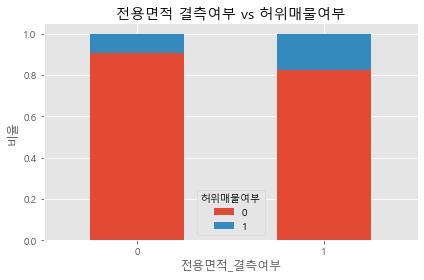

전용면적 결측여부와 허위매물여부의 카이제곱 검정 결과 chi2=32.19, p=0.0000


In [191]:
# 허위매물여부와의 관계

pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["허위매물여부"], normalize="index").plot(kind="bar", stacked=True, figsize=(6,4))
plt.title("전용면적 결측여부 vs 허위매물여부")
plt.ylabel("비율")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

contingency = pd.crosstab(train_to_interpolate_area["전용면적_결측여부"], train_to_interpolate_area["허위매물여부"])
chi2, p, _, _ = chi2_contingency(contingency)
print(f"전용면적 결측여부와 허위매물여부의 카이제곱 검정 결과 chi2={chi2:.2f}, p={p:.4f}")

전용면적 피처도 무작위로 발생한 것이 아니며, 전용면적 결측여부와 주차가능여부, 제공플랫폼, 해당층, 총층, 총주차대수 피처와 연관이 있는 모습이다. 총주차대수가 결측일때, 주차가능여부가 불가능일때, 제공 플랫폼이 D와 E일때의 전용면적이 결측인 비율이 상대적으로 높았다.

마찬가지로 전용면적 결측여부가 허위매물여부를 간접적으로 설명하는 단서로서 기능할 수 있을것이라 판단하였다.

#### (2) 연속형 피처와의 관계

In [192]:
train_to_interpolate_area.head()

,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,...,제공플랫폼,게재일,허위매물여부,제공플랫폼_top5,중개사무소_top5,년월,해당층_결측여부,총주차대수_결측여부,총주차대수_raw,전용면적_결측여부
0,현장확인,402500000.0,470000,NaN,9.0,15.0,서향,1.0,1.0,가능,...,B플랫폼,2024-10-09,0,B플랫폼,기타,2024-10,1,0,40.0,1
1,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,...,D플랫폼,2024-12-26,0,D플랫폼,기타,2024-12,0,1,NaN,1
2,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,...,A플랫폼,2024-11-28,0,A플랫폼,기타,2024-11,0,1,NaN,1
3,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,...,A플랫폼,2024-11-26,0,A플랫폼,G52Iz8V2B9,2024-11,0,0,13.0,0
4,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,...,B플랫폼,2024-06-25,1,B플랫폼,기타,2024-06,0,1,NaN,1


In [195]:
numerical_columns = train_to_interpolate_area.select_dtypes(include=['int','float']).columns


numerical_columns = numerical_columns.drop(['전용면적','방수','욕실수','허위매물여부','해당층_결측여부','총주차대수_결측여부', '총주차대수_raw', '전용면적_결측여부'])

numerical_columns

Index(['보증금', '월세', '해당층', '총층', '총주차대수_filled', '관리비'], dtype='object')

In [196]:
train_area_not_null = train_to_interpolate_area[~train_to_interpolate_area['전용면적'].isnull()]
train_area_null = train_to_interpolate_area[train_to_interpolate_area['전용면적'].isnull()]

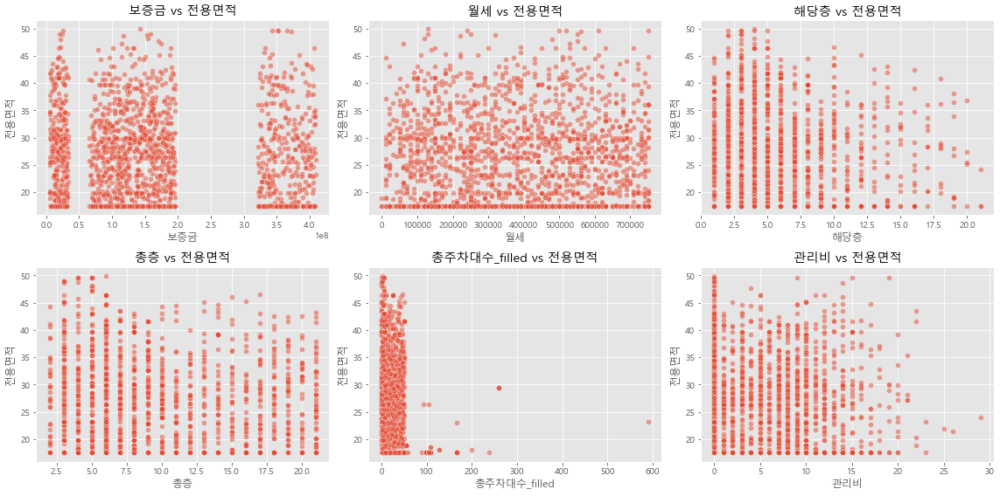

In [197]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.scatterplot(data=train_area_not_null, x=col, y='전용면적', ax=axes[i], alpha=0.5)
    axes[i].set_title(f"{col} vs 전용면적")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("전용면적")

plt.tight_layout()
plt.show()

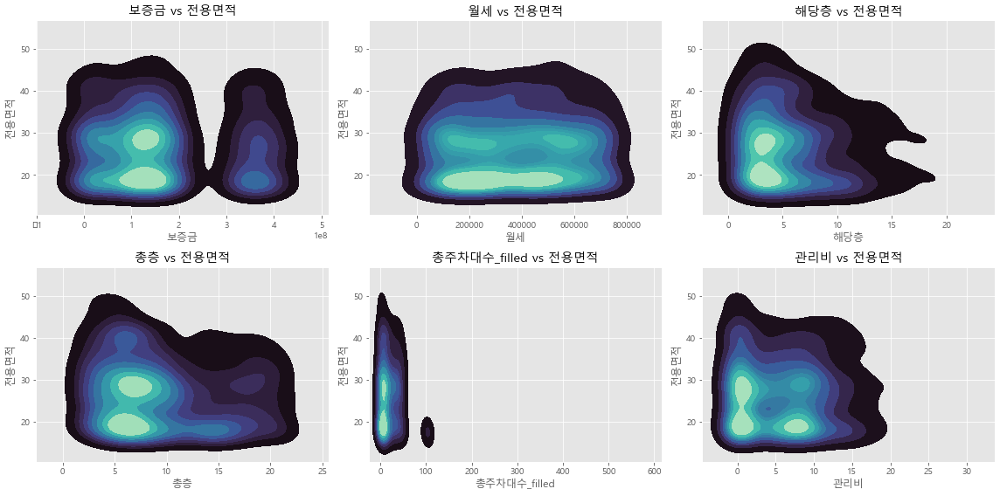

In [198]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.kdeplot(data=train_area_not_null, x=col, y='전용면적', fill=True, ax=axes[i], cmap='mako')
    axes[i].set_title(f"{col} vs 전용면적")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("전용면적")

plt.tight_layout()
plt.show()

In [199]:
correlations = {}

for col in numerical_columns:
    corr = train_area_not_null[[col, '전용면적']].corr(method='spearman').iloc[0,1]
    correlations[col] = corr

# 출력
for col, corr in correlations.items():
    print(f"Spearman correlation (전용면적 vs {col}): {corr:.4f}")

Spearman correlation (전용면적 vs 보증금): -0.0129
Spearman correlation (전용면적 vs 월세): 0.0103
Spearman correlation (전용면적 vs 해당층): -0.1314
Spearman correlation (전용면적 vs 총층): -0.1302
Spearman correlation (전용면적 vs 총주차대수_filled): -0.0620
Spearman correlation (전용면적 vs 관리비): -0.0645


연속형 변수들과의 관계를 확인해본 결과, 플랏을 통해서 피처간 관계를 확인하기 힘들었다. 또한 스피어만 상관관계를 통해 상관계수를 계산해 보았는데, 해당층과 총층이 0.13으로 그나마 큰 상관계수를 띄고 있다.

#### (3) 범주형 피처와의 관계

In [200]:
categorical_columns = train_area_not_null.select_dtypes(include=['object']).columns.tolist()

# 추가: 방수, 욕실수
categorical_columns += ['방수', '욕실수']

categorical_columns = [col for col in categorical_columns if col not in ['년월', '중개사무소','제공플랫폼']]

categorical_columns

['매물확인방식', '방향', '주차가능여부', '제공플랫폼_top5', '중개사무소_top5', '방수', '욕실수']

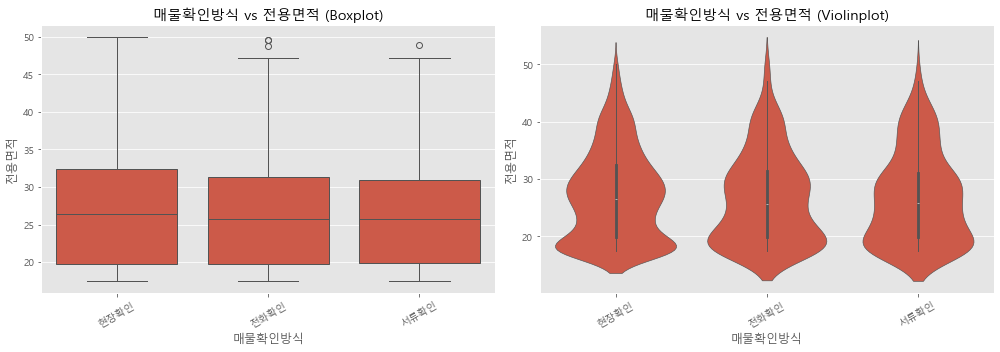

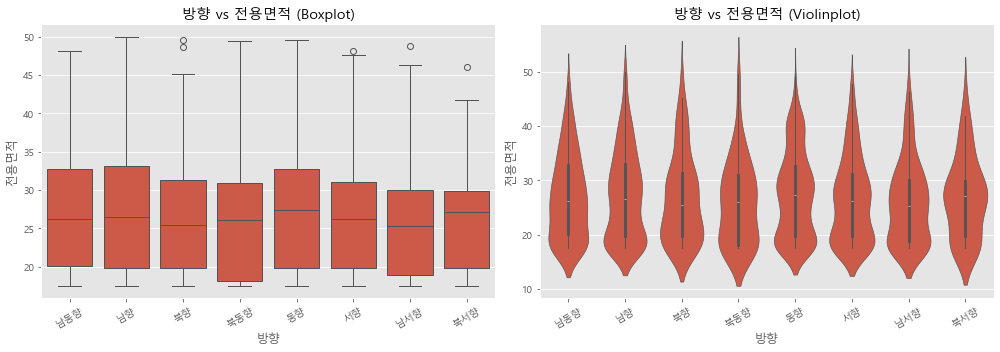

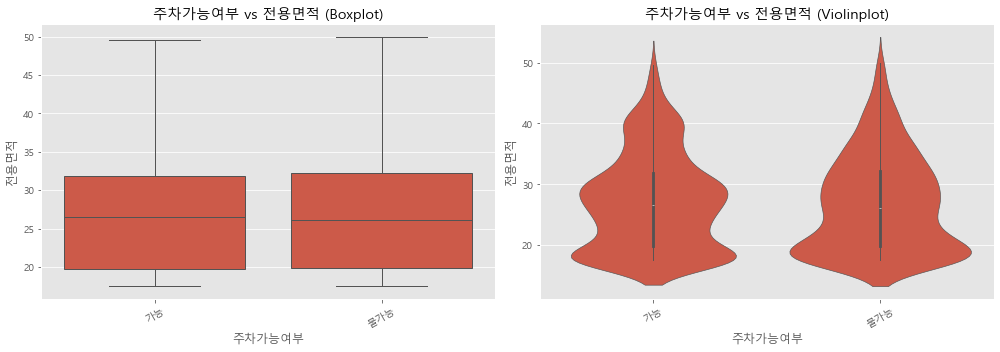

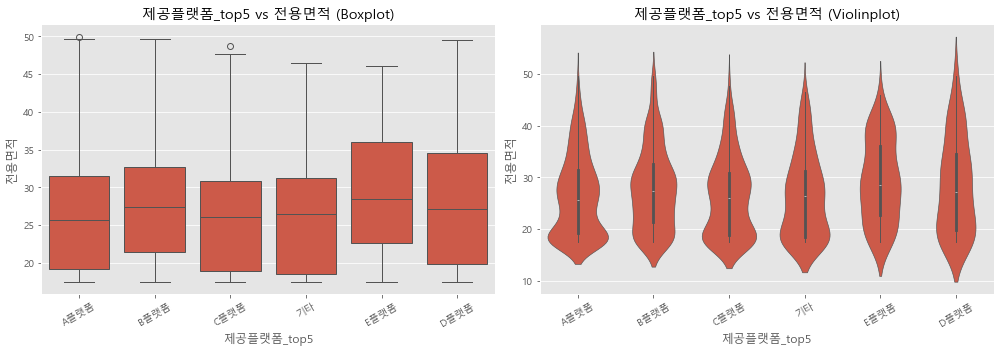

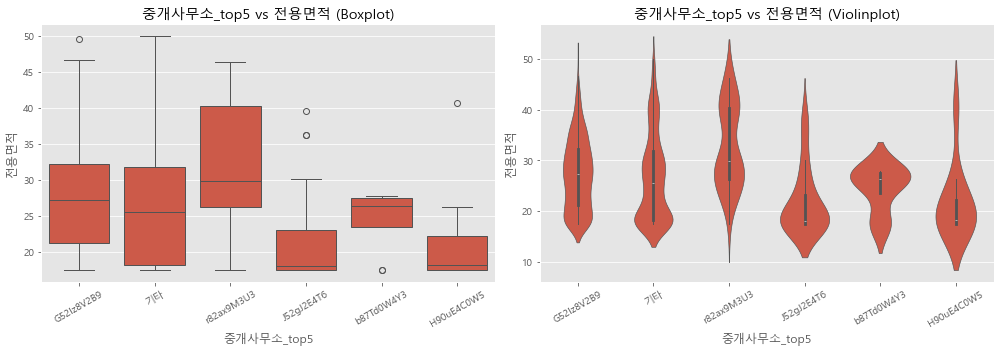

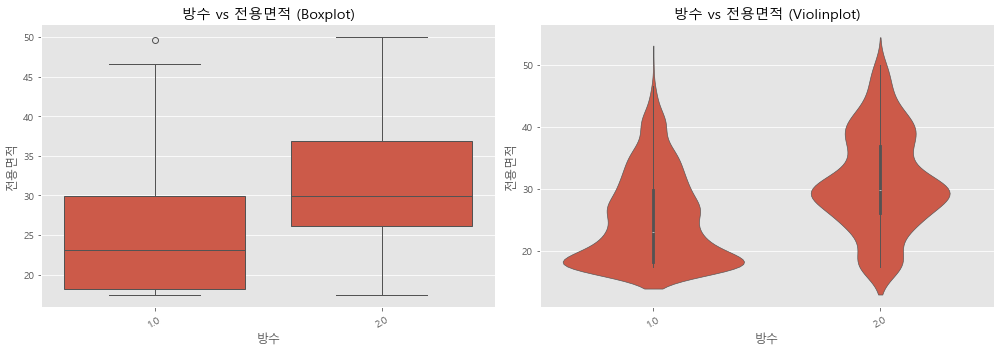

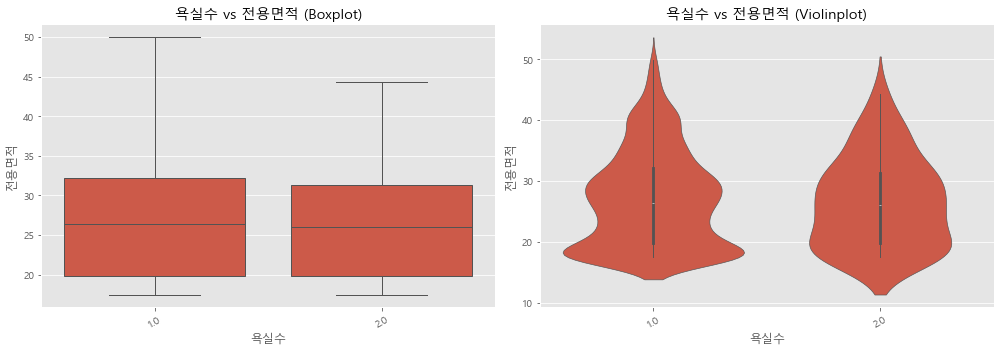

In [201]:
for col in categorical_columns:
    plt.figure(figsize=(14, 5))
    
    # 서브플롯 (1행 2열)
    plt.subplot(1, 2, 1)
    sns.boxplot(data=train_area_not_null, x=col, y='전용면적')
    plt.title(f"{col} vs 전용면적 (Boxplot)")
    plt.xticks(rotation=30)
    
    plt.subplot(1, 2, 2)
    sns.violinplot(data=train_area_not_null, x=col, y='전용면적', inner='box')
    plt.title(f"{col} vs 전용면적 (Violinplot)")
    plt.xticks(rotation=30)
    
    plt.tight_layout()
    plt.show()

In [202]:
for col in categorical_columns:
    categories = train_area_not_null[col].dropna().unique()
    
    # 그룹별 해당층 값 리스트 생성
    grouped = [
        train_area_not_null[train_area_not_null[col] == cat]['전용면적'].dropna().values
        for cat in categories
    ]
    
    if len(categories) == 2:
        stat, p = mannwhitneyu(grouped[0], grouped[1], alternative='two-sided')
        test_name = "Mann-Whitney U"
    else:
        stat, p = kruskal(*grouped)
        test_name = "Kruskal-Wallis H"
        
    print(f"{col} → {test_name} test | stat = {stat:.4f}, p = {p:.4f}")

매물확인방식 → Kruskal-Wallis H test | stat = 1.3165, p = 0.5177
방향 → Kruskal-Wallis H test | stat = 6.9523, p = 0.4339
주차가능여부 → Mann-Whitney U test | stat = 347996.5000, p = 0.4279
제공플랫폼_top5 → Kruskal-Wallis H test | stat = 22.9440, p = 0.0003
중개사무소_top5 → Kruskal-Wallis H test | stat = 52.0507, p = 0.0000
방수 → Mann-Whitney U test | stat = 430102.5000, p = 0.0000
욕실수 → Mann-Whitney U test | stat = 64439.0000, p = 0.7964


범주형 피처의 경우, 플랏의 형태와 검정 결과 모두 전용면적 피처와 독립적이라는 결과가 나온 매물확인방식, 방향, 주차가능여부, 욕실수 피처는 결측치 보간에서 제외하고 제공플랫폼, 중개사무소, 방수 세 피처를 결측치 보간에 활용한다.

#### (4) 시간적 변화

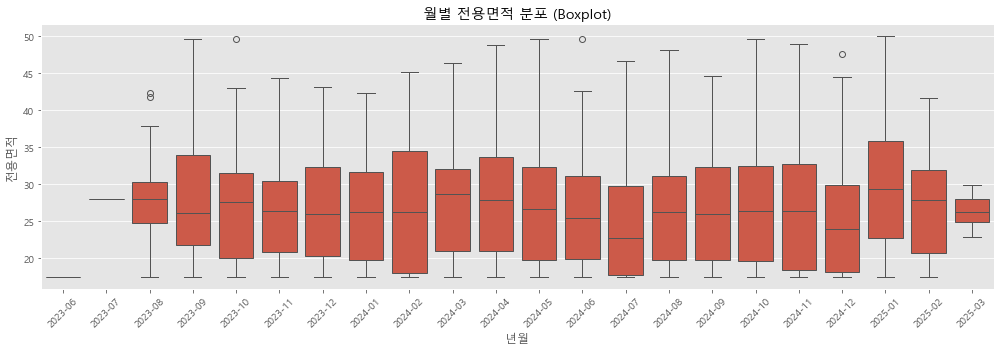

In [203]:
#  문자열을 시간순으로 정렬된 카테고리형으로 지정
sorted_months = sorted(train_area_not_null['년월'].unique())  # 시간순 정렬
train_area_not_null['년월'] = pd.Categorical(
    train_area_not_null['년월'],
    categories=sorted_months,
    ordered=True
)

plt.figure(figsize=(14, 5))
sns.boxplot(data=train_area_not_null, x='년월', y='전용면적')
plt.xticks(rotation=45)
plt.title("월별 전용면적 분포 (Boxplot)")
plt.tight_layout()
plt.show()

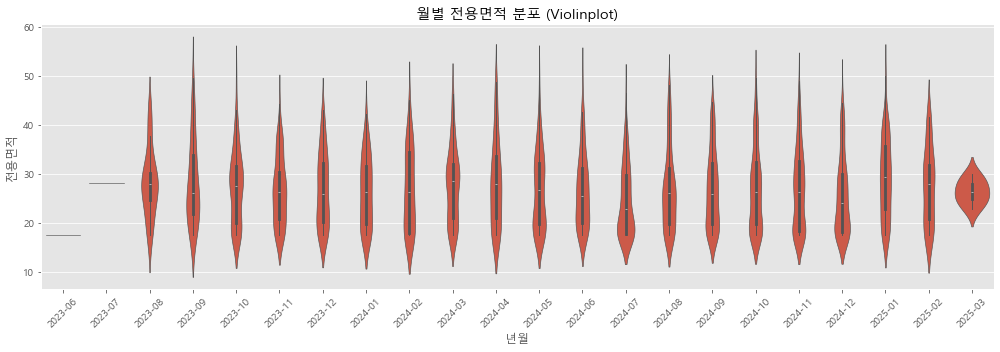

In [204]:
plt.figure(figsize=(14, 5))
sns.violinplot(data=train_area_not_null, x='년월', y='전용면적', inner='box')
plt.xticks(rotation=45)
plt.title("월별 전용면적 분포 (Violinplot)")
plt.tight_layout()
plt.show()

In [205]:
# Kruskal-Wallis 검정
grouped = [
    group["전용면적"].dropna().values
    for _, group in train_area_not_null.groupby("년월")
]

stat, p = kruskal(*grouped)

print(f"월별 전용면적의 분포 Kruskal-Wallis H test: stat = {stat:.4f}, p = {p:.4f}")

월별 전용면적의 분포 Kruskal-Wallis H test: stat = 25.8824, p = 0.2110


월별 전용면적 분포의 변화는 유의미하지 않은 결과로 나왔다. 따라서 결측치 보간에 년월 피처를 활용하지 않는다.

#### (5) 보간

보간에 활용할 피처가 범주형인 제공플랫폼, 중개사무소, 방수 세 피처이기 때문에 랜덤포레스트를 통한 예측 보다는 그룹화하여 중앙값으로 대치하는게 좋아보인다.  
오히려 랜덤포레스트가 왜곡을 유발할 가능성이 높음.

-> 단계별 fallback 보간 코드 사용

In [206]:
train_to_interpolate_area = train_interpolated_parking.copy()

train_to_interpolate_area['전용면적_결측여부'] = train_to_interpolate_area['전용면적'].isnull().astype(int)

In [207]:
# 0단계: 원본 전용면적 백업 → 전용면적_raw
train_to_interpolate_area["전용면적_raw"] = train_to_interpolate_area["전용면적"]

# 1단계: 3개 조합 중앙값
level_1 = train_to_interpolate_area.groupby(["제공플랫폼_top5", "중개사무소_top5", "방수"])["전용면적"].median().reset_index()
level_1 = level_1.rename(columns={"전용면적": "median_1"})

# 2단계: 2개 조합 중앙값
level_2 = train_to_interpolate_area.groupby(["중개사무소_top5", "방수"])["전용면적"].median().reset_index()
level_2 = level_2.rename(columns={"전용면적": "median_2"})

# 3단계: 단일 피처 중앙값
level_3 = train_to_interpolate_area.groupby(["방수"])["전용면적"].median().reset_index()
level_3 = level_3.rename(columns={"전용면적": "median_3"})

# 4단계: 전체 중앙값
overall_median = train_to_interpolate_area["전용면적"].median()

# 결측 대상 행 추출
mask = train_to_interpolate_area["전용면적"].isna()
fill_df = train_to_interpolate_area.loc[mask, ["제공플랫폼_top5", "중개사무소_top5", "방수"]].copy()

# 단계별 merge
fill_df = fill_df.merge(level_1, on=["제공플랫폼_top5", "중개사무소_top5", "방수"], how="left")
fill_df = fill_df.merge(level_2, on=["중개사무소_top5", "방수"], how="left")
fill_df = fill_df.merge(level_3, on=["방수"], how="left")

# 보간값 결정: 우선순위대로 채택
fill_df["전용면적_imputed"] = fill_df["median_1"].combine_first(
    fill_df["median_2"]).combine_first(
    fill_df["median_3"]).fillna(overall_median)

# 전용면적_filled 생성 및 보간값 반영
train_to_interpolate_area["전용면적_filled"] = train_to_interpolate_area["전용면적_raw"]
train_to_interpolate_area.loc[mask, "전용면적_filled"] = fill_df["전용면적_imputed"].values

In [208]:
train_to_interpolate_area['전용면적_filled'].isnull().sum()

0

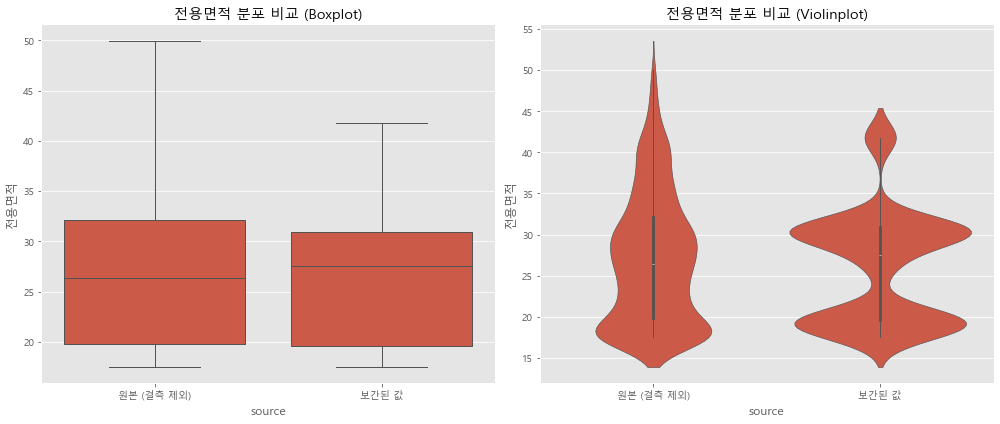

In [209]:
# 시각화용 데이터 생성
plot_df = pd.DataFrame({
    "전용면적": pd.concat([
        train_to_interpolate_area.loc[train_to_interpolate_area["전용면적_raw"].notna(), "전용면적_raw"],
        train_to_interpolate_area.loc[train_to_interpolate_area["전용면적_raw"].isna(), "전용면적_filled"]
    ]),
    "source": ["원본 (결측 제외)"] * train_to_interpolate_area["전용면적_raw"].notna().sum() +
              ["보간된 값"] * train_to_interpolate_area["전용면적_raw"].isna().sum()
})

# Boxplot & Violinplot
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(data=plot_df, x="source", y="전용면적")
plt.title("전용면적 분포 비교 (Boxplot)")

plt.subplot(1, 2, 2)
sns.violinplot(data=plot_df, x="source", y="전용면적", inner="box")
plt.title("전용면적 분포 비교 (Violinplot)")

plt.tight_layout()
plt.show()

In [210]:
# 두 집단 분리
original = train_to_interpolate_area.loc[train_to_interpolate_area["전용면적_raw"].notna(), "전용면적_raw"]
imputed = train_to_interpolate_area.loc[train_to_interpolate_area["전용면적_raw"].isna(), "전용면적_filled"]

# 검정
u_stat, p_value = mannwhitneyu(original, imputed, alternative='two-sided')

print(f"Mann-Whitney U 검정 결과: U-statistic = {u_stat:.2f}, p-value = {p_value:.5f}")

Mann-Whitney U 검정 결과: U-statistic = 655349.50, p-value = 0.99163


In [211]:
# 1. 결측 여부 마스크 생성
is_na = train_to_interpolate_area["전용면적_raw"].isna()
is_notna = ~is_na

# 2. 그룹핑 기준
group_cols = ["제공플랫폼_top5", "중개사무소_top5", "방수"]

# 3. 각 그룹에서 결측/비결측 행 개수 계산
na_group_counts = (
    train_to_interpolate_area[is_na]
    .groupby(group_cols)
    .size()
    .reset_index(name="결측_매물수")
)

notna_group_counts = (
    train_to_interpolate_area[is_notna]
    .groupby(group_cols)
    .size()
    .reset_index(name="비결측_매물수")
)

# 4. 결합 (inner가 아닌 outer로 모든 조합 포함)
group_comp = pd.merge(na_group_counts, notna_group_counts, on=group_cols, how="outer").fillna(0)

# 5. 전체 결측/비결측 수
total_na = is_na.sum()
total_notna = is_notna.sum()

# 6. 비율 계산
group_comp["결측_비율"] = group_comp["결측_매물수"] / total_na
group_comp["비결측_비율"] = group_comp["비결측_매물수"] / total_notna
group_comp["비율차이"] = group_comp["결측_비율"] - group_comp["비결측_비율"]

# 7. 정렬 (차이가 큰 순으로)
group_comp_sorted = group_comp.sort_values("비율차이", ascending=False).reset_index(drop=True)

# 결과 확인
group_comp_sorted 


,제공플랫폼_top5,중개사무소_top5,방수,결측_매물수,비결측_매물수,결측_비율,비결측_비율,비율차이
0,A플랫폼,기타,2.0,144.0,145,0.182973,0.087087,0.095886
1,B플랫폼,기타,1.0,100.0,80,0.127065,0.048048,0.079017
2,B플랫폼,기타,2.0,92.0,86,0.116900,0.051652,0.065248
3,D플랫폼,기타,2.0,57.0,17,0.072427,0.010210,0.062217
4,D플랫폼,기타,1.0,36.0,11,0.045743,0.006607,0.039137
5,E플랫폼,기타,2.0,32.0,19,0.040661,0.011411,0.029249
6,E플랫폼,기타,1.0,27.0,18,0.034307,0.010811,0.023497
7,기타,기타,2.0,30.0,29,0.038119,0.017417,0.020702
8,C플랫폼,기타,2.0,30.0,31,0.038119,0.018619,0.019501
9,C플랫폼,기타,1.0,45.0,68,0.057179,0.040841,0.016338


In [212]:
# 0단계: 원본 전용면적 백업 → 전용면적_raw
train_to_interpolate_area["전용면적_raw"] = train_to_interpolate_area["전용면적"]

# 기준 조합 컬럼
group_cols = ["제공플랫폼_top5", "중개사무소_top5", "방수"]

# 결측 여부 마스크
mask_na = train_to_interpolate_area["전용면적"].isna()
mask_notna = ~mask_na

# 1단계 보간용 조합의 결측/비결측 수 계산
group_count = (
    train_to_interpolate_area
    .groupby(group_cols)["전용면적"]
    .agg(결측_매물수=lambda x: x.isna().sum(),
         비결측_매물수=lambda x: x.notna().sum())
    .reset_index()
)

# 비율 계산
group_count["총합"] = group_count["결측_매물수"] + group_count["비결측_매물수"]
group_count["결측_비율"] = group_count["결측_매물수"] / group_count["총합"]

# 조건 적용: 비결측 수 ≥ 10 & 결측 비율 ≤ 0.6
valid_group_mask = (group_count["비결측_매물수"] >= 10) & (group_count["결측_비율"] <= 0.6)
valid_groups = group_count.loc[valid_group_mask, group_cols]

# 유효 그룹만으로 level_1 중앙값 계산
valid_data = pd.merge(
    train_to_interpolate_area[train_to_interpolate_area["전용면적"].notna()],
    valid_groups,
    on=group_cols,
    how="inner"
)

level_1 = (
    valid_data
    .groupby(group_cols)["전용면적"]
    .median()
    .reset_index()
    .rename(columns={"전용면적": "median_1"})
)

# 2단계: 중개사무소_top5 + 방수 중앙값
level_2 = (
    train_to_interpolate_area
    .groupby(["중개사무소_top5", "방수"])["전용면적"]
    .median()
    .reset_index()
    .rename(columns={"전용면적": "median_2"})
)

# 3단계: 방수 중앙값
level_3 = (
    train_to_interpolate_area
    .groupby(["방수"])["전용면적"]
    .median()
    .reset_index()
    .rename(columns={"전용면적": "median_3"})
)

# 4단계: 전체 중앙값
overall_median = train_to_interpolate_area["전용면적"].median()

# 결측 대상 추출
mask = train_to_interpolate_area["전용면적"].isna()
fill_df = train_to_interpolate_area.loc[mask, group_cols].copy()

# 단계별 중앙값 merge
fill_df = fill_df.merge(level_1, on=group_cols, how="left")
fill_df = fill_df.merge(level_2, on=["중개사무소_top5", "방수"], how="left")
fill_df = fill_df.merge(level_3, on=["방수"], how="left")

# 최종 보간값 결정
fill_df["전용면적_imputed"] = fill_df["median_1"].combine_first(
    fill_df["median_2"]
).combine_first(
    fill_df["median_3"]
).fillna(overall_median)

# 보간 반영
train_to_interpolate_area["전용면적_filled"] = train_to_interpolate_area["전용면적_raw"]
train_to_interpolate_area.loc[mask, "전용면적_filled"] = fill_df["전용면적_imputed"].values

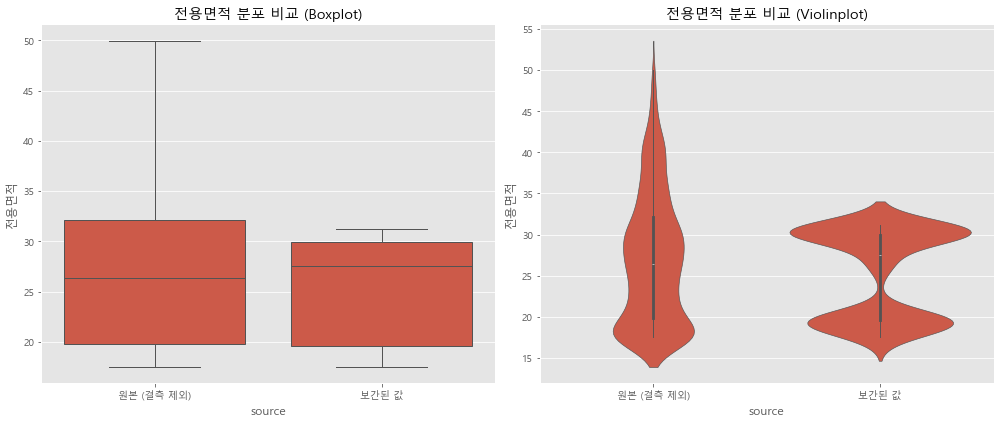

In [213]:
# 시각화용 데이터 생성
plot_df = pd.DataFrame({
    "전용면적": pd.concat([
        train_to_interpolate_area.loc[train_to_interpolate_area["전용면적_raw"].notna(), "전용면적_raw"],
        train_to_interpolate_area.loc[train_to_interpolate_area["전용면적_raw"].isna(), "전용면적_filled"]
    ]),
    "source": ["원본 (결측 제외)"] * train_to_interpolate_area["전용면적_raw"].notna().sum() +
              ["보간된 값"] * train_to_interpolate_area["전용면적_raw"].isna().sum()
})

# Boxplot & Violinplot
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(data=plot_df, x="source", y="전용면적")
plt.title("전용면적 분포 비교 (Boxplot)")

plt.subplot(1, 2, 2)
sns.violinplot(data=plot_df, x="source", y="전용면적", inner="box")
plt.title("전용면적 분포 비교 (Violinplot)")

plt.tight_layout()
plt.show()

전용면적 피처의 결측치를 그룹화하여 보간한 결과, 데이터의 분포가 왜곡되는 경향을 많이 보인다. 이는 특정 그룹이 전체 데이터에 대해서 지배적인 매물수를 갖고, 특정 그룹에서는 결측치인 매물이 결측이 아닌 매물보다 훨씬 더 많기 떄문에 이러한 분포의 왜곡이 나오게 된 것 같다. 따라서 결측을 보간하지 않는 것이 더 유용하게 사용될 여지가 있기 때문에, 총주차대수에서와 마찬가지로 결측을 보간하기 전의 피처와 보간한 후의 피처, 그리고 결측치 여부 피처를 모두 사용하는 것이 좋아 보인다.

In [214]:
train_to_interpolate_area.columns.tolist()

['매물확인방식',
 '보증금',
 '월세',
 '전용면적',
 '해당층',
 '총층',
 '방향',
 '방수',
 '욕실수',
 '주차가능여부',
 '총주차대수_filled',
 '관리비',
 '중개사무소',
 '제공플랫폼',
 '게재일',
 '허위매물여부',
 '제공플랫폼_top5',
 '중개사무소_top5',
 '년월',
 '해당층_결측여부',
 '총주차대수_결측여부',
 '총주차대수_raw',
 '전용면적_결측여부',
 '전용면적_raw',
 '전용면적_filled']

In [215]:
train_interpolated = (train_to_interpolate_area.drop(columns=['전용면적'])).copy()

일차적으로 결측치를 모두 보간하였다.

# 이상치 처리 - 변환

## 1) 보증금, 월세 단위 변환

보증금은 억단위, 월세는 만,십만 단위이므로 단위 변환

In [216]:
train_interpolated[['보증금','월세']].describe()

,보증금,월세
count,2.452000e+03,2452.000000
mean,1.574188e+08,380420.065253
std,1.212794e+08,206425.413601
min,5.000000e+06,0.000000
25%,7.500000e+07,200000.000000
50%,1.325000e+08,380000.000000
75%,1.890000e+08,550000.000000
max,4.090000e+08,750000.000000


In [217]:
train_interpolated['보증금(억)'] = train_interpolated['보증금']/100000000
train_interpolated['월세(만)'] = train_interpolated['월세']/10000

train_interpolated = train_interpolated.drop(columns=['월세','보증금'])

## 2) 분포, 왜도 시각화 및 이상치 탐지

In [218]:
numerical_columns = train_interpolated.select_dtypes(include=['int','float']).columns

numerical_columns = numerical_columns.drop(['전용면적_결측여부','총주차대수_결측여부','해당층_결측여부','허위매물여부','전용면적_raw','전용면적_filled','총주차대수_filled','총주차대수_raw'])

In [219]:
numerical_columns_area = ['전용면적_raw','전용면적_filled']
numerical_columns_parking=['총주차대수_filled','총주차대수_raw']

전용면적과 총주차대수는 보간한 피처와 보간하기 전 피처를 모두 유지한 상태에서 보간으로 인해 발생한 이상치까지 같이 탐지하기 위해서 따로 리스트 생성.

In [220]:
# 퀀타일 함수와 IQR 계산 함수

def out_iqr(df, column):

    q25, q75 = np.quantile(df[column], 0.25), np.quantile(df[column], 0.75)
    iqr = q75 - q25
    lower, upper = q25 - (iqr * 1.5), q75 + (iqr * 1.5)

    df1 = df[df[column] > upper]
    df2 = df[df[column] < lower]
    total_outliers = df1.shape[0] + df2.shape[0]

    return iqr, lower, upper, total_outliers

IQR을 통한 이상치 탐지결과 해당층 피처의 iqr값은 4.0, 하한값은 -4.0, 상한값은 12.0, 이상치의 갯수는 107입니다.
IQR을 통한 이상치 탐지결과 총층 피처의 iqr값은 6.0, 하한값은 -5.0, 상한값은 19.0, 이상치의 갯수는 95입니다.
IQR을 통한 이상치 탐지결과 방수 피처의 iqr값은 1.0, 하한값은 -0.5, 상한값은 3.5, 이상치의 갯수는 0입니다.
IQR을 통한 이상치 탐지결과 욕실수 피처의 iqr값은 0.0, 하한값은 1.0, 상한값은 1.0, 이상치의 갯수는 84입니다.
IQR을 통한 이상치 탐지결과 관리비 피처의 iqr값은 9.0, 하한값은 -13.5, 상한값은 22.5, 이상치의 갯수는 7입니다.
IQR을 통한 이상치 탐지결과 보증금(억) 피처의 iqr값은 1.14, 하한값은 -0.96, 상한값은 3.5999999999999996, 이상치의 갯수는 282입니다.
IQR을 통한 이상치 탐지결과 월세(만) 피처의 iqr값은 35.0, 하한값은 -32.5, 상한값은 107.5, 이상치의 갯수는 0입니다.


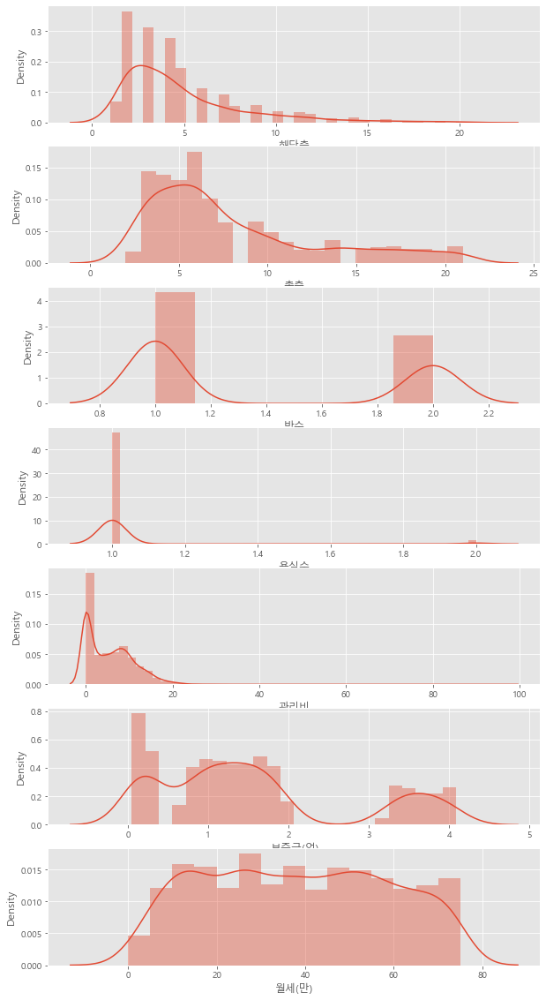

In [221]:
fig, axes = plt.subplots(len(numerical_columns),1, figsize=(10, 20))

for i, col in enumerate(numerical_columns):
    
    train_interpolated = train_interpolated.dropna(subset=[col])
    
    iqr_original, lower_original, upper_original, total_outliers_original = out_iqr(train_interpolated, col)
    sns.distplot(train_interpolated[col], kde=True, ax=axes[i])
    
    print(f'IQR을 통한 이상치 탐지결과 {col} 피처의 iqr값은 {iqr_original}, 하한값은 {lower_original}, 상한값은 {upper_original}, 이상치의 갯수는 {total_outliers_original}입니다.')
    
plt.show()

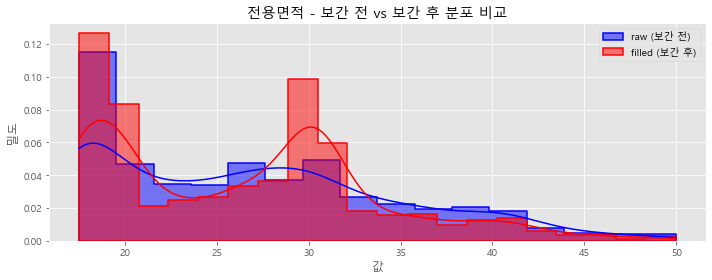

[전용면적_raw] IQR 이상치 탐지 결과 → IQR: 12.30, 하한: 1.35, 상한: 50.56, 이상치 수: 0개
[전용면적_filled] IQR 이상치 탐지 결과 → IQR: 11.18, 하한: 3.03, 상한: 47.75, 이상치 수: 14개



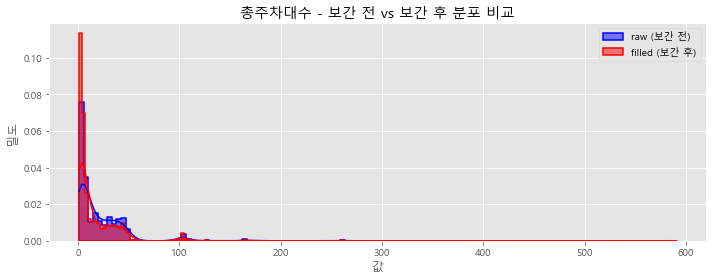

[총주차대수_raw] IQR 이상치 탐지 결과 → IQR: 27.75, 하한: -37.62, 상한: 73.38, 이상치 수: 60개
[총주차대수_filled] IQR 이상치 탐지 결과 → IQR: 20.00, 하한: -28.00, 상한: 52.00, 이상치 수: 72개



In [222]:
# 비교 대상: (raw, filled) 컬럼 쌍
combined_columns = [
    ("전용면적_raw", "전용면적_filled"),
    ("총주차대수_raw", "총주차대수_filled")
]

for raw_col, filled_col in combined_columns:
    plt.figure(figsize=(10, 4))
    
    # raw: 결측 제외
    raw_data = train_interpolated[raw_col].dropna()
    iqr_raw, lower_raw, upper_raw, outliers_raw = out_iqr(train_interpolated.dropna(subset=[raw_col]), raw_col)
    
    # filled: 전체
    filled_data = train_interpolated[filled_col]
    iqr_filled, lower_filled, upper_filled, outliers_filled = out_iqr(train_interpolated, filled_col)

    # 시각화
    sns.histplot(raw_data, color='blue', kde=True, label='raw (보간 전)', stat="density", element="step", linewidth=1.5)
    sns.histplot(filled_data, color='red', kde=True, label='filled (보간 후)', stat="density", element="step", linewidth=1.5)

    plt.title(f"{raw_col.replace('_raw','')} - 보간 전 vs 보간 후 분포 비교")
    plt.xlabel("값")
    plt.ylabel("밀도")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 이상치 탐지 결과 출력
    print(f"[{raw_col}] IQR 이상치 탐지 결과 → IQR: {iqr_raw:.2f}, 하한: {lower_raw:.2f}, 상한: {upper_raw:.2f}, 이상치 수: {outliers_raw}개")
    print(f"[{filled_col}] IQR 이상치 탐지 결과 → IQR: {iqr_filled:.2f}, 하한: {lower_filled:.2f}, 상한: {upper_filled:.2f}, 이상치 수: {outliers_filled}개\n")

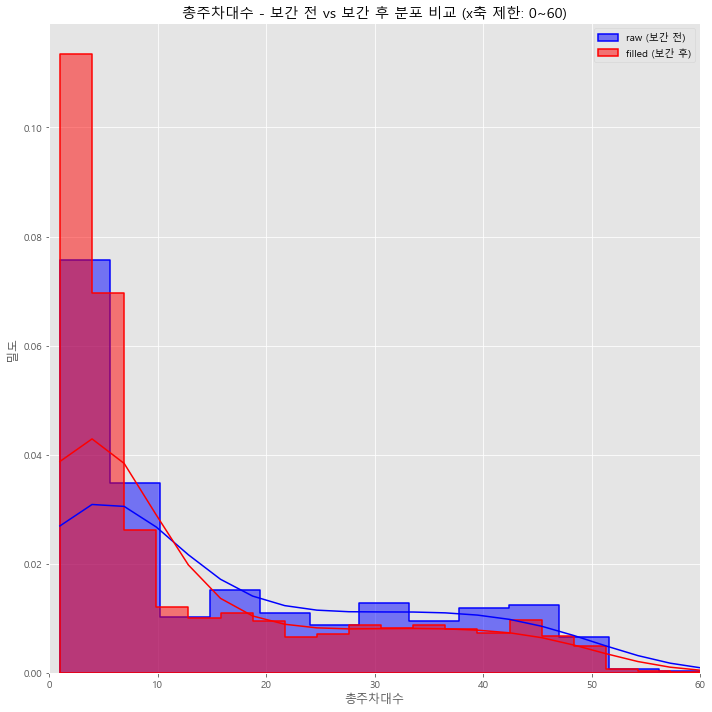

In [223]:
plt.figure(figsize=(10, 10))

# raw: 결측 제외
raw_data = train_interpolated["총주차대수_raw"].dropna()

# filled: 전체
filled_data = train_interpolated["총주차대수_filled"]

# 시각화 (x축 제한)
sns.histplot(raw_data, color='blue', kde=True, label='raw (보간 전)', stat="density", element="step", linewidth=1.5)
sns.histplot(filled_data, color='red', kde=True, label='filled (보간 후)', stat="density", element="step", linewidth=1.5)

plt.title("총주차대수 - 보간 전 vs 보간 후 분포 비교 (x축 제한: 0~60)")
plt.xlabel("총주차대수")
plt.ylabel("밀도")
plt.xlim(0, 60)
plt.legend()
plt.tight_layout()
plt.show()

일반 연속형 피처

보증금 피처의 IQR 값은 114000000.0, 하한값은 -96000000.0, 상한값은 360000000.0, 이상치 수는 279개입니다.  
월세 피처의 IQR 값은 350000.0, 하한값은 -325000.0, 상한값은 1075000.0, 이상치 수는 0개입니다.   
해당층 피처의 IQR 값은 4.0, 하한값은 -4.0, 상한값은 12.0, 이상치 수는 107개입니다.  
총층 피처의 IQR 값은 6.0, 하한값은 -5.0, 상한값은 19.0, 이상치 수는 95개입니다.  
방수 피처의 IQR 값은 1.0, 하한값은 -0.5, 상한값은 3.5, 이상치 수는 0개입니다.  
욕실수 피처의 IQR 값은 0.0, 하한값은 1.0, 상한값은 1.0, 이상치 수는 84개입니다.  
관리비 피처의 IQR 값은 9.0, 하한값은 -13.5, 상한값은 22.5, 이상치 수는 7개입니다.  

보간 피처 (raw vs filled)

전용면적_raw 피처의 IQR 값은 12.30, 하한값은 1.35, 상한값은 50.56, 이상치 수는 0개입니다.  
전용면적_filled 피처의 IQR 값은 11.18, 하한값은 3.03, 상한값은 47.75, 이상치 수는 14개입니다.  
총주차대수_raw 피처의 IQR 값은 27.75, 하한값은 -37.62, 상한값은 73.38, 이상치 수는 60개입니다.  
총주차대수_filled 피처의 IQR 값은 20.00, 하한값은 -28.00, 상한값은 52.00, 이상치 수는 72개입니다.



전용면적 피처의 경우 0과 30 근처에서 밀도가 커지는 경향성을 띈다. 분포의 형태가 많이 왜곡되었으며 이상치의 수도 증가하였다.  
총주차대수의 경우 0 근처에서 밀도가 커지면서 다른 부분들의 밀도가 작아지는 경향성을 띈다. 전용면적에 비해서는 왜곡이 크지 않지만 마찬가지로 이상치가 증가하였다.

In [224]:
# 수치형 변수에서 결측 여부, 보간 관련, 타겟 제외
numerical_columns_for_skew = train_interpolated.select_dtypes(include=['int', 'float']).columns
numerical_columns_for_skew = numerical_columns_for_skew.drop(['방수','욕실수','허위매물여부','전용면적_결측여부', '총주차대수_결측여부', '해당층_결측여부'])

# 왜도 계산
skew_results = {}
for col in numerical_columns_for_skew:
    skew_val = train_interpolated[col].dropna().skew()
    skew_results[col] = round(skew_val, 4)

# 정렬된 출력
for col, skew_val in sorted(skew_results.items(), key=lambda x: abs(x[1]), reverse=True):
    print(f"이상치 제거 전 {col} 피처의 왜도 값: {skew_val}")

이상치 제거 전 총주차대수_filled 피처의 왜도 값: 7.2215
이상치 제거 전 총주차대수_raw 피처의 왜도 값: 6.8216
이상치 제거 전 관리비 피처의 왜도 값: 2.4346
이상치 제거 전 해당층 피처의 왜도 값: 1.7359
이상치 제거 전 총층 피처의 왜도 값: 1.1214
이상치 제거 전 보증금(억) 피처의 왜도 값: 0.7569
이상치 제거 전 전용면적_raw 피처의 왜도 값: 0.5839
이상치 제거 전 전용면적_filled 피처의 왜도 값: 0.58
이상치 제거 전 월세(만) 피처의 왜도 값: 0.0536


강한 왜도로 인해 변환이 필요한 피처 : 총주차대수, 관리비, 해당층, 총층  
약한 왜도로 인해 변환을 고려해야 할 피처 : 보증금, 전용면적  
월세의 경우 대칭적이므로 변환이 필요하지 않다.

## 2) 이상치 제거

In [225]:
# 이상치 제거 대상 피처 리스트
iqr_columns = ["총주차대수_filled","총주차대수_raw","해당층","총층","보증금(억)","전용면적_raw","전용면적_filled","월세(만)"]

# 복사본 생성 (원본 유지)
train_iqr_removed = train_interpolated.copy()

# 각 피처에 대해 IQR 기반 이상치 제거
for col in iqr_columns:
    # 결측치 제거 후 IQR 계산
    iqr, lower, upper, out_count = out_iqr(train_iqr_removed.dropna(subset=[col]), col)

    # 이상치 제거 적용
    before_shape = train_iqr_removed.shape[0]
    train_iqr_removed = train_iqr_removed[
        (train_iqr_removed[col].isna()) |  # 결측치는 유지
        ((train_iqr_removed[col] >= lower) & (train_iqr_removed[col] <= upper))
    ]
    after_shape = train_iqr_removed.shape[0]
    
    print(f"{col} 이상치 제거 완료 → 제거된 행 수: {before_shape - after_shape}개 (전체에서 {out_count}개 탐지됨)")

총주차대수_filled 이상치 제거 완료 → 제거된 행 수: 72개 (전체에서 72개 탐지됨)
총주차대수_raw 이상치 제거 완료 → 제거된 행 수: 0개 (전체에서 0개 탐지됨)
해당층 이상치 제거 완료 → 제거된 행 수: 93개 (전체에서 93개 탐지됨)
총층 이상치 제거 완료 → 제거된 행 수: 151개 (전체에서 151개 탐지됨)
보증금(억) 이상치 제거 완료 → 제거된 행 수: 247개 (전체에서 247개 탐지됨)
전용면적_raw 이상치 제거 완료 → 제거된 행 수: 0개 (전체에서 0개 탐지됨)
전용면적_filled 이상치 제거 완료 → 제거된 행 수: 12개 (전체에서 12개 탐지됨)
월세(만) 이상치 제거 완료 → 제거된 행 수: 0개 (전체에서 0개 탐지됨)


In [226]:
# 왜도 계산
skew_results = {}
for col in numerical_columns_for_skew:
    skew_val = train_iqr_removed[col].dropna().skew()
    skew_results[col] = round(skew_val, 4)

# 정렬된 출력
for col, skew_val in sorted(skew_results.items(), key=lambda x: abs(x[1]), reverse=True):
    print(f"이상치 제거 후 {col} 피처의 왜도 값: {skew_val}")

이상치 제거 후 총주차대수_filled 피처의 왜도 값: 1.5268
이상치 제거 후 해당층 피처의 왜도 값: 1.2252
이상치 제거 후 총층 피처의 왜도 값: 1.028
이상치 제거 후 총주차대수_raw 피처의 왜도 값: 0.9957
이상치 제거 후 관리비 피처의 왜도 값: 0.9691
이상치 제거 후 보증금(억) 피처의 왜도 값: 0.9283
이상치 제거 후 전용면적_raw 피처의 왜도 값: 0.4861
이상치 제거 후 전용면적_filled 피처의 왜도 값: 0.4781
이상치 제거 후 월세(만) 피처의 왜도 값: 0.0386


이상치를 제거한 후  
보증금, 월제, 전용면적은 변환이 필요하지 않을 정도오 대칭에 가까운 형태를 이루게 되었다.  
총주차대수와 총층, 해당층은 변환이 필요하다.  
관리비의 경우 변환시 안정적으로 될 수 있기에 고려해 봐야 한다.

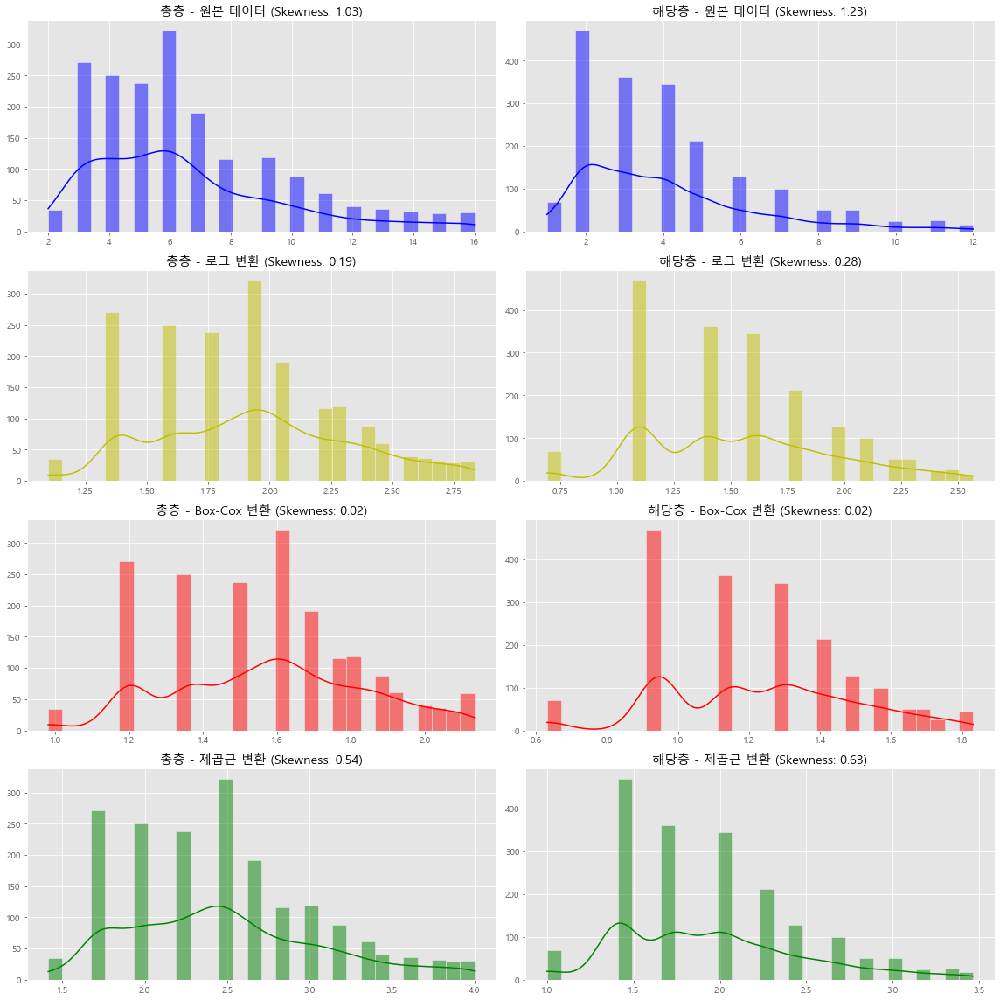

In [227]:
from scipy import stats

# 해당층, 총층
transformations = ["원본 데이터", "로그 변환", "Box-Cox 변환", "제곱근 변환"]
check_columns = ['총층', '해당층']
colors = ['b', 'y', 'r', 'g']

fig, axes = plt.subplots(4, 2, figsize=(16,16))

for i, col in enumerate(check_columns):
    # 결측 제거
    data_col = train_iqr_removed[col].dropna()

    # 변환들
    log_data = np.log1p(data_col)
    boxcox_data = pd.Series(stats.boxcox(data_col + 1)[0])
    sqrt_data = np.sqrt(data_col)
    data_list = [data_col, log_data, boxcox_data, sqrt_data]

    # 시각화
    for j, data in enumerate(data_list):
        sns.histplot(data, kde=True, ax=axes[j,i], color=colors[j], bins=30)
        axes[j, i].set_title(f"{col} - {transformations[j]} (Skewness: {data.skew():.2f})")
        axes[j, i].set_xlabel('')
        axes[j, i].set_ylabel('')

plt.tight_layout()
plt.show()

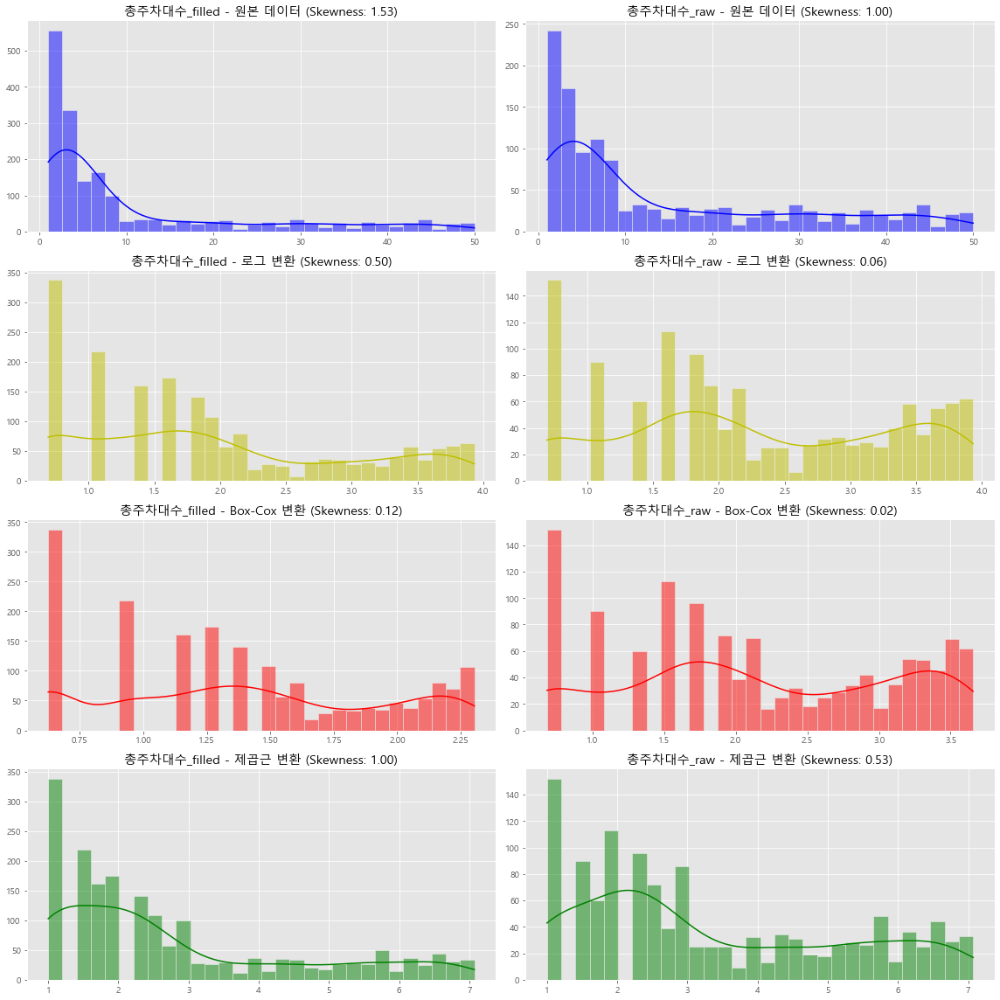

In [228]:
# 총주차대수
transformations = ["원본 데이터", "로그 변환", "Box-Cox 변환", "제곱근 변환"]
check_columns = ['총주차대수_filled', '총주차대수_raw']
colors = ['b', 'y', 'r', 'g']

fig, axes = plt.subplots(4, 2, figsize=(16,16))

for i, col in enumerate(check_columns):
    # 결측 제거
    data_col = train_iqr_removed[col].dropna()

    # 변환들
    log_data = np.log1p(data_col)
    boxcox_data = pd.Series(stats.boxcox(data_col + 1)[0])
    sqrt_data = np.sqrt(data_col)
    data_list = [data_col, log_data, boxcox_data, sqrt_data]

    # 시각화
    for j, data in enumerate(data_list):
        sns.histplot(data, kde=True, ax=axes[j,i], color=colors[j], bins=30)
        axes[j, i].set_title(f"{col} - {transformations[j]} (Skewness: {data.skew():.2f})")
        axes[j, i].set_xlabel('')
        axes[j, i].set_ylabel('')

plt.tight_layout()
plt.show()

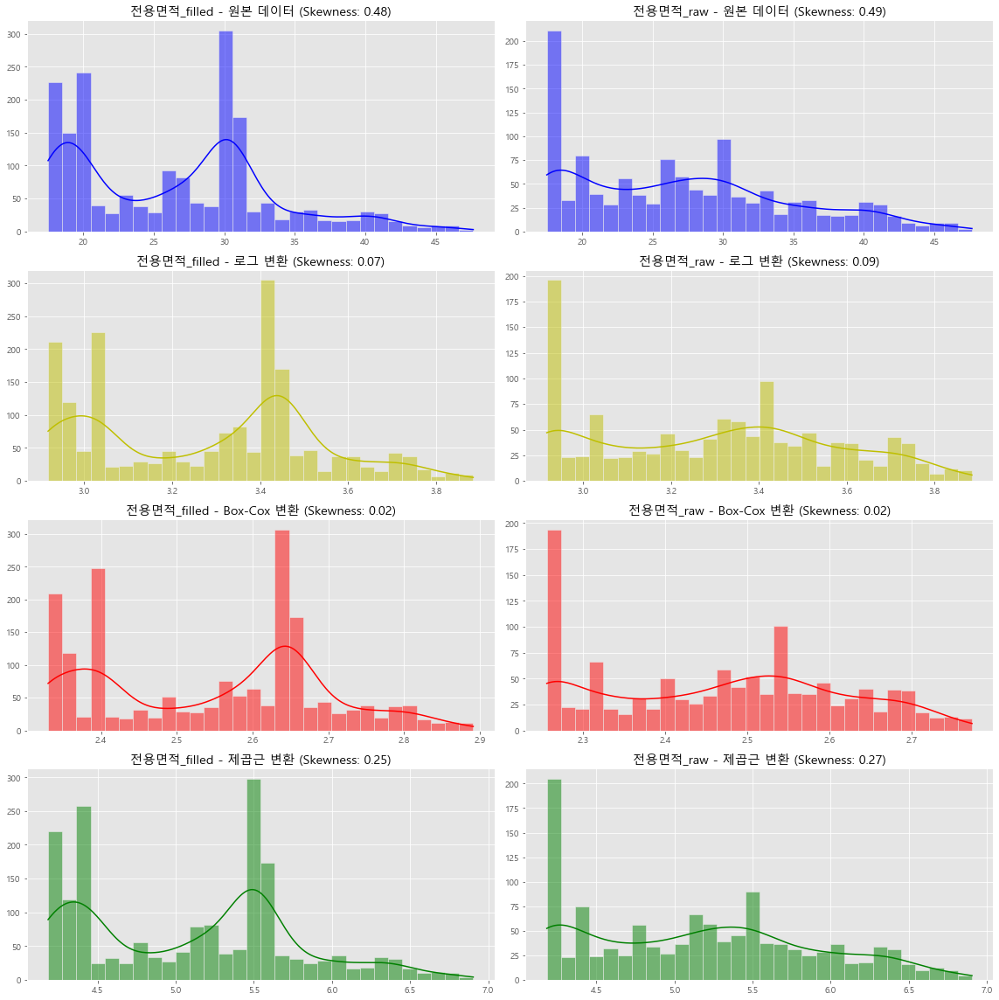

In [229]:
# 전용면적
transformations = ["원본 데이터", "로그 변환", "Box-Cox 변환", "제곱근 변환"]
check_columns = ['전용면적_filled', '전용면적_raw']
colors = ['b', 'y', 'r', 'g']

fig, axes = plt.subplots(4, 2, figsize=(16,16))

for i, col in enumerate(check_columns):
    # 결측 제거
    data_col = train_iqr_removed[col].dropna()

    # 변환들
    log_data = np.log1p(data_col)
    boxcox_data = pd.Series(stats.boxcox(data_col + 1)[0])
    sqrt_data = np.sqrt(data_col)
    data_list = [data_col, log_data, boxcox_data, sqrt_data]

    # 시각화
    for j, data in enumerate(data_list):
        sns.histplot(data, kde=True, ax=axes[j,i], color=colors[j], bins=30)
        axes[j, i].set_title(f"{col} - {transformations[j]} (Skewness: {data.skew():.2f})")
        axes[j, i].set_xlabel('')
        axes[j, i].set_ylabel('')

plt.tight_layout()
plt.show()

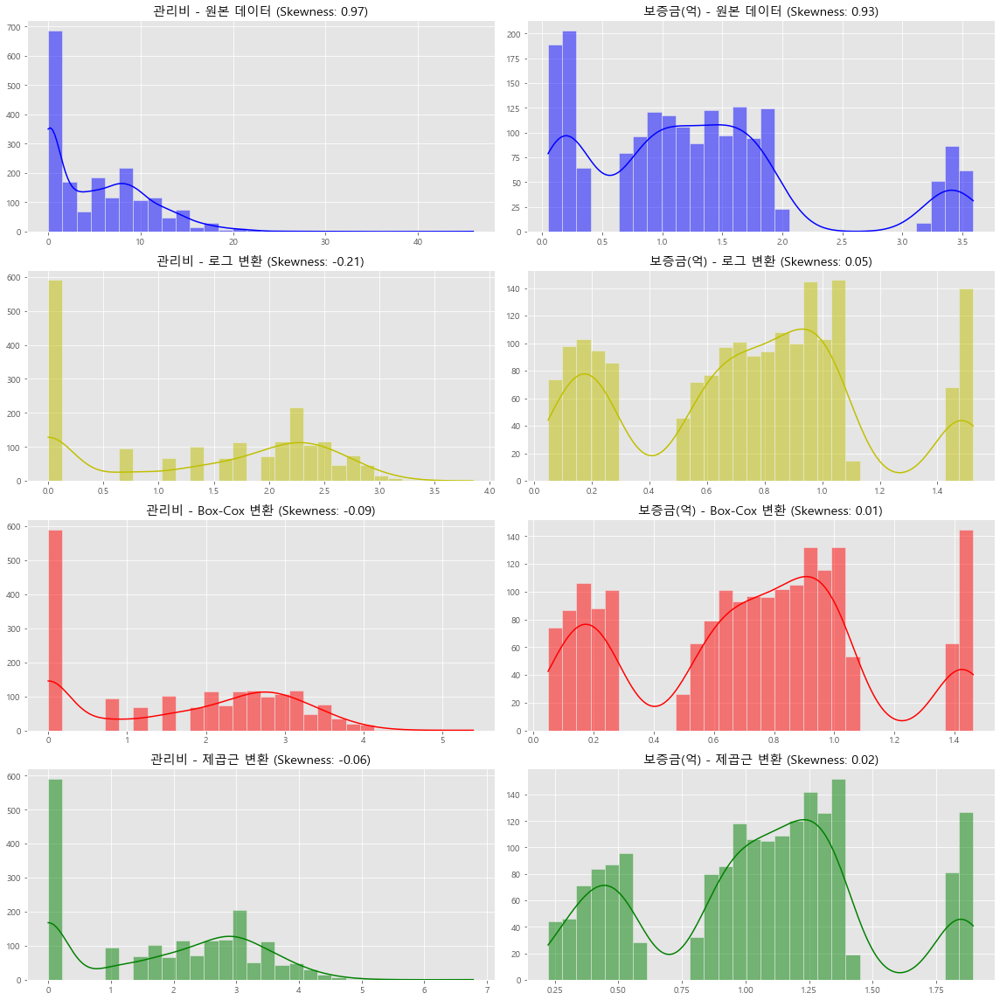

In [230]:
# 관리비, 보증금
transformations = ["원본 데이터", "로그 변환", "Box-Cox 변환", "제곱근 변환"]
check_columns = ['관리비', '보증금(억)']
colors = ['b', 'y', 'r', 'g']

fig, axes = plt.subplots(4, 2, figsize=(16,16))

for i, col in enumerate(check_columns):
    # 결측 제거
    data_col = train_iqr_removed[col].dropna()

    # 변환들
    log_data = np.log1p(data_col)
    boxcox_data = pd.Series(stats.boxcox(data_col + 1)[0])
    sqrt_data = np.sqrt(data_col)
    data_list = [data_col, log_data, boxcox_data, sqrt_data]

    # 시각화
    for j, data in enumerate(data_list):
        sns.histplot(data, kde=True, ax=axes[j,i], color=colors[j], bins=30)
        axes[j, i].set_title(f"{col} - {transformations[j]} (Skewness: {data.skew():.2f})")
        axes[j, i].set_xlabel('')
        axes[j, i].set_ylabel('')

plt.tight_layout()
plt.show()

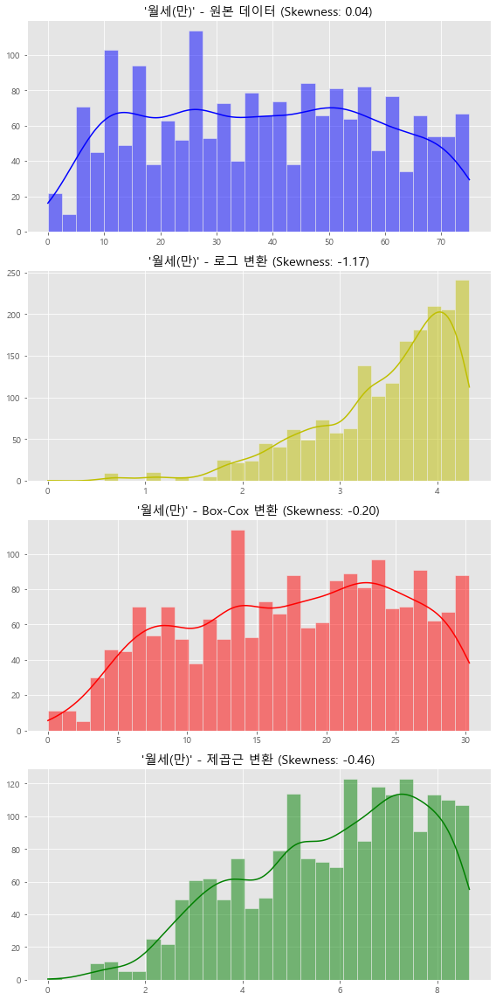

In [231]:
# 월세
transformations = ["원본 데이터", "로그 변환", "Box-Cox 변환", "제곱근 변환"]
colors = ['b', 'y', 'r', 'g']

fig, axes = plt.subplots(4, 1, figsize=(8,16))

# 결측 제거
data_col = train_iqr_removed['월세(만)'].dropna()

# 변환들
log_data = np.log1p(data_col)
boxcox_data = pd.Series(stats.boxcox(data_col + 1)[0])
sqrt_data = np.sqrt(data_col)
data_list = [data_col, log_data, boxcox_data, sqrt_data]

# 시각화
for j, data in enumerate(data_list):
    sns.histplot(data, kde=True, ax=axes[j], color=colors[j], bins=30)
    axes[j].set_title(f"'월세(만)' - {transformations[j]} (Skewness: {data.skew():.2f})")
    axes[j].set_xlabel('')
    axes[j].set_ylabel('')

plt.tight_layout()
plt.show()

총층 : 원본 1.03 로그 0.19 박스콕스 0.02 제곱근 0.54  
해당층 : 원본 1.22 로그 0.28 박스콕스 0.02 제곱근 0.62  
총주차대수filled : 원본 1.53 로그 0.49 박스콕스 0.12 제곱근 0.99  
총주차대수raw : 원본 1.00 로그 0.06 박스콕스 0.02 제곱근 0.53  
전용면적filled : 원본 0.48 -> 변환 불필요  
전용면적raw : 원본 0.48 -> 변환 불필요  
관리비 : 원본 0.97 로그 -0.21 박스콕스 -0.09 제곱근 -0.06  
보증금 : 원본 0.93 로그 -0.88 박스콕스 -0.12 제곱근 0.02  
월세 원본 0.04 -> 변환 불필요  

## 3) 변환 적용

Box-Cox변환 적용 피처 : 총층, 해당층, 총주차대수  
로그변환 적용 : 관리비, 보증금

In [232]:
train_transformed = train_iqr_removed.copy()

# Box-Cox 변환: 양수 값만 허용되므로 +1 처리
boxcox_features = {
    '총층': '총층_boxcox', 
    '해당층': '해당층_boxcox',
    '총주차대수_filled': '총주차대수_filled_boxcox',
    '총주차대수_raw': '총주차대수_raw_boxcox'
}

for original, new_col in boxcox_features.items():
    train_transformed[new_col] = np.nan
    notna_mask = train_transformed[original].notna()
    train_transformed.loc[notna_mask, new_col] = stats.boxcox(train_transformed.loc[notna_mask, original] + 1)[0]

# Log 변환
log_features = {
    '관리비': '관리비_log',
    '보증금(억)': '보증금(억)_log'
}

for original, new_col in log_features.items():
    train_transformed[new_col] = np.log1p(train_transformed[original])

## 4) 적용 후 확인

In [233]:
numerical_columns_after_conversion = ['총층_boxcox','해당층_boxcox','총주차대수_filled_boxcox','총주차대수_raw_boxcox','관리비_log','보증금(억)_log']

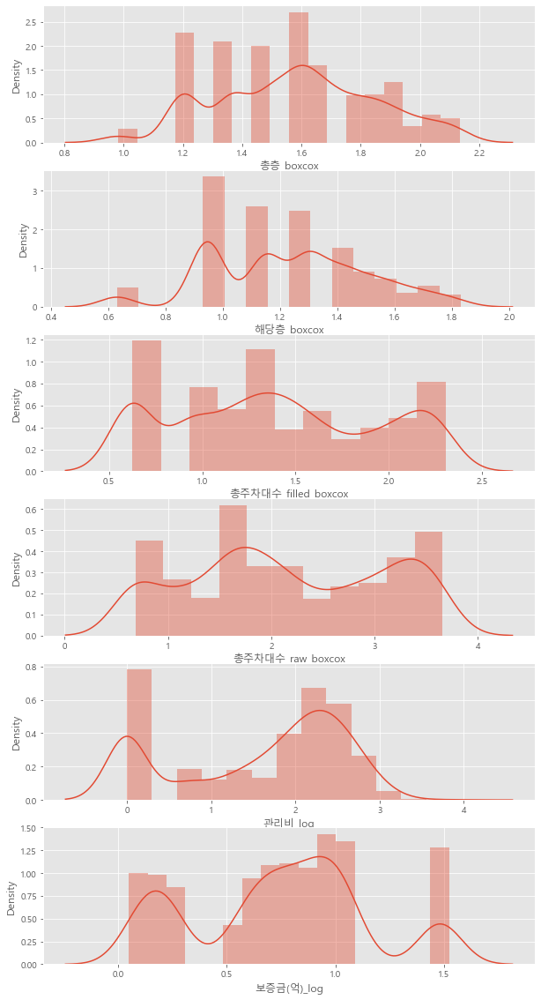

In [234]:
fig, axes = plt.subplots(len(numerical_columns_after_conversion),1, figsize=(10, 20))

for i, col in enumerate(numerical_columns_after_conversion):
    
    train_transformed = train_transformed.dropna(subset=[col])
    
    sns.distplot(train_transformed[col], kde=True, ax=axes[i])
      
plt.show()

이상 변환을 완료하였으며, 트리기반의 모델을 사용할 예정이기 때문에 스케일링은 진행하지 않음.

# 특성공학 적용(Feature Engineering)

In [235]:
train_feature_time = train_transformed.copy()

## 1) 시간변수 변환

In [236]:
train_feature_time['년월'].head()

3     2024-11
5     2024-09
8     2024-05
9     2024-11
10    2023-12
Name: 년월, dtype: object

#### (1) 시간변수 변환

In [237]:
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier

train_feature_time["year"] = train_feature_time["게재일"].dt.year
train_feature_time["month"] = train_feature_time["게재일"].dt.month
train_feature_time["day"] = train_feature_time["게재일"].dt.day

# 정책 기반 구간 함수
def policy_group(date):
    if date < pd.to_datetime("2024-07-01"):
        return "이전"
    elif date < pd.to_datetime("2024-08-01"):
        return "DSR강화"
    elif date < pd.to_datetime("2024-10-01"):
        return "8.8대책"
    elif date < pd.to_datetime("2024-11-01"):
        return "기준금리1차인하"
    elif date < pd.to_datetime("2024-12-15"):
        return "기준금리2차인하"
    else:
        return "이후"

train_feature_time["게재일_정책구간"] = train_feature_time["게재일"].apply(policy_group)

# 인코딩
train_feature_time["년월_encoded"] = LabelEncoder().fit_transform(train_feature_time["년월"])
train_feature_time["게재일_정책구간_encoded"] = LabelEncoder().fit_transform(train_feature_time["게재일_정책구간"])

# 타겟기반 구간화 함수 
def categorize_period(date):
    if date <= pd.Timestamp("2023-07-31"):
        return "구간1_초기"
    elif date <= pd.Timestamp("2024-02-29"):
        return "구간2_증가초기"
    elif date <= pd.Timestamp("2024-07-31"):
        return "구간3_허위급증"
    elif date <= pd.Timestamp("2024-10-31"):
        return "구간4_실매물급증"
    else:
        return "구간5_정상화"

    
train_feature_time["게재일_구간"] = train_feature_time["게재일"].apply(categorize_period)

# 인코딩 
le_target_group = LabelEncoder()
train_feature_time["게재일_구간_encoded"] = le_target_group.fit_transform(train_feature_time["게재일_구간"])


# 피처셋
feature_sets = {
    "버전1_년월일": ["year", "month", "day"],
    "버전2_년월": ["년월_encoded"],
    "버전3_정책구간": ["게재일_정책구간_encoded"],
    "버전4_타겟기반구간": ["게재일_구간_encoded"]
    
}

# 공통 피처
common_features = [
    '보증금(억)_log', '월세(만)', '전용면적_filled',
    '총층_boxcox', '해당층_boxcox', '총주차대수_filled_boxcox',
    '관리비_log', '방수', '욕실수'
]

target = "허위매물여부"

#### (2) 모델 실험 및 평가 - LightGBM 사용

[LightGBM] [Info] Number of positive: 28, number of negative: 180
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 293
[LightGBM] [Info] Number of data points in the train set: 208, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134615 -> initscore=-1.860752
[LightGBM] [Info] Start training from score -1.860752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Info] Number of positive: 28, number of negative: 180
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 264
[LightGBM] [Info] Number of data points in the train set: 208, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134615 -> initscore=-1.860752
[LightGBM] [Info] Start training from score -1.860752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 28, number of negative: 180
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 250
[LightGBM] [Info] Number of data points in the train set: 208, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.134615 -> initscore=-1.860752
[LightGBM] [Info] Start training from score -1.860752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113462 -> initscore=-2.055861
[LightGBM] [Info] Start training from score -2.055861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 28, number of negative: 180
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 249
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 118, number of negative: 922
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 677
[LightGBM] [Info] Number of data points in the train set: 1040, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113462 -> initscore=-2.055861
[LightGBM] [Info] Start training from score -2.055861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

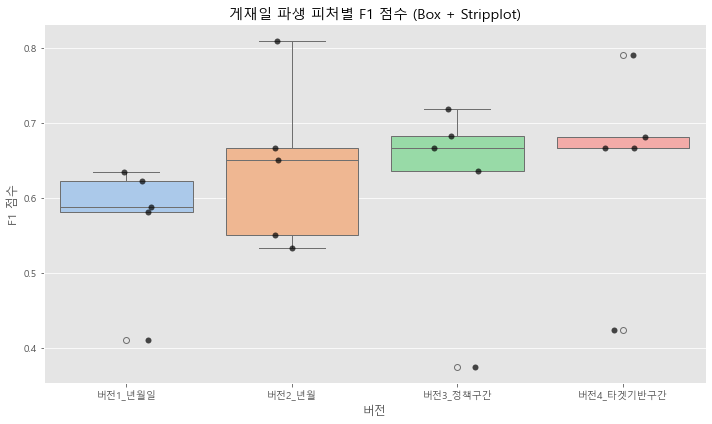

            count      mean       std       min       25%       50%       75%  \
버전                                                                              
버전1_년월일       5.0  0.567101  0.090504  0.410256  0.580645  0.588235  0.622222   
버전2_년월        5.0  0.641905  0.110690  0.533333  0.550000  0.650000  0.666667   
버전3_정책구간      5.0  0.615781  0.137782  0.375000  0.636364  0.666667  0.682927   
버전4_타겟기반구간    5.0  0.646018  0.134398  0.424242  0.666667  0.666667  0.681818   

                 max  
버전                    
버전1_년월일     0.634146  
버전2_년월      0.809524  
버전3_정책구간    0.717949  
버전4_타겟기반구간  0.790698  


In [238]:
# 모델 평가 결과 저장
cv_scores = {}
tscv = TimeSeriesSplit(n_splits=5)

for version, time_feats in feature_sets.items():
    X = train_feature_time[common_features + time_feats]
    y = train_feature_time[target]
    model = LGBMClassifier(random_state=42)
    scores = cross_val_score(model, X, y, cv=tscv, scoring="f1")
    cv_scores[version] = scores

# 결과 정리
score_df = pd.DataFrame({
    "버전": np.repeat(list(cv_scores.keys()), 5),
    "F1 점수": np.concatenate(list(cv_scores.values()))
})

# Box + Stripplot 시각화
plt.figure(figsize=(10, 6))
sns.boxplot(data=score_df, x="버전", y="F1 점수", palette="pastel")
sns.stripplot(data=score_df, x="버전", y="F1 점수", color="black", jitter=0.15, size=6, alpha=0.7)
plt.title("게재일 파생 피처별 F1 점수 (Box + Stripplot)")
plt.tight_layout()
plt.show()

# 통계 확인
print(score_df.groupby("버전")["F1 점수"].describe())

SHAP 분석 - 년월일
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


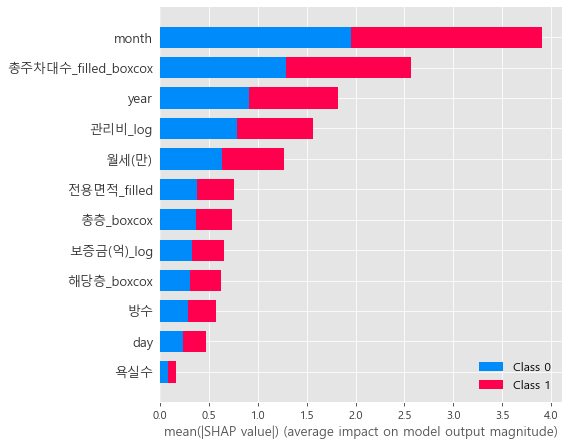

SHAP 분석 - 년월
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 711
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


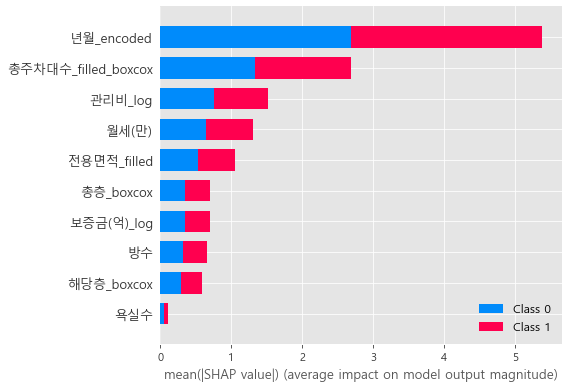

SHAP 분석 - 정책구간
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


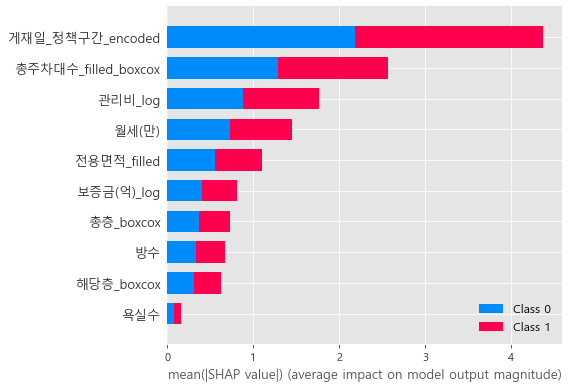

SHAP 분석 - 타겟기반구간
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 694
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


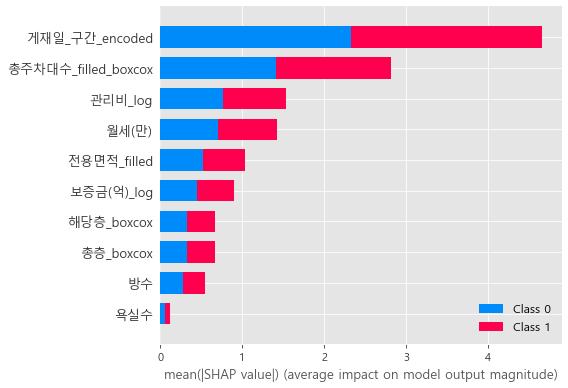

In [240]:
import shap

time_features = {
    "년월일": ["year", "month", "day"],
    "년월": ["년월_encoded"],
    "정책구간": ["게재일_정책구간_encoded"],
    "타겟기반구간": ["게재일_구간_encoded"]
}

# SHAP 실행
for label, time_cols in time_features.items():
    print(f"SHAP 분석 - {label}")
    X = train_feature_time[common_features + time_cols]
    y = train_feature_time[target]
    
    model = LGBMClassifier(random_state=42)
    model.fit(X, y)
    
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    shap.summary_plot(shap_values, X, plot_type="bar")

In [245]:
target = "허위매물여부"
common_features = [
    '보증금(억)_log', '월세(만)', '전용면적_filled',
    '총층_boxcox', '해당층_boxcox', '총주차대수_filled_boxcox',
    '관리비_log', '방수', '욕실수'
]

time_features = {
    "년월일": ["year", "month", "day"],
    "년월": ["년월_encoded"],
    "정책구간": ["게재일_정책구간_encoded"],
    "타겟기반구간": ["게재일_구간_encoded"]
}

shap_ratio_results = {}

for label, time_cols in time_features.items():
    print(f" SHAP 비율 계산 - {label}")
    
    X = train_feature_time[common_features + time_cols]
    y = train_feature_time[target]
    
    model = LGBMClassifier(random_state=42)
    model.fit(X, y)

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)[1] 

    shap_importance = np.abs(shap_values).mean(axis=0)
    shap_importance_ratio = shap_importance / shap_importance.sum()

    shap_summary = pd.DataFrame({
        "feature": X.columns,
        "shap_value_mean": shap_importance,
        "shap_ratio": shap_importance_ratio
    }).sort_values(by="shap_ratio", ascending=False)

    shap_ratio_results[label] = shap_summary

shap_ratio_df = pd.concat(shap_ratio_results, names=["버전"])
shap_ratio_df

 SHAP 비율 계산 - 년월일
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
 SHAP 비율 계산 - 년월
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 711
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pav

feature  shap_value_mean  shap_ratio
버전                                                         
년월일    10                month         1.956298    0.258637
       5   총주차대수_filled_boxcox         1.285499    0.169952
       9                  year         0.911317    0.120483
       6               관리비_log         0.784765    0.103752
       1                 월세(만)         0.636231    0.084114
       2           전용면적_filled         0.380631    0.050322
       3             총층_boxcox         0.368945    0.048777
       0            보증금(억)_log         0.325165    0.042989
       4            해당층_boxcox         0.309288    0.040890
       7                    방수         0.287752    0.038043
       11                  day         0.236161    0.031222
       8                   욕실수         0.081829    0.010818
년월     9            년월_encoded         2.690731    0.365749
       5   총주차대수_filled_boxcox         1.340487    0.182211
       6               관리비_log         0.760617    0.103390
       1                 월세(만)         0.652524    0.088697
       2           전용면적_filled         0.527517    0.071705
       3             총층_boxcox         0.354734    0.048219
       0            보증금(억)_log         0.351235    0.047743
       7                    방수         0.327715    0.044546
       4            해당층_boxcox         0.293874    0.039946
       8                   욕실수         0.057335    0.007793
정책구간   9      게재일_정책구간_encoded         2.187189    0.307023
       5   총주차대수_filled_boxcox         1.282521    0.180032
       6               관리비_log         0.880527    0.123602
       1                 월세(만)         0.724755    0.101736
       2           전용면적_filled         0.553410    0.077684
       0            보증금(억)_log         0.406548    0.057068
       3             총층_boxcox         0.364954    0.051230
       7                    방수         0.333390    0.046799
       4            해당층_boxcox         0.310011    0.043517
       8                   욕실수         0.080565    0.011309
타겟기반구간 9        게재일_구간_encoded         2.330567    0.324242
       5   총주차대수_filled_boxcox         1.409457    0.196092
       6               관리비_log         0.770097    0.107140
       1                 월세(만)         0.711121    0.098935
       2           전용면적_filled         0.517494    0.071997
       0            보증금(억)_log         0.450479    0.062673
       4            해당층_boxcox         0.333556    0.046406
       3             총층_boxcox         0.331847    0.046168
       7                    방수         0.275315    0.038303
       8                   욕실수         0.057805    0.008042

SHAP 영향력 비율을 확인한 결과, 직접적인 과적합은 아니지만 게재일 파생 피처에 상당히 많이 의존하는 것을 확인할 수 있다.

년월 -> 년월_encoded	0.3657   
정책구간 -> 게재일_정책구간_encoded	0.3070  
타겟기반 -> 게재일_구간_encoded	0.3242  
년월일 -> month + year + day 합계	≈ 0.41   

년월일 피처의 경우 SHAP 합산 영향력 과도하다고 판단되어 제외하였으며, 타겟기반 피처의 경우 SHAP 영향력과 F1 스코어를 기반으로, 기존의 피처와 차이가 많이 나지 않지만 과적합의 우려가 있기 때문에 제외하였다.

타겟 기반으로 생성된 게재일_구간 피처는
허위매물의 시계열적 패턴을 잘 반영하여 높은 예측 성능을 보이지만,
타겟 분포에 기반한 피처이기 때문에 모델 학습 시 과적합의 우려가 있다.
따라서 모델링에는 신중히 활용해야 하지만, 인사이트 도출에는 매우 유용한 피처로 판단된다.

따라서 정책기반구간과 년월 두 피처를 선택하였으며, 추후의 모델링 과정에서 성능과 중요도를 통해서 최종 피처 설렉션을 진행할 예정이다.

In [246]:
train_feature_time.columns

Index(['매물확인방식', '해당층', '총층', '방향', '방수', '욕실수', '주차가능여부', '총주차대수_filled',
       '관리비', '중개사무소', '제공플랫폼', '게재일', '허위매물여부', '제공플랫폼_top5', '중개사무소_top5',
       '년월', '해당층_결측여부', '총주차대수_결측여부', '총주차대수_raw', '전용면적_결측여부', '전용면적_raw',
       '전용면적_filled', '보증금(억)', '월세(만)', '총층_boxcox', '해당층_boxcox',
       '총주차대수_filled_boxcox', '총주차대수_raw_boxcox', '관리비_log', '보증금(억)_log',
       'year', 'month', 'day', '게재일_정책구간', '년월_encoded', '게재일_정책구간_encoded',
       '게재일_구간', '게재일_구간_encoded'],
      dtype='object')

In [249]:
train_time_derivated = train_feature_time.copy()

train_time_derivated = train_time_derivated.drop(columns=['게재일','년월','year', 'month', 'day','해당층','총층','총주차대수_raw','총주차대수_filled','보증금(억)','관리비', '게재일_정책구간','게재일_구간', '게재일_구간_encoded'])

In [250]:
train_time_derivated.columns

Index(['매물확인방식', '방향', '방수', '욕실수', '주차가능여부', '중개사무소', '제공플랫폼', '허위매물여부',
       '제공플랫폼_top5', '중개사무소_top5', '해당층_결측여부', '총주차대수_결측여부', '전용면적_결측여부',
       '전용면적_raw', '전용면적_filled', '월세(만)', '총층_boxcox', '해당층_boxcox',
       '총주차대수_filled_boxcox', '총주차대수_raw_boxcox', '관리비_log', '보증금(억)_log',
       '년월_encoded', '게재일_정책구간_encoded'],
      dtype='object')

## 2) 범주형 변수 처리

#### (1) 방향

In [257]:
train_direction = train_time_derivated.copy()

In [258]:
# 선호 비선호 중립으로 재범주화

def simplify_direction_preference(x):
    preferred = ['남향', '남동', '남서']
    not_preferred = ['북향', '북동', '북서']
    if x in preferred:
        return '선호'
    elif x in not_preferred:
        return '비선호'
    else:
        return '중립'
    
train_direction['방향선호도'] = train_direction['방향'].apply(simplify_direction_preference)

In [259]:
# 사인 코사인 변환

direction_to_degree = {
    '북향': 0,
    '북동향': 45,
    '동향': 90,
    '남동향': 135,
    '남향': 180,
    '남서향': 225,
    '서향': 270,
    '북서향': 315
}

train_direction['방향_각도'] = train_direction['방향'].map(direction_to_degree)

# 라디안 변환 (각도 → 라디안)
train_direction['방향_라디안'] = np.deg2rad(train_direction['방향_각도'])

# 사인/코사인 인코딩
train_direction['방향_sin'] = np.sin(train_direction['방향_라디안'])
train_direction['방향_cos'] = np.cos(train_direction['방향_라디안'])

train_direction = train_direction.drop(columns=['방향_라디안','방향_각도'])

In [260]:
# Top-5 + 기타

def add_direction_topn(train, topn=5):
    top_dirs = train_direction['방향'].value_counts().nlargest(topn).index
    train_direction['방향_top5'] = train_direction['방향'].apply(lambda x: x if x in top_dirs else '기타')
    return train

add_direction_topn(train_direction)

,매물확인방식,방향,방수,욕실수,주차가능여부,중개사무소,제공플랫폼,허위매물여부,제공플랫폼_top5,중개사무소_top5,...,총주차대수_filled_boxcox,총주차대수_raw_boxcox,관리비_log,보증금(억)_log,년월_encoded,게재일_정책구간_encoded,방향선호도,방향_sin,방향_cos,방향_top5
3,현장확인,남동향,2.0,1.0,가능,G52Iz8V2B9,A플랫폼,0,A플랫폼,G52Iz8V2B9,...,1.820151,2.513265,2.397895,0.968883,18,3,중립,7.071068e-01,-0.707107,남동향
5,전화확인,남향,2.0,1.0,가능,Q42YF3Y0I2,A플랫폼,0,A플랫폼,기타,...,0.625529,0.684259,0.000000,0.928219,16,0,선호,1.224647e-16,-1.000000,남향
8,현장확인,북향,2.0,2.0,가능,G52Iz8V2B9,B플랫폼,0,B플랫폼,G52Iz8V2B9,...,1.951839,2.788433,1.386294,0.790728,12,4,비선호,0.000000e+00,1.000000,기타
9,현장확인,남동향,2.0,1.0,불가능,M90Ph8W9V3,B플랫폼,0,B플랫폼,기타,...,0.935234,1.076396,0.000000,0.585005,18,3,중립,7.071068e-01,-0.707107,남동향
10,현장확인,남향,1.0,1.0,불가능,G52Iz8V2B9,A플랫폼,0,A플랫폼,G52Iz8V2B9,...,1.879227,2.633971,1.791759,1.056053,7,4,선호,1.224647e-16,-1.000000,남향
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2440,현장확인,남동향,2.0,1.0,가능,u92NN7A1E5,A플랫폼,0,A플랫폼,기타,...,0.625529,0.684259,1.098612,0.258511,14,1,중립,7.071068e-01,-0.707107,남동향
2441,현장확인,남향,1.0,1.0,불가능,l84az9J6A2,C플랫폼,1,C플랫폼,기타,...,1.275215,1.562058,1.098612,0.860778,12,4,선호,1.224647e-16,-1.000000,남향
2443,현장확인,남향,1.0,1.0,불가능,S06Ox3K4D9,A플랫폼,0,A플랫폼,기타,...,1.472199,1.876935,0.000000,0.152721,18,3,선호,1.224647e-16,-1.000000,남향
2444,현장확인,남서향,1.0,1.0,가능,G52Iz8V2B9,A플랫폼,0,A플랫폼,G52Iz8V2B9,...,2.303418,3.656972,0.000000,0.270027,15,0,중립,-7.071068e-01,-0.707107,남서향


In [263]:
# 카이제곱 검정

direction_check_columns = ['방향_top5','방향선호도','방향']

for col in direction_check_columns:
    contingency_table = pd.crosstab(train_direction["허위매물여부"], train_direction[col])

    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"{col}과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

방향_top5과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=36.9039, p-value=0.0000
방향선호도과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=30.3983, p-value=0.0000
방향과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=60.7771, p-value=0.0000


모든 방향피처의 파생 피처들도 카이제곱 검정 결과 타겟과 유의미하게 독립적이지 않다는 결과가 나왔다. 다만 원본에 비해서 파생 피처들은 정보의 손실이 어느 정도 있는 단순화된 피처인 것으로 확인된다.  
F1 스코어와 shap영향력까지 확인해보자.

[LightGBM] [Info] Number of positive: 114, number of negative: 884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114228 -> initscore=-2.048259
[LightGBM] [Info] Start training from score -2.048259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 113, number of negative: 8

[LightGBM] [Info] Number of positive: 113, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 651
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113226 -> initscore=-2.058200
[LightGBM] [Info] Start training from score -2.058200
[LightGBM] [Info] Number of positive: 114, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 658
[LightGBM] [Info] Number of data points in the train set: 999, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114114 -> initscore=-2.049389
[LightGBM] [Info] Start training from score -2.049389
[LightGBM] [Warning] No furt

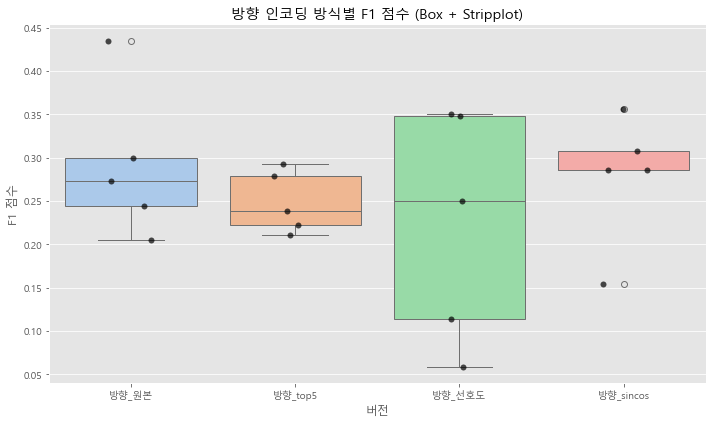

           count      mean       std       min       25%       50%       75%  \
버전                                                                             
방향_sincos    5.0  0.277705  0.074882  0.153846  0.285714  0.285714  0.307692   
방향_top5      5.0  0.248519  0.035803  0.210526  0.222222  0.238095  0.279070   
방향_선호도       5.0  0.224187  0.133422  0.058824  0.114286  0.250000  0.347826   
방향_원본        5.0  0.291308  0.087579  0.205128  0.243902  0.272727  0.300000   

                max  
버전                   
방향_sincos  0.355556  
방향_top5    0.292683  
방향_선호도     0.350000  
방향_원본      0.434783  


In [275]:
from sklearn.model_selection import StratifiedKFold

def label_encode_columns(train, columns):
    le_dict = {}
    for col in columns:
        le = LabelEncoder()
        train[col] = le.fit_transform(train[col])
        le_dict[col] = le
    return train, le_dict

# 레이블 인코딩이 필요한 컬럼들
categorical_cols = ['방향', '방향_top5', '방향선호도']

# 인코딩 적용
train_direction, encoders = label_encode_columns(train_direction, categorical_cols)

direction_feature_sets = {
    "방향_원본": ["방향"],
    "방향_top5": ["방향_top5"],
    "방향_선호도": ["방향선호도"],
    "방향_sincos": ["방향_sin", "방향_cos"]
}

target = "허위매물여부"
common_features = ['총주차대수_filled_boxcox','관리비_log','월세(만)','보증금(억)_log','전용면적_filled'] 

cv_scores = {}
tscv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for version, feats in direction_feature_sets.items():
    X = train_direction[common_features + feats]
    y = train_direction[target]
    
    model = LGBMClassifier(random_state=42)
    scores = cross_val_score(model, X, y, cv=tscv, scoring="f1")
    cv_scores[version] = scores

score_df = pd.DataFrame({
    "버전": np.repeat(list(cv_scores.keys()), 5),
    "F1 점수": np.concatenate(list(cv_scores.values()))
})

plt.figure(figsize=(10, 6))
sns.boxplot(data=score_df, x="버전", y="F1 점수", palette="pastel")
sns.stripplot(data=score_df, x="버전", y="F1 점수", color="black", jitter=0.15, size=6, alpha=0.7)
plt.title("방향 인코딩 방식별 F1 점수 (Box + Stripplot)")
plt.tight_layout()
plt.show()

print(score_df.groupby("버전")["F1 점수"].describe())

In [276]:
# SHAP 비율 결과 저장용
shap_ratio_results = {}

for label, direction_cols in direction_feature_sets.items():
    print(f"SHAP 분석 - {label}")
    
    X = train_direction[common_features + direction_cols]
    y = train_direction[target]

    model = LGBMClassifier(random_state=42)
    model.fit(X, y)

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)[1]  # binary classification → index 1

    # SHAP 평균 중요도 및 비율 계산
    shap_importance = np.abs(shap_values).mean(axis=0)
    shap_importance_ratio = shap_importance / shap_importance.sum()

    shap_summary = pd.DataFrame({
        "feature": X.columns,
        "shap_value_mean": shap_importance,
        "shap_ratio": shap_importance_ratio
    }).sort_values(by="shap_ratio", ascending=False)

    shap_ratio_results[label] = shap_summary

# 결과 통합
shap_ratio_df = pd.concat(shap_ratio_results, names=["버전"])

SHAP 분석 - 방향_원본
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 662
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
SHAP 분석 - 방향_top5
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score 

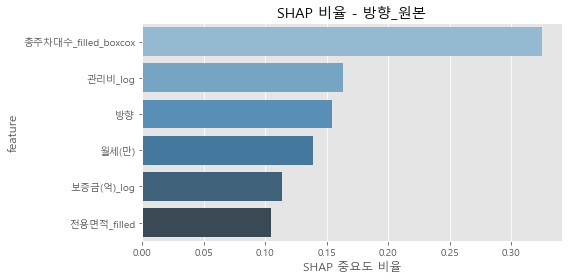

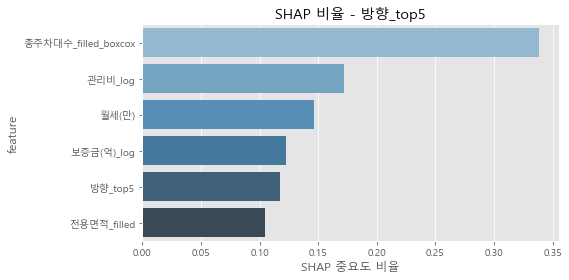

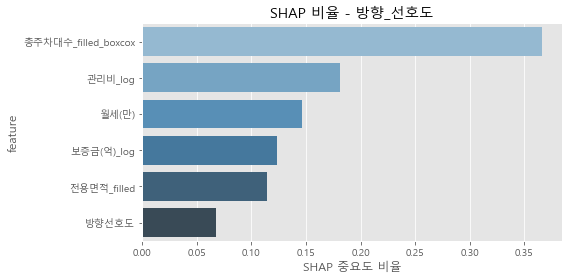

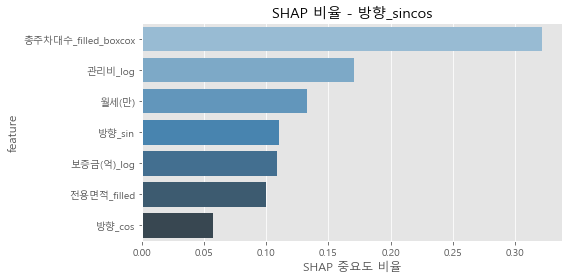

In [277]:
for version in shap_ratio_results:
    df = shap_ratio_results[version].copy()
    plt.figure(figsize=(8, 4))
    sns.barplot(data=df, x="shap_ratio", y="feature", palette="Blues_d")
    plt.title(f"SHAP 비율 - {version}")
    plt.xlabel("SHAP 중요도 비율")
    plt.tight_layout()
    plt.show()

F1 스코어의 평균값과 분산을 확인해 봤을 때, 방향(원본)의 성능이 가장 좋으며 SHAP 비율 또한 0.15로 가장 높다.
선호도 그룹과 top5의 경우 평균적인 스코어도 내려갔으며, 많이 단순해진 형태를 띈다. SHAP 비율도 0.12와 0.07로 정보의 손실이 발생한 것으로 확인된다.

높은 성능을 우선시 한다면 원본으로서 사용을 하되, 복잡도를 줄이고 어느정도 성능을 유지하고 싶다면 사인코사인을 사용하는 것이 좋아 보인다. 따라서 방향(원본)과 사인코사인만 유지하고 top5와 방향선호토 피처를 제외하였다.

In [278]:
train_direction.columns

Index(['매물확인방식', '방향', '방수', '욕실수', '주차가능여부', '중개사무소', '제공플랫폼', '허위매물여부',
       '제공플랫폼_top5', '중개사무소_top5', '해당층_결측여부', '총주차대수_결측여부', '전용면적_결측여부',
       '전용면적_raw', '전용면적_filled', '월세(만)', '총층_boxcox', '해당층_boxcox',
       '총주차대수_filled_boxcox', '총주차대수_raw_boxcox', '관리비_log', '보증금(억)_log',
       '년월_encoded', '게재일_정책구간_encoded', '방향선호도', '방향_sin', '방향_cos',
       '방향_top5'],
      dtype='object')

In [279]:
train_direction = train_direction.drop(columns=['방향선호도','방향_top5'])

#### (2) 중개사무소

In [280]:
train_office = train_direction.copy()

In [290]:
# top1과 기타

train_office['중개사무소_top1'] = train_office['중개사무소'].apply(
    lambda x: x if x == 'G52Iz8V2B9' else '기타'
)

In [292]:
# top5와 기타

top_5 = ['G52Iz8V2B9', 'J52gJ2E4T6', 'K86UF7I0P3', 'w94Qb4G0K5', 'r82ax9M3U3']

train_office['중개사무소_top5'] = train_office['중개사무소'].apply(
    lambda x: x if x in top_5 else '기타'
)

In [293]:
# 빈도 기반

freq = train_office['중개사무소'].value_counts()

def group_by_freq(x):
    count = freq.get(x, 0)
    if count >= 50:
        return '매우많음'
    elif count >= 10:
        return '중간'
    else:
        return '희귀'

train_office['중개사무소_빈도기반'] = train_office['중개사무소'].apply(group_by_freq)

In [297]:
office_check_columns = ['중개사무소_top1','중개사무소_top5','중개사무소_빈도기반']

for col in office_check_columns:
    contingency_table = pd.crosstab(train_office["허위매물여부"], train_office[col])

    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"{col}과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

중개사무소_top1과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=103.4696, p-value=0.0000
중개사무소_top5과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=116.2108, p-value=0.0000
중개사무소_빈도기반과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=106.8936, p-value=0.0000


In [294]:
for col in ['중개사무소_top1', '중개사무소_top5', '중개사무소_빈도기반']:
    train_office[col] = LabelEncoder().fit_transform(train_office[col])

In [295]:
office_feature_sets = {
    "중개사무소_top1": ["중개사무소_top1"],
    "중개사무소_top5": ["중개사무소_top5"],
    "중개사무소_빈도그룹": ["중개사무소_빈도기반"]
}

[LightGBM] [Info] Number of positive: 114, number of negative: 884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 662
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114228 -> initscore=-2.048259
[LightGBM] [Info] Start training from score -2.048259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 662
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113226 -> initscore=-2.058200
[LightGBM] [Info] Start training from score -2.058200
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Info] Number of positive: 113, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113226 -> initscore=-2.058200
[LightGBM] [Info] Start training from score -2.058200
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

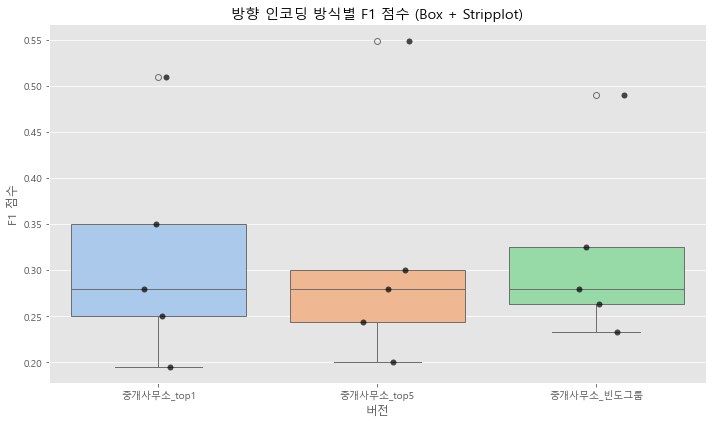

            count      mean       std       min       25%      50%       75%  \
버전                                                                             
중개사무소_top1    5.0  0.316799  0.121495  0.195122  0.250000  0.27907  0.350000   
중개사무소_top5    5.0  0.314398  0.136528  0.200000  0.243902  0.27907  0.300000   
중개사무소_빈도그룹    5.0  0.318033  0.101729  0.232558  0.263158  0.27907  0.325581   

                 max  
버전                    
중개사무소_top1  0.509804  
중개사무소_top5  0.549020  
중개사무소_빈도그룹  0.489796  


In [298]:
target = "허위매물여부"
common_features = ['총주차대수_filled_boxcox','관리비_log','월세(만)','보증금(억)_log','전용면적_filled','방향'] 

cv_scores = {}
tscv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for version, feats in office_feature_sets.items():
    X = train_office[common_features + feats]
    y = train_office[target]
    
    model = LGBMClassifier(random_state=42)
    scores = cross_val_score(model, X, y, cv=tscv, scoring="f1")
    cv_scores[version] = scores

score_df = pd.DataFrame({
    "버전": np.repeat(list(cv_scores.keys()), 5),
    "F1 점수": np.concatenate(list(cv_scores.values()))
})

plt.figure(figsize=(10, 6))
sns.boxplot(data=score_df, x="버전", y="F1 점수", palette="pastel")
sns.stripplot(data=score_df, x="버전", y="F1 점수", color="black", jitter=0.15, size=6, alpha=0.7)
plt.title("방향 인코딩 방식별 F1 점수 (Box + Stripplot)")
plt.tight_layout()
plt.show()

print(score_df.groupby("버전")["F1 점수"].describe())

In [299]:
# SHAP 비율 결과 저장용
shap_ratio_results = {}

for label, office_cols in office_feature_sets.items():
    print(f"SHAP 분석 - {label}")
    
    X = train_office[common_features + office_cols]
    y = train_office[target]

    model = LGBMClassifier(random_state=42)
    model.fit(X, y)

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)[1]  # binary classification → index 1

    # SHAP 평균 중요도 및 비율 계산
    shap_importance = np.abs(shap_values).mean(axis=0)
    shap_importance_ratio = shap_importance / shap_importance.sum()

    shap_summary = pd.DataFrame({
        "feature": X.columns,
        "shap_value_mean": shap_importance,
        "shap_ratio": shap_importance_ratio
    }).sort_values(by="shap_ratio", ascending=False)

    shap_ratio_results[label] = shap_summary

# 결과 통합
shap_ratio_df = pd.concat(shap_ratio_results, names=["버전"])

SHAP 분석 - 중개사무소_top1
[LightGBM] [Info] Number of positive: 142, number of negative: 1106
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 1248, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113782 -> initscore=-2.052678
[LightGBM] [Info] Start training from score -2.052678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
SHAP 분석 - 중개사무소_top5
[LightGBM] [Info] Nu

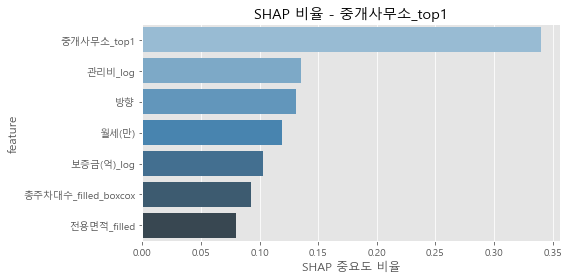

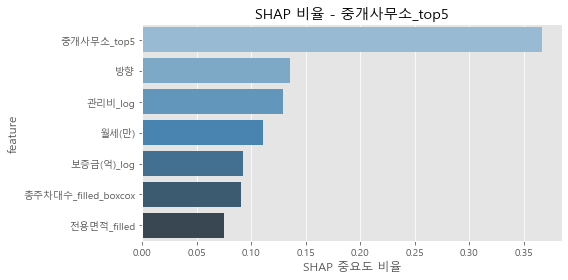

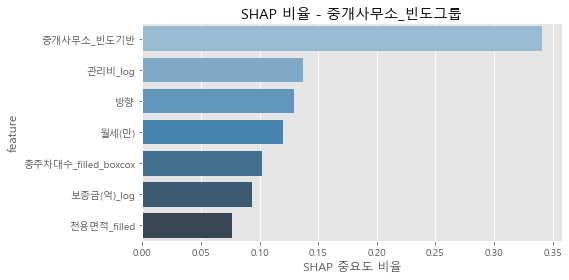

In [300]:
for version in shap_ratio_results:
    df = shap_ratio_results[version].copy()
    plt.figure(figsize=(8, 4))
    sns.barplot(data=df, x="shap_ratio", y="feature", palette="Blues_d")
    plt.title(f"SHAP 비율 - {version}")
    plt.xlabel("SHAP 중요도 비율")
    plt.tight_layout()
    plt.show()

Top-5의 경우 F1 스코어에서 다소 분산은 크지만 가장 좋은 성능을 가진다. 또한 SHAP 영향력의 비율이 0.37로 가장 크다.  
또한 빈도 그룹화의 경우 F1 스코어에서 평균이 가장 좋으며 분산이 작은 안정적인 스코어 분포를 갖는다. 또한 SHAP 영향력도 나쁘지 않다.

Top-1의 경우에는 정보 손실 가능성으로 인해 제외해 주도록 한다.

In [301]:
train_office.columns

Index(['매물확인방식', '방향', '방수', '욕실수', '주차가능여부', '중개사무소', '제공플랫폼', '허위매물여부',
       '제공플랫폼_top5', '중개사무소_top5', '해당층_결측여부', '총주차대수_결측여부', '전용면적_결측여부',
       '전용면적_raw', '전용면적_filled', '월세(만)', '총층_boxcox', '해당층_boxcox',
       '총주차대수_filled_boxcox', '총주차대수_raw_boxcox', '관리비_log', '보증금(억)_log',
       '년월_encoded', '게재일_정책구간_encoded', '방향_sin', '방향_cos', '중개사무소_top1',
       '중개사무소_빈도기반'],
      dtype='object')

In [302]:
train_office = train_office.drop(columns=['중개사무소','중개사무소_top1'])

#### (3) 제공플랫폼

In [303]:
train_platform = train_office.copy()

In [305]:
train_platform['제공플랫폼'].value_counts()

제공플랫폼
A플랫폼    527
B플랫폼    250
C플랫폼    192
E플랫폼     95
D플랫폼     72
G플랫폼     38
F플랫폼     24
H플랫폼     20
L플랫폼     10
I플랫폼      9
J플랫폼      7
K플랫폼      3
M플랫폼      1
Name: count, dtype: int64

In [307]:
# top5 + 기타

top5_platforms = ['A플랫폼', 'B플랫폼', 'C플랫폼', 'E플랫폼', 'D플랫폼']

train_platform['제공플랫폼_top5'] = train_platform['제공플랫폼'].apply(
    lambda x: x if x in top5_platforms else '기타'
)

In [310]:
# 빈도 기반

def platform_freq_group(x):
    count = train_platform['제공플랫폼'].value_counts().get(x, 0)
    if count >= 100:
        return '많이'
    elif count >= 10:
        return '중간'
    else:
        return '희귀'

train_platform['제공플랫폼_빈도기반'] = train_platform['제공플랫폼'].apply(platform_freq_group)

In [312]:
# 카이제곱 검정

platform_check_columns = ['제공플랫폼','제공플랫폼_top5','제공플랫폼_빈도기반']

for col in platform_check_columns:
    contingency_table = pd.crosstab(train_platform["허위매물여부"], train_platform[col])

    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"{col}과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

제공플랫폼과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=9.7779, p-value=0.6354
제공플랫폼_top5과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=7.0367, p-value=0.2179
제공플랫폼_빈도기반과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=2.4180, p-value=0.2985


제공플랫폼 피처의 경우 기존의 피처와 파생 피처 모두 통계적으로 허위매물여부와 독립적이기 때문에 타겟의 예측에 도움이 되지 않는 피처로 판단, 제외하였다.

In [313]:
train_platform = train_platform.drop(columns=['제공플랫폼','제공플랫폼_top5','제공플랫폼_빈도기반'])

In [314]:
train_platform.head()

,매물확인방식,방향,방수,욕실수,주차가능여부,허위매물여부,중개사무소_top5,해당층_결측여부,총주차대수_결측여부,전용면적_결측여부,...,해당층_boxcox,총주차대수_filled_boxcox,총주차대수_raw_boxcox,관리비_log,보증금(억)_log,년월_encoded,게재일_정책구간_encoded,방향_sin,방향_cos,중개사무소_빈도기반
3,현장확인,0,2.0,1.0,가능,0,0,0,0,0,...,1.149452,1.820151,2.513265,2.397895,0.968883,18,3,7.071068e-01,-0.707107,0
5,전화확인,2,2.0,1.0,가능,0,5,1,0,0,...,0.946062,0.625529,0.684259,0.000000,0.928219,16,0,1.224647e-16,-1.000000,2
8,현장확인,6,2.0,2.0,가능,0,0,0,0,0,...,0.630183,1.951839,2.788433,1.386294,0.790728,12,4,0.000000e+00,1.000000,0
9,현장확인,0,2.0,1.0,불가능,0,5,0,0,0,...,0.946062,0.935234,1.076396,0.000000,0.585005,18,3,7.071068e-01,-0.707107,2
10,현장확인,2,1.0,1.0,불가능,0,0,0,0,0,...,0.630183,1.879227,2.633971,1.791759,1.056053,7,4,1.224647e-16,-1.000000,0


In [315]:
train_platform.columns

Index(['매물확인방식', '방향', '방수', '욕실수', '주차가능여부', '허위매물여부', '중개사무소_top5',
       '해당층_결측여부', '총주차대수_결측여부', '전용면적_결측여부', '전용면적_raw', '전용면적_filled',
       '월세(만)', '총층_boxcox', '해당층_boxcox', '총주차대수_filled_boxcox',
       '총주차대수_raw_boxcox', '관리비_log', '보증금(억)_log', '년월_encoded',
       '게재일_정책구간_encoded', '방향_sin', '방향_cos', '중개사무소_빈도기반'],
      dtype='object')

In [317]:
remain_cat_columns = ['매물확인방식', '방수', '욕실수', '주차가능여부']

for col in remain_cat_columns:
    contingency_table = pd.crosstab(train_platform["허위매물여부"], train_platform[col])

    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"{col}과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic={chi2:.4f}, p-value={p_value:.4f}")

매물확인방식과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=1.2110, p-value=0.5458
방수과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=3.7399, p-value=0.0531
욕실수과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=1.9924, p-value=0.1581
주차가능여부과 허위매물여부의 카이제곱 검정 결과: Chi2-statistic=15.0815, p-value=0.0001


나머지 피처들 중에서도 타겟과 독립적인 피처들을 제외해 주었다.

In [318]:
train_platform = train_platform.drop(columns=['매물확인방식', '방수', '욕실수'])

# 조합 탐색

In [321]:
train_combination = train_platform.copy()

In [326]:
le = LabelEncoder()
train_combination['주차가능여부'] = le.fit_transform(train_combination['주차가능여부'])

먼저 전용면적과 총주차대수는 전부 포함한 상태에서 나머지 게재일, 방향, 중개사무소에 대한 F1 스코어 및 정밀도 재현율 계산. 이 세가지 항목에 대해 최적의 조합 확인한 후 전용면적과 총주차대수 피처 탐색

In [327]:
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
import itertools

# 공통 피처
common_features = [
    "관리비_log", "보증금(억)_log", "월세(만)",
    "총층_boxcox", "해당층_boxcox", "해당층_결측여부", "주차가능여부"
]

# 항상 포함할 피처
area_features = ["전용면적_결측여부", "전용면적_raw", "전용면적_filled"]
parking_features = ["총주차대수_결측여부", "총주차대수_raw_boxcox", "총주차대수_filled_boxcox"]

# 조합 후보군
direction_options = [["방향"], ["방향_sin", "방향_cos"]]
office_options = [["중개사무소_top5"], ["중개사무소_빈도기반"]]
time_options = [["년월_encoded"], ["게재일_정책구간_encoded"]]

# 조합 생성
combinations = list(itertools.product(direction_options, office_options, time_options))

# 결과 저장
combo_results = []

for direction_feats, office_feats, time_feats in combinations:
    feature_set = common_features + area_features + parking_features + direction_feats + office_feats + time_feats
    combo_name = f"D:{'_'.join(direction_feats)} | O:{'_'.join(office_feats)} | T:{'_'.join(time_feats)}"
    
    X = train_combination[feature_set]
    y = train_combination["허위매물여부"]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = LGBMClassifier(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    combo_results.append({
        "조합": combo_name,
        "F1 Score": f1_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred)
    })

# 결과 정리
results_df = pd.DataFrame(combo_results).sort_values("F1 Score", ascending=False)
print(results_df)

[LightGBM] [Info] Number of positive: 110, number of negative: 888
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1023
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110220 -> initscore=-2.088491
[LightGBM] [Info] Start training from score -2.088491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Info] Number of positive: 110, number of negative: 888
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1005
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110220 -> initscore=-2.088491
[LightGBM] [Info] Start training from score -2.088491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1028
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110220 -> initscore=-2.088491
[LightGBM] [Info] Start training from score -2.088491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

2번 조합 : 방향 + 빈도기반 + 년월 에서 F1스코어 - 0.881	정밀도 - 0.963	재현율 - 0.812	로 F1 스코어가 가장 높았으며 정밀도 재현율이 균형적이였다.

그 외에 두개의 항목을 추가로 교차검증을 통해 다시한번 확인해보자.

In [329]:
# 조합 정의 (Top 3 기준)
combo_configs = [
    {
        "name": "D:방향 | O:중개사무소_빈도기반 | T:년월_encoded",
        "direction": ["방향"],
        "office": ["중개사무소_빈도기반"],
        "time": ["년월_encoded"]
    },
    {
        "name": "D:방향 | O:중개사무소_top5 | T:게재일_정책구간_encoded",
        "direction": ["방향"],
        "office": ["중개사무소_top5"],
        "time": ["게재일_정책구간_encoded"]
    },
    {
        "name": "D:방향 | O:중개사무소_top5 | T:년월_encoded",
        "direction": ["방향"],
        "office": ["중개사무소_top5"],
        "time": ["년월_encoded"]
    }
]

# 결과 저장
cv_results = []

for config in combo_configs:
    features = (
        common_features +
        area_features +
        parking_features +
        config["direction"] +
        config["office"] +
        config["time"]
    )
    
    X = train_combination[features]
    y = train_combination["허위매물여부"]

    model = LGBMClassifier(random_state=42)
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    f1_scores = cross_val_score(model, X, y, cv=skf, scoring='f1')
    precision_scores = cross_val_score(model, X, y, cv=skf, scoring='precision')
    recall_scores = cross_val_score(model, X, y, cv=skf, scoring='recall')

    cv_results.append({
        "조합": config["name"],
        "F1 평균": f1_scores.mean(),
        "Precision 평균": precision_scores.mean(),
        "Recall 평균": recall_scores.mean()
    })

# 결과 출력
results_df = pd.DataFrame(cv_results).sort_values("F1 평균", ascending=False)
print(results_df)


[LightGBM] [Info] Number of positive: 114, number of negative: 884
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1021
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114228 -> initscore=-2.048259
[LightGBM] [Info] Start training from score -2.048259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 113, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1010
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113226 -> initscore=-2.058200
[LightGBM] [Info] Start training from score -2.058200
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 114, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1021
[LightGBM] [Info] Number of data points in the train set: 999, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114114 -> initscore=-2.049389
[LightGBM] [Info] Start training from score -2.049389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 113, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 998
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.113226 -> initscore=-2.058200
[LightGBM] [Info] Start training from score -2.058200
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Info] Number of positive: 114, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1008
[LightGBM] [Info] Number of data points in the train set: 999, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114114 -> initscore=-2.049389
[LightGBM] [Info] Start training from score -2.049389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1021
[LightGBM] [Info] Number of data points in the train set: 999, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114114 -> initscore=-2.049389
[LightGBM] [Info] Start training from score -2.049389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1024
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114228 -> initscore=-2.048259
[LightGBM] [Info] Start training from score -2.048259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

앞서 확인한 내용과 마찬가지로 빈도기반 + 년월일떄가 F1 스코어가 가장 높고 정밀도와 재현율도 높았다.

top5와 정책구간의 경우 정밀도가 가장 높았지만 재현율이 낮았으며 top5와 년월은 전반적으로 빈도+년월일때보다 성능이 떨어진다.

따라서 '방향', '중개사무소_빈도기반', '년월_encoded'를 사용하며 나머지 피처를 제외한다.

In [330]:
train_combination = train_combination.drop(columns=['방향_sin', '방향_cos','중개사무소_top5','게재일_정책구간_encoded'])

In [331]:
# 고정 피처
common_features = [
    "관리비_log", "보증금(억)_log", "월세(만)",
    "총층_boxcox", "해당층_boxcox", "해당층_결측여부", "주차가능여부",
    "방향", "중개사무소_빈도기반", "년월_encoded"
]

# 전용면적 구성
area_options = {
    "area_A": ["전용면적_filled"],
    "area_B": ["전용면적_raw", "전용면적_결측여부"],
    "area_C": ["전용면적_raw", "전용면적_filled", "전용면적_결측여부"]
}

# 주차대수 구성
parking_options = {
    "parking_A": ["총주차대수_filled_boxcox"],
    "parking_B": ["총주차대수_raw_boxcox", "총주차대수_결측여부"],
    "parking_C": ["총주차대수_raw_boxcox", "총주차대수_filled_boxcox", "총주차대수_결측여부"]
}

# 조합 생성
combinations = list(itertools.product(area_options.items(), parking_options.items()))

# 결과 저장
combo_results = []

for (area_name, area_feats), (parking_name, parking_feats) in combinations:
    feature_set = common_features + area_feats + parking_feats
    combo_name = f"{area_name} + {parking_name}"
    
    X = train_combination[feature_set]
    y = train_combination["허위매물여부"]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = LGBMClassifier(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    combo_results.append({
        "조합": combo_name,
        "F1 Score": f1_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred)
    })

# 결과 정리 및 출력
results_df = pd.DataFrame(combo_results).sort_values("F1 Score", ascending=False)
print(results_df)

[LightGBM] [Info] Number of positive: 110, number of negative: 888
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110220 -> initscore=-2.088491
[LightGBM] [Info] Start training from score -2.088491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 110, number of negative: 888
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 969
[LightGBM] [Info] Number of data points in the train set: 998, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110220 -> initscore=-2.088491
[LightGBM] [Info] Start training from score -2.088491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

모든 데이터를 포함했을때의 F1 스코어와 정밀도 재현율이 가장 높았다. 따라서 총주차대수 관련 피처와 전용면적 관련 피처는 모두 사용한다.

# 데이터 불균형 처리

In [332]:
train_balance = train_combination.copy()

In [333]:
selected_features = [
    # 공통 피처
    '관리비_log', '보증금(억)_log', '월세(만)',
    '총층_boxcox', '해당층_boxcox', '해당층_결측여부', '주차가능여부',

    # 범주형 선택 조합
    '방향', '중개사무소_빈도기반', '년월_encoded',

    # 전용면적: 전부 사용
    '전용면적_raw', '전용면적_filled', '전용면적_결측여부',

    # 총주차대수: 전부 사용
    '총주차대수_raw_boxcox', '총주차대수_filled_boxcox', '총주차대수_결측여부'
]

In [334]:
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.combine import SMOTETomek
from sklearn.ensemble import IsolationForest

In [336]:
X = train_balance[selected_features]
y = train_balance["허위매물여부"]

X_filled = X.fillna(-999)

results = []

# 1. Borderline-SMOTE
smote = BorderlineSMOTE(random_state=42)
X_res1, y_res1 = smote.fit_resample(X_filled, y)

X_train1, X_test1, y_train1, y_test1 = train_test_split(X_res1, y_res1, test_size=0.2, random_state=42)
model1 = LGBMClassifier(random_state=42)
model1.fit(X_train1, y_train1)
y_pred1 = model1.predict(X_test1)

results.append({
    "방법": "Borderline-SMOTE",
    "F1 Score": f1_score(y_test1, y_pred1),
    "Precision": precision_score(y_test1, y_pred1),
    "Recall": recall_score(y_test1, y_pred1)
})

# 2. SMOTETomek
smt = SMOTETomek(random_state=42)
X_res2, y_res2 = smt.fit_resample(X_filled, y)

X_train2, X_test2, y_train2, y_test2 = train_test_split(X_res2, y_res2, test_size=0.2, random_state=42)
model2 = LGBMClassifier(random_state=42)
model2.fit(X_train2, y_train2)
y_pred2 = model2.predict(X_test2)

results.append({
    "방법": "SMOTETomek",
    "F1 Score": f1_score(y_test2, y_pred2),
    "Precision": precision_score(y_test2, y_pred2),
    "Recall": recall_score(y_test2, y_pred2)
})

# 3. Isolation Forest
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size=0.2, random_state=42)

X_train3_normal = X_train3[y_train3 == 0]
iso_model = IsolationForest(random_state=42)
iso_model.fit(X_train3_normal)

y_pred3 = iso_model.predict(X_test3)  # -1: 이상치, 1: 정상
y_pred3_final = (y_pred3 == -1).astype(int)  # 이상치 == 허위매물

results.append({
    "방법": "IsolationForest",
    "F1 Score": f1_score(y_test3, y_pred3_final),
    "Precision": precision_score(y_test3, y_pred3_final),
    "Recall": recall_score(y_test3, y_pred3_final)
})

# 결과 출력
results_df = pd.DataFrame(results)
print(results_df)

[LightGBM] [Info] Number of positive: 892, number of negative: 877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2323
[LightGBM] [Info] Number of data points in the train set: 1769, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.504240 -> initscore=0.016959
[LightGBM] [Info] Start training from score 0.016959
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 880, number of negative: 881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2318
[LightGBM] [Info] Number of data points in the train set: 1761, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499716 -> initscore=-0.001136
[Li

In [337]:
# 최종 피처 조합
selected_features = [
    '관리비_log', '보증금(억)_log', '월세(만)',
    '총층_boxcox', '해당층_boxcox', '해당층_결측여부', '주차가능여부',
    '방향', '중개사무소_빈도기반', '년월_encoded',
    '전용면적_raw', '전용면적_filled', '전용면적_결측여부',
    '총주차대수_raw_boxcox', '총주차대수_filled_boxcox', '총주차대수_결측여부'
]

X = train_balance[selected_features].fillna(-999)  # SMOTE용 결측 처리
y = train_balance["허위매물여부"]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

results = []

# 실험 대상
methods = {
    "Borderline-SMOTE": BorderlineSMOTE(random_state=42),
    "SMOTETomek": SMOTETomek(random_state=42)
}

for method_name, sampler in methods.items():
    f1_list, precision_list, recall_list = [], [], []

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # 불균형 처리
        X_res, y_res = sampler.fit_resample(X_train, y_train)

        # 모델 학습 및 예측
        model = LGBMClassifier(random_state=42)
        model.fit(X_res, y_res)
        y_pred = model.predict(X_test)

        # 성능 저장
        f1_list.append(f1_score(y_test, y_pred))
        precision_list.append(precision_score(y_test, y_pred))
        recall_list.append(recall_score(y_test, y_pred))

    # 평균 성능 저장
    results.append({
        "방법": method_name,
        "F1 평균": np.mean(f1_list),
        "정밀도 평균": np.mean(precision_list),
        "재현율 평균": np.mean(recall_list)
    })

# 결과 확인
results_df = pd.DataFrame(results)
print(results_df)

[LightGBM] [Info] Number of positive: 884, number of negative: 884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2323
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 885, number of negative: 885
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2326
[LightGBM] [In

위에서 각 방식별로의 F1 스코어와 정밀도 재현율을 확인한 결과, 너무 높은 값이 나왔기에 교차검증으로 재확인.

이상치탐지모델을 제외한 두 방식 모두 비슷하다.

상대적으로 더 안정적인 Borderline-SMOTE를 선택하였다.

In [338]:
X = train_balance[selected_features].fillna(-999)
y = train_balance["허위매물여부"]

smote = BorderlineSMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

train_final = X_resampled.copy()
train_final["허위매물여부"] = y_resampled

# 최종 학습 데이터셋 구성

## 1) 모델 선택

연관된 피처들이 많아 공선성이 존재하며, 결측치가 존재하는 피처가 있기 때문에 트리 기반의 모델을 선택하였다.

LightGBM, XGBoost를 메인으로 하며 비교를 위해 CatBoost, Random Forest, Logistic Regression를 선정하였다.

In [342]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# 기본 데이터 준비
X = train_final.drop(columns=["허위매물여부"])
y = train_final["허위매물여부"]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 모델 정의
models = {
    "LightGBM": LGBMClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42),
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=42)
}

results = []

for name, model in models.items():
    f1_list, precision_list, recall_list = [], [], []

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        f1_list.append(f1_score(y_test, y_pred))
        precision_list.append(precision_score(y_test, y_pred))
        recall_list.append(recall_score(y_test, y_pred))

    results.append({
        "모델": name,
        "F1 평균": np.mean(f1_list),
        "정밀도 평균": np.mean(precision_list),
        "재현율 평균": np.mean(recall_list)
    })

# 결과 출력
results_df = pd.DataFrame(results).sort_values("F1 평균", ascending=False)
print(results_df)

[LightGBM] [Info] Number of positive: 885, number of negative: 884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2324
[LightGBM] [Info] Number of data points in the train set: 1769, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500283 -> initscore=0.001131
[LightGBM] [Info] Start training from score 0.001131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 884, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2329
[LightGBM] [Info] Number of data points in the train set: 1769, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499717 -> initscore=-0.001131
[Li

지나치게 성능이 좋게 나왔기 때문에 불균형 처리를 각 폴드 내에서 진행하도록 수정

In [343]:
# 데이터 준비
X = train_balance[selected_features].fillna(-999)  # SMOTE용 결측값 처리
y = train_balance["허위매물여부"]

# 모델 후보
models = {
    "LightGBM": LGBMClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42),
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=42)
}

# 교차검증 설정
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

results = []

for name, model in models.items():
    f1_list, precision_list, recall_list = [], [], []

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Fold 내부에서 SMOTE 적용
        smote = BorderlineSMOTE(random_state=42)
        X_res, y_res = smote.fit_resample(X_train, y_train)

        model.fit(X_res, y_res)
        y_pred = model.predict(X_test)

        f1_list.append(f1_score(y_test, y_pred))
        precision_list.append(precision_score(y_test, y_pred))
        recall_list.append(recall_score(y_test, y_pred))

    results.append({
        "모델": name,
        "F1 평균": np.mean(f1_list),
        "정밀도 평균": np.mean(precision_list),
        "재현율 평균": np.mean(recall_list)
    })

# 결과 정리
results_df = pd.DataFrame(results).sort_values("F1 평균", ascending=False)
print(results_df)

[LightGBM] [Info] Number of positive: 884, number of negative: 884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2323
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 885, number of negative: 885
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2326
[LightGBM] [Info] Number of data points in the train set: 1770, number of used

LightGBM이 전반적으로 가장 균형있는 성능을 보여준다.  
XGBoost는 살짝 낮지만 준수한 성능을 보이며, CatBoost도 정밀도는 낮지만 재현율에서 강점을 보인다.

## 2) 하이퍼파라미터 튜닝(optuna)

In [349]:
import optuna

In [350]:
X = train_balance[selected_features].fillna(-999)
y = train_balance["허위매물여부"]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [359]:
#  LightGBM

def objective_lgbm(trial):
    param = {
        'boosting_type': 'gbdt',
        'objective': 'binary',
        'metric': 'binary_logloss',
        'random_state': 42,
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
    }

    model = LGBMClassifier(**param)
    scores = []
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        scores.append(f1_score(y_test, y_pred))

    return np.mean(scores)

In [360]:
# XGBoost

def objective_xgb(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'use_label_encoder': False,
        'random_state': 42,
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5)
    }

    model = XGBClassifier(**param)
    scores = []
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        scores.append(f1_score(y_test, y_pred))

    return np.mean(scores)

In [361]:
# CatBoost

def objective_cat(trial):
    param = {
        'verbose': 0,
        'random_seed': 42,
        'loss_function': 'Logloss',
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0, 1),
        'border_count': trial.suggest_int('border_count', 32, 255)
    }

    model = CatBoostClassifier(**param)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = []

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        scores.append(f1_score(y_test, y_pred))

    return np.mean(scores)

In [362]:
# LightGBM
study_lgbm = optuna.create_study(direction="maximize")
study_lgbm.optimize(objective_lgbm, n_trials=50)
print("LGBM 최적 F1:", study_lgbm.best_value)
print("LGBM 최적 파라미터:", study_lgbm.best_params)

# XGBoost
study_xgb = optuna.create_study(direction="maximize")
study_xgb.optimize(objective_xgb, n_trials=50)
print("XGBoost 최적 F1:", study_xgb.best_value)
print("XGBoost 최적 파라미터:", study_xgb.best_params)

# CatBoost
study_cat = optuna.create_study(direction="maximize")
study_cat.optimize(objective_cat, n_trials=50)
print("CatBoost 최적 F1:", study_cat.best_value)
print("CatBoost 최적 파라미터:", study_cat.best_params)

[I 2025-04-07 09:11:12,871] A new study created in memory with name: no-name-4642afa8-cafd-474f-b45a-e1ded2e2e32b
[I 2025-04-07 09:11:13,239] Trial 0 finished with value: 0.8088137073011022 and parameters: {'n_estimators': 380, 'learning_rate': 0.09052292140094588, 'num_leaves': 29, 'max_depth': 5, 'min_child_samples': 98, 'subsample': 0.6674450526318678, 'colsample_bytree': 0.6591109830282472}. Best is trial 0 with value: 0.8088137073011022.
[I 2025-04-07 09:11:13,556] Trial 1 finished with value: 0.8200843611864673 and parameters: {'n_estimators': 428, 'learning_rate': 0.046600227783121735, 'num_leaves': 66, 'max_depth': 3, 'min_child_samples': 66, 'subsample': 0.7394694574476615, 'colsample_bytree': 0.8554608317859332}. Best is trial 1 with value: 0.8200843611864673.
[I 2025-04-07 09:11:13,989] Trial 2 finished with value: 0.8495017058413283 and parameters: {'n_estimators': 388, 'learning_rate': 0.0209601838030653, 'num_leaves': 87, 'max_depth': 14, 'min_child_samples': 91, 'subsamp

[I 2025-04-07 09:11:30,746] Trial 25 finished with value: 0.8366794640578992 and parameters: {'n_estimators': 296, 'learning_rate': 0.01997259381625916, 'num_leaves': 66, 'max_depth': 13, 'min_child_samples': 77, 'subsample': 0.8175474573954672, 'colsample_bytree': 0.8934368737148286}. Best is trial 14 with value: 0.8613937559698209.
[I 2025-04-07 09:11:31,401] Trial 26 finished with value: 0.8234863342810177 and parameters: {'n_estimators': 443, 'learning_rate': 0.03210031612865173, 'num_leaves': 93, 'max_depth': 8, 'min_child_samples': 57, 'subsample': 0.8881009328577402, 'colsample_bytree': 0.85146140680956}. Best is trial 14 with value: 0.8613937559698209.
[I 2025-04-07 09:11:32,368] Trial 27 finished with value: 0.8486436781609195 and parameters: {'n_estimators': 344, 'learning_rate': 0.018645085994019615, 'num_leaves': 76, 'max_depth': 11, 'min_child_samples': 25, 'subsample': 0.7638982241334596, 'colsample_bytree': 0.9407004867726837}. Best is trial 14 with value: 0.861393755969

[I 2025-04-07 09:11:56,736] A new study created in memory with name: no-name-c6781fd2-f8f4-41d8-a88e-ef3a9bf62ca9


LGBM 최적 F1: 0.8613937559698209
LGBM 최적 파라미터: {'n_estimators': 355, 'learning_rate': 0.02899396177112435, 'num_leaves': 81, 'max_depth': 8, 'min_child_samples': 22, 'subsample': 0.6016100959119246, 'colsample_bytree': 0.8578116629178036}


[I 2025-04-07 09:11:57,648] Trial 0 finished with value: 0.7941511892482869 and parameters: {'n_estimators': 492, 'learning_rate': 0.018580141259660954, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.6796719846994822, 'colsample_bytree': 0.9979963312372541, 'gamma': 1.8072109439528279}. Best is trial 0 with value: 0.7941511892482869.
[I 2025-04-07 09:11:57,964] Trial 1 finished with value: 0.7468025179329526 and parameters: {'n_estimators': 146, 'learning_rate': 0.030090293788349147, 'max_depth': 12, 'min_child_weight': 8, 'subsample': 0.6668745439606855, 'colsample_bytree': 0.7699761157000663, 'gamma': 4.570461456933705}. Best is trial 0 with value: 0.7941511892482869.
[I 2025-04-07 09:11:58,444] Trial 2 finished with value: 0.8308881050808461 and parameters: {'n_estimators': 309, 'learning_rate': 0.05813687316830891, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.8328741988904703, 'colsample_bytree': 0.9131680308594324, 'gamma': 4.027358548603971}. Best is trial 2 with 

[I 2025-04-07 09:12:12,103] Trial 24 finished with value: 0.8381719615353589 and parameters: {'n_estimators': 280, 'learning_rate': 0.03109524670388692, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.8099110142226447, 'colsample_bytree': 0.8218173586770251, 'gamma': 2.352786403224093}. Best is trial 24 with value: 0.8381719615353589.
[I 2025-04-07 09:12:13,052] Trial 25 finished with value: 0.8317963423219487 and parameters: {'n_estimators': 264, 'learning_rate': 0.02285094407763265, 'max_depth': 9, 'min_child_weight': 2, 'subsample': 0.6110594857388238, 'colsample_bytree': 0.7857242511462272, 'gamma': 2.318133018912171}. Best is trial 24 with value: 0.8381719615353589.
[I 2025-04-07 09:12:13,986] Trial 26 finished with value: 0.8467195767195766 and parameters: {'n_estimators': 186, 'learning_rate': 0.03166108288223233, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.7178052160792076, 'colsample_bytree': 0.8252203973893981, 'gamma': 1.577150386791669}. Best is trial 26 wit

[I 2025-04-07 09:12:26,890] Trial 48 finished with value: 0.8388478166302805 and parameters: {'n_estimators': 261, 'learning_rate': 0.025536405427064566, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8665607029296847, 'colsample_bytree': 0.8932603752032283, 'gamma': 1.7825024736707105}. Best is trial 29 with value: 0.8484494897374153.
[I 2025-04-07 09:12:27,671] Trial 49 finished with value: 0.8469200250500559 and parameters: {'n_estimators': 322, 'learning_rate': 0.021590039327029176, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.9135957794310077, 'colsample_bytree': 0.8112374413605088, 'gamma': 0.9991839119493019}. Best is trial 29 with value: 0.8484494897374153.
[I 2025-04-07 09:12:27,672] A new study created in memory with name: no-name-0de98b45-6917-4891-93c8-69414a29d72e


XGBoost 최적 F1: 0.8484494897374153
XGBoost 최적 파라미터: {'n_estimators': 495, 'learning_rate': 0.02887908101200385, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7948129581756151, 'colsample_bytree': 0.8352085022166592, 'gamma': 1.718153866504798}


[I 2025-04-07 09:12:28,731] Trial 0 finished with value: 0.8013204612948858 and parameters: {'n_estimators': 123, 'learning_rate': 0.04398189179108993, 'depth': 8, 'l2_leaf_reg': 4.448196510632293, 'bagging_temperature': 0.2183792932941221, 'border_count': 41}. Best is trial 0 with value: 0.8013204612948858.
[I 2025-04-07 09:12:30,995] Trial 1 finished with value: 0.8067113237639552 and parameters: {'n_estimators': 405, 'learning_rate': 0.05905729491815901, 'depth': 3, 'l2_leaf_reg': 8.575701756700605, 'bagging_temperature': 0.5465828663737555, 'border_count': 173}. Best is trial 1 with value: 0.8067113237639552.
[I 2025-04-07 09:12:32,274] Trial 2 finished with value: 0.7922711864406778 and parameters: {'n_estimators': 219, 'learning_rate': 0.08089954867136101, 'depth': 3, 'l2_leaf_reg': 6.879128574994325, 'bagging_temperature': 0.058976922444732516, 'border_count': 57}. Best is trial 1 with value: 0.8067113237639552.
[I 2025-04-07 09:12:34,600] Trial 3 finished with value: 0.79549471

[I 2025-04-07 09:17:20,426] Trial 27 finished with value: 0.8337463172573283 and parameters: {'n_estimators': 418, 'learning_rate': 0.08476524178789646, 'depth': 8, 'l2_leaf_reg': 7.744764352615318, 'bagging_temperature': 0.6617579379064735, 'border_count': 239}. Best is trial 21 with value: 0.8449601018927165.
[I 2025-04-07 09:17:55,414] Trial 28 finished with value: 0.8490774719414242 and parameters: {'n_estimators': 458, 'learning_rate': 0.053561532747718826, 'depth': 10, 'l2_leaf_reg': 6.449561828174697, 'bagging_temperature': 0.5628563907191705, 'border_count': 215}. Best is trial 28 with value: 0.8490774719414242.
[I 2025-04-07 09:18:23,252] Trial 29 finished with value: 0.831747412251614 and parameters: {'n_estimators': 470, 'learning_rate': 0.0492539319728296, 'depth': 10, 'l2_leaf_reg': 5.901781515910387, 'bagging_temperature': 0.5545700171380897, 'border_count': 160}. Best is trial 28 with value: 0.8490774719414242.
[I 2025-04-07 09:18:31,345] Trial 30 finished with value: 0.

CatBoost 최적 F1: 0.8527518778436199
CatBoost 최적 파라미터: {'n_estimators': 288, 'learning_rate': 0.04411410074487888, 'depth': 10, 'l2_leaf_reg': 1.9494343043885256, 'bagging_temperature': 0.4998988451046682, 'border_count': 39}


LGBM 최적 F1: 0.8613937559698209
LGBM 최적 파라미터: {'n_estimators': 355, 'learning_rate': 0.02899396177112435, 'num_leaves': 81, 'max_depth': 8, 'min_child_samples': 22, 'subsample': 0.6016100959119246, 'colsample_bytree': 0.8578116629178036}

XGBoost 최적 F1: 0.8484494897374153
XGBoost 최적 파라미터: {'n_estimators': 495, 'learning_rate': 0.02887908101200385, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7948129581756151, 'colsample_bytree': 0.8352085022166592, 'gamma': 1.718153866504798}

CatBoost 최적 F1: 0.8527518778436199
CatBoost 최적 파라미터: {'n_estimators': 288, 'learning_rate': 0.04411410074487888, 'depth': 10, 'l2_leaf_reg': 1.9494343043885256, 'bagging_temperature': 0.4998988451046682, 'border_count': 39}

In [363]:
# 최적 파라미터
best_params = {
    'n_estimators': 355,
    'learning_rate': 0.02899396177112435,
    'num_leaves': 81,
    'max_depth': 8,
    'min_child_samples': 22,
    'subsample': 0.6016100959119246,
    'colsample_bytree': 0.8578116629178036
}

# 데이터
X = train_balance[selected_features].fillna(-999)
y = train_balance["허위매물여부"]

# 교차검증 설정
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
f1_list, precision_list, recall_list = [], [], []

# 교차검증 루프
for train_idx, test_idx in cv.split(X, y):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model = LGBMClassifier(**best_params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    f1_list.append(f1_score(y_test, y_pred))
    precision_list.append(precision_score(y_test, y_pred))
    recall_list.append(recall_score(y_test, y_pred))

# 결과 요약
results_df = pd.DataFrame({
    "F1": f1_list,
    "Precision": precision_list,
    "Recall": recall_list
})

print("LightGBM 최종 교차검증 결과 (5-Fold 평균)")
print(results_df.mean())
print("\nFold별 점수")
print(results_df)

LightGBM 최종 교차검증 결과 (5-Fold 평균)
F1           0.861394
Precision    0.918022
Recall       0.816749
dtype: float64

Fold별 점수
         F1  Precision    Recall
0  0.814815   0.846154  0.785714
1  0.896552   0.896552  0.896552
2  0.862745   1.000000  0.758621
3  0.840000   0.954545  0.750000
4  0.892857   0.892857  0.892857


## 3)  SHAP 분석(Feature Elimination)

In [367]:
%matplotlib inline

In [373]:
# SHAP 평균 중요도 계산
shap_array = shap_values[1]  # 양성 클래스 (허위매물)
shap_importance = np.abs(shap_array).mean(axis=0)

# 정리된 DF로 저장
shap_df = pd.DataFrame({
    "feature": X.columns,
    "shap_mean_abs": shap_importance
}).sort_values("shap_mean_abs", ascending=False)

shap_df.reset_index(drop=True, inplace=True)
display(shap_df)

,feature,shap_mean_abs
0,중개사무소_빈도기반,2.639344
1,년월_encoded,2.589070
2,관리비_log,0.837173
3,월세(만),0.581327
4,총주차대수_raw_boxcox,0.518236
5,보증금(억)_log,0.227209
6,전용면적_filled,0.183972
7,전용면적_raw,0.183401
8,주차가능여부,0.153783
9,해당층_boxcox,0.098798


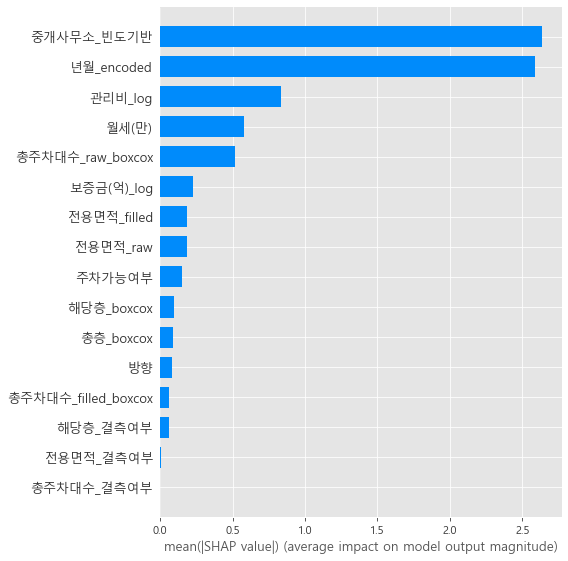

In [374]:
shap.summary_plot(shap_values[1], X, plot_type="bar")

중개사무소와 년월 피처가 허위매물예측에 있어서 가장 큰 기여를 하였다. 전용면적의 경우 filled와 raw가 비슷한 성능을 가지며, 총주차대수는 raw일때가 더 많은 기여를 하였다. 또한 결측여부 피처들은 모두 허위매물 예측에 거의 도움이 되지 않은 듯 하다.

In [375]:
# SHAP 기준 피처 중요도 순 정렬
shap_array = shap_values[1]
shap_importance = np.abs(shap_array).mean(axis=0)
shap_df = pd.DataFrame({
    "feature": X.columns,
    "shap_mean_abs": shap_importance
}).sort_values("shap_mean_abs", ascending=False).reset_index(drop=True)

# 실험 결과 저장 리스트
rfe_results = []

# 피처 하나씩 줄이면서 반복
for i in range(len(shap_df), 0, -1):
    selected_feats = shap_df["feature"].iloc[:i].tolist()
    X_subset = X[selected_feats]
    
    # 교차검증 준비
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1s, precisions, recalls = [], [], []
    
    for train_idx, test_idx in cv.split(X_subset, y):
        X_train, X_test = X_subset.iloc[train_idx], X_subset.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model = LGBMClassifier(**best_params, random_state=42)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        f1s.append(f1_score(y_test, y_pred))
        precisions.append(precision_score(y_test, y_pred))
        recalls.append(recall_score(y_test, y_pred))
    
    rfe_results.append({
        "사용 피처 수": i,
        "F1 평균": np.mean(f1s),
        "Precision 평균": np.mean(precisions),
        "Recall 평균": np.mean(recalls)
    })

# 결과 정리
rfe_df = pd.DataFrame(rfe_results)
display(rfe_df)

,사용 피처 수,F1 평균,Precision 평균,Recall 평균
0,16,0.837830,0.900616,0.788916
1,15,0.837830,0.900616,0.788916
2,14,0.849702,0.910879,0.802709
3,13,0.849917,0.909894,0.802709
4,12,0.829651,0.897990,0.782020
5,11,0.843893,0.900002,0.802956
6,10,0.836663,0.909998,0.781773
7,9,0.838394,0.885466,0.802709
8,8,0.815339,0.880183,0.767241
9,7,0.839168,0.902623,0.788424


세 결측피처를 제외한 13개의 피처를 통한 예측일때의 성능이 가장 좋다. 따라서 세 피처를 제외해 주도록 한다.

## 4) Threshold 튜닝

,Threshold,F1 평균,Precision 평균,Recall 평균
0,0.10,0.827577,0.800259,0.872414
1,0.15,0.827886,0.812810,0.858374
2,0.20,0.830608,0.840002,0.830542
3,0.25,0.842497,0.865092,0.830542
4,0.30,0.846801,0.881747,0.823645
5,0.35,0.850119,0.890443,0.823645
6,0.40,0.849259,0.894548,0.816749
7,0.45,0.849259,0.894548,0.816749
8,0.50,0.849917,0.909894,0.802709
9,0.55,0.840633,0.909894,0.788916


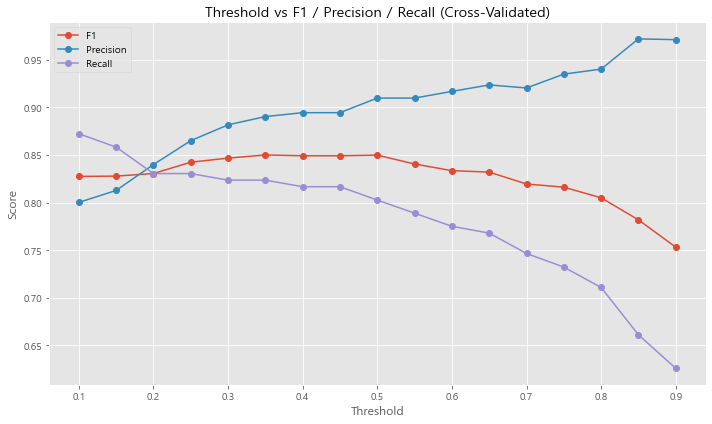

In [376]:
# 최종 피처셋 (13개 기준)
X_final = X[shap_df["feature"].iloc[:13]]
y_final = y

# threshold 후보군
thresholds = np.arange(0.1, 0.91, 0.05)

# 결과 저장용 딕셔너리
threshold_scores = {t: {"f1": [], "precision": [], "recall": []} for t in thresholds}

# 교차검증
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in cv.split(X_final, y_final):
    X_train, X_test = X_final.iloc[train_idx], X_final.iloc[test_idx]
    y_train, y_test = y_final.iloc[train_idx], y_final.iloc[test_idx]

    model = LGBMClassifier(**best_params, random_state=42)
    model.fit(X_train, y_train)
    
    y_proba = model.predict_proba(X_test)[:, 1]  # 확률 예측

    for t in thresholds:
        y_pred = (y_proba >= t).astype(int)
        threshold_scores[t]["f1"].append(f1_score(y_test, y_pred))
        threshold_scores[t]["precision"].append(precision_score(y_test, y_pred))
        threshold_scores[t]["recall"].append(recall_score(y_test, y_pred))

# 평균 점수 계산
summary = []
for t in thresholds:
    summary.append({
        "Threshold": t,
        "F1 평균": np.mean(threshold_scores[t]["f1"]),
        "Precision 평균": np.mean(threshold_scores[t]["precision"]),
        "Recall 평균": np.mean(threshold_scores[t]["recall"]),
    })

threshold_df = pd.DataFrame(summary)
display(threshold_df)

# 시각화
plt.figure(figsize=(10, 6))
plt.plot(threshold_df["Threshold"], threshold_df["F1 평균"], label="F1", marker='o')
plt.plot(threshold_df["Threshold"], threshold_df["Precision 평균"], label="Precision", marker='o')
plt.plot(threshold_df["Threshold"], threshold_df["Recall 평균"], label="Recall", marker='o')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Threshold vs F1 / Precision / Recall (Cross-Validated)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

재현율과 정밀도의 격차는 0.2에서 최소이며 0.9로 갈수록 차이가 점점 증가한다. threshold가 0.35일때 f1 스코어가 가장 높고, 정밀도와 재현율의 격차가 심하지 않은 지점인 0.35를 threshold로 지정하며, 가장 안정적인 threshold값이 필요하다면 0.2로 지정한다.

## 5) 최종 모델 저장

In [380]:
import joblib
from lightgbm import LGBMClassifier

# 전체 데이터로 재학습 (최종 피처셋 13개)
X_final = X[shap_df["feature"].iloc[:13]]
y_final = y

final_model = LGBMClassifier(**best_params, random_state=42)
final_model.fit(X_final, y_final)

# 모델 저장
joblib.dump(final_model, "final_lgbm_model.pkl")

# 피처셋 저장 (추후 재사용용)
joblib.dump(shap_df["feature"].iloc[:13].tolist(), "final_features.pkl")

# threshold 값도 기록용으로 따로 저장
with open("final_threshold.txt", "w") as f:
    f.write("0.35")

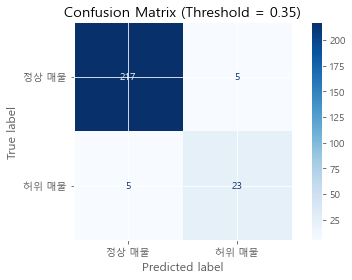

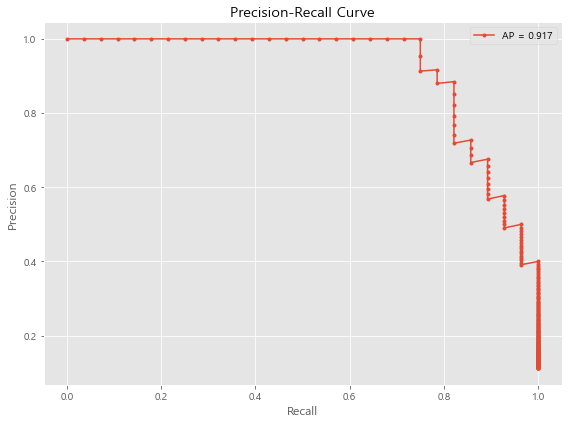

In [385]:
# train-test split
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.2, random_state=42, stratify=y_final)

# 모델 학습
final_model = LGBMClassifier(**best_params, random_state=42)
final_model.fit(X_train, y_train)

# 예측
y_pred_proba = final_model.predict_proba(X_test)[:, 1]
y_pred = (y_pred_proba >= 0.35).astype(int)

# Confusion Matrix (y_test vs y_pred)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["정상 매물", "허위 매물"])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix (Threshold = 0.35)")
plt.tight_layout()
plt.show()

# Precision-Recall Curve (y_test vs y_pred_proba)
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
ap = average_precision_score(y_test, y_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f"AP = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## 비즈니스 시사점

최종 선정된 모델은 중개사무소의 활동 빈도, 매물의 게재 시기, 가격 관련 정보 등을 바탕으로 허위매물 여부를 높은 정확도로 예측할 수 있었다. 특히 특정 시기에 집중적으로 등장하는 허위매물 패턴과 일부 중개사무소의 반복적인 이상 행위가 주요 예측 요인으로 작용함을 확인하였다. 이는 실제 플랫폼 운영 과정에서 허위매물 탐지를 위한 사전 경고 시스템 또는 위험 등급 기반의 리스팅 감시 체계를 설계하는 데 활용될 수 있다. 또한 플랫폼 사용자의 신뢰도를 제고하고, 내부 모니터링 인력의 검수 부담을 줄이는 데에도 효과적일 것으로 기대된다.